# Auto Encoders and Variational Auto Encoders on MNIST

In [225]:
# Python lib
from typing import List, Tuple

# Scientific utilities
import numpy as np
import pandas as pd
from scipy.stats import norm as ndist

# PyTorch
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader
from torchvision.utils import make_grid

# Vizualisations
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [2]:
DATA_DIR = 'data'

BATCH_SIZE = 128

## Preparing Data

In [3]:
def get_mnist_ds(train: bool):

    return torchvision.datasets.MNIST(DATA_DIR, 
                                      train=train, 
                                      transform=transforms.Compose([
                                                    transforms.ToTensor(),
                                                ]), 
                                      target_transform=None, 
                                      download=True)

def get_mnist_dls():
    
    train_ds = get_mnist_ds(train=True)
    valid_ds = get_mnist_ds(train=False)
    
    return (torch.utils.data.DataLoader(train_ds, 
                                       batch_size=BATCH_SIZE, 
                                       shuffle=True, 
                                       pin_memory=False),
            
            torch.utils.data.DataLoader(valid_ds, 
                                        batch_size=2 * BATCH_SIZE, 
                                        shuffle=False, 
                                        pin_memory=False))

train_dl, valid_dl = get_mnist_dls()

len(train_dl.dataset), len(valid_dl.dataset)

(60000, 10000)

torch.Size([128, 1, 28, 28]) tensor(0.1352) tensor(0.3124) tensor(0.) tensor(1.)


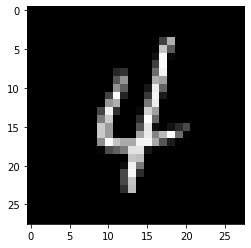

torch.Size([128, 1, 28, 28]) tensor(0.1313) tensor(0.3082) tensor(0.) tensor(1.)


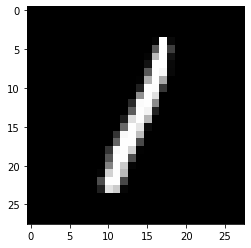

torch.Size([128, 1, 28, 28]) tensor(0.1283) tensor(0.3052) tensor(0.) tensor(1.)


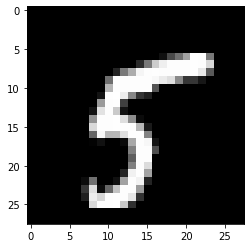

torch.Size([128, 1, 28, 28]) tensor(0.1278) tensor(0.3053) tensor(0.) tensor(1.)


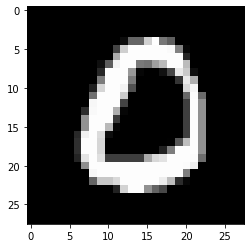

In [4]:
for i, (x, y) in enumerate(train_dl):
    print(x.shape, x.mean(), x.std(), x.min(), x.max())
    plt.imshow(x[0][0], cmap='gray')
    plt.show()
    if i > 2: break

## Training Vanilla Auto Encoder

In [288]:
def init_weights(m: nn.Module):

    for m in m.modules():
        if isinstance(m, nn.Linear):
            nn.init.kaiming_normal_(m.weight, nonlinearity='relu')
            nn.init.constant_(m.bias, 0)

In [289]:
class Encoder(nn.Module):
    def __init__(self, inp_shape: Tuple[int, int], hidden_dim: int, out_dim: int):
        super().__init__()
        
        self.enc = nn.Sequential(nn.Flatten(),
                                 nn.Linear(np.prod(inp_shape), hidden_dim),
                                 nn.ReLU(),
                                 nn.Linear(hidden_dim, out_dim))
        
        init_weights(self)
        
    def forward(self, x): return self.enc(x)

In [290]:
m = Encoder(inp_shape=(28, 28), hidden_dim=512, out_dim=256)
m

Encoder(
  (enc): Sequential(
    (0): Flatten()
    (1): Linear(in_features=784, out_features=512, bias=True)
    (2): ReLU()
    (3): Linear(in_features=512, out_features=256, bias=True)
  )
)

In [292]:
class Decoder(nn.Module):
    def __init__(self, inp_shape: Tuple[int, int], hidden_dim: int, out_dim: int):
        super().__init__()
        
        self.inp_shape = inp_shape
        
        self.dec = nn.Sequential(nn.Linear(out_dim, hidden_dim),
                                 nn.ReLU(),
                                 nn.Linear(hidden_dim, np.prod(inp_shape)))
        
        init_weights(self)
        
    def forward(self, x): return torch.sigmoid(self.dec(x)).view(x.shape[0], *self.inp_shape)

In [293]:
m = Decoder(inp_shape=(28, 28), hidden_dim=512, out_dim=256)
m

Decoder(
  (dec): Sequential(
    (0): Linear(in_features=256, out_features=512, bias=True)
    (1): ReLU()
    (2): Linear(in_features=512, out_features=784, bias=True)
  )
)

In [294]:
class AutoEncoder(nn.Module):
    def __init__(self, inp_shape: Tuple[int, int], hidden_dim: int, out_dim: int):
        super().__init__()
        
        self.ae = nn.Sequential(Encoder(inp_shape, hidden_dim, out_dim),
                                Decoder(inp_shape, hidden_dim, out_dim))
        
    def forward(self, x): return self.ae(x)

In [295]:
m = AutoEncoder(inp_shape=(1, 28, 28), hidden_dim=512, out_dim=256)
m

AutoEncoder(
  (ae): Sequential(
    (0): Encoder(
      (enc): Sequential(
        (0): Flatten()
        (1): Linear(in_features=784, out_features=512, bias=True)
        (2): ReLU()
        (3): Linear(in_features=512, out_features=256, bias=True)
      )
    )
    (1): Decoder(
      (dec): Sequential(
        (0): Linear(in_features=256, out_features=512, bias=True)
        (1): ReLU()
        (2): Linear(in_features=512, out_features=784, bias=True)
      )
    )
  )
)

In [297]:
o = torch.randn(BATCH_SIZE, 1, 28, 28)
assert m(o).shape == o.shape

epoch 1 | iter 5 | loss 0.17613
epoch 1 | iter 10 | loss 0.13233


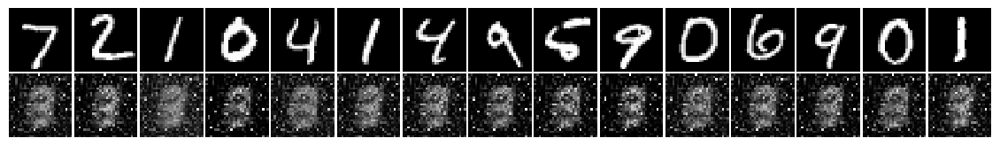

epoch 1 | iter 15 | loss 0.08110
epoch 1 | iter 20 | loss 0.07050


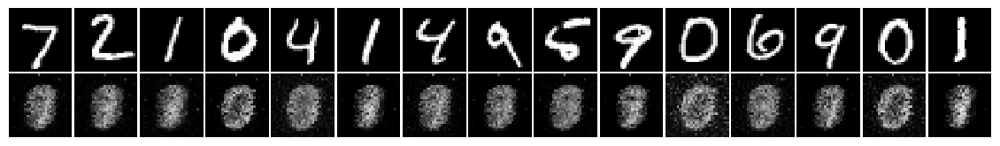

epoch 1 | iter 25 | loss 0.06469
epoch 1 | iter 30 | loss 0.05975


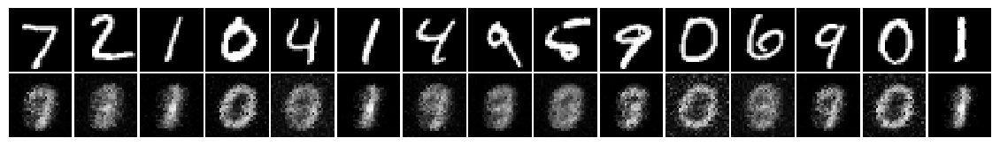

epoch 1 | iter 35 | loss 0.05777
epoch 1 | iter 40 | loss 0.05472


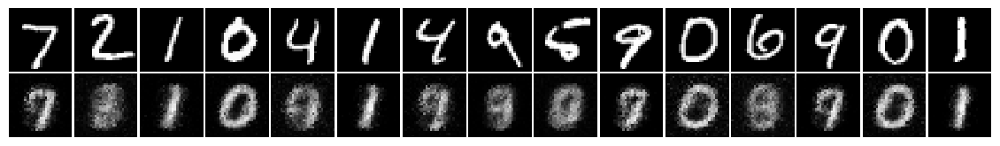

epoch 1 | iter 45 | loss 0.05144
epoch 1 | iter 50 | loss 0.04837


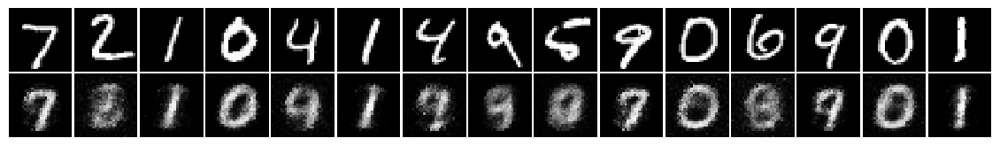

epoch 1 | iter 55 | loss 0.04616
epoch 1 | iter 60 | loss 0.04534


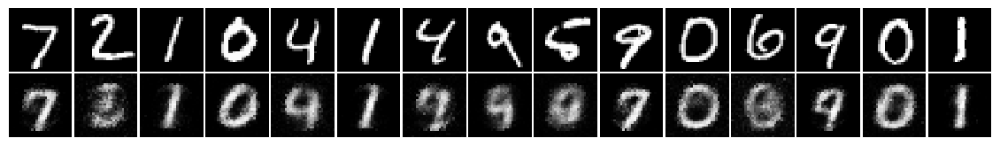

epoch 1 | iter 65 | loss 0.04350
epoch 1 | iter 70 | loss 0.04060


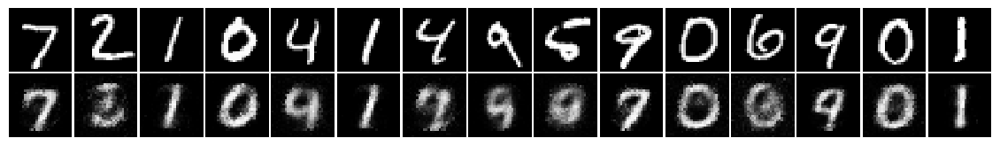

epoch 1 | iter 75 | loss 0.03936
epoch 1 | iter 80 | loss 0.03826


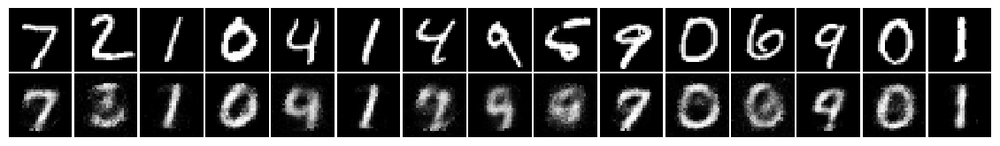

epoch 1 | iter 85 | loss 0.03842
epoch 1 | iter 90 | loss 0.03695


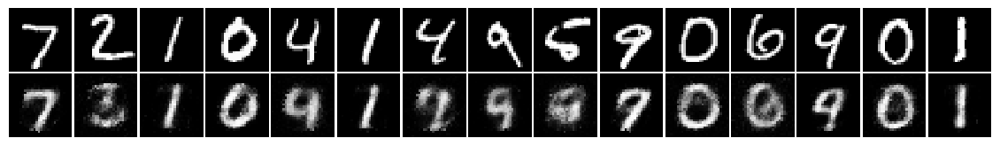

epoch 1 | iter 95 | loss 0.03721
epoch 1 | iter 100 | loss 0.03443


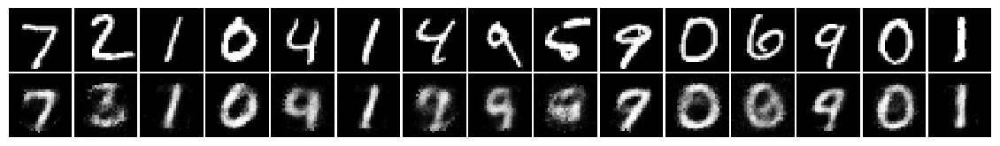

epoch 1 | iter 105 | loss 0.03528
epoch 1 | iter 110 | loss 0.03334


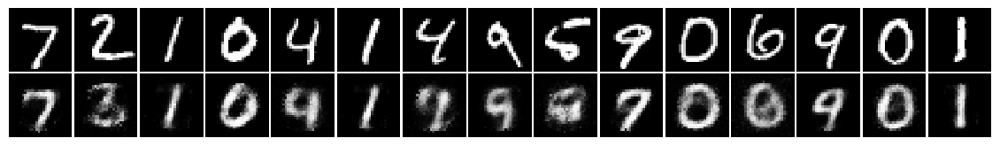

epoch 1 | iter 115 | loss 0.03335
epoch 1 | iter 120 | loss 0.03287


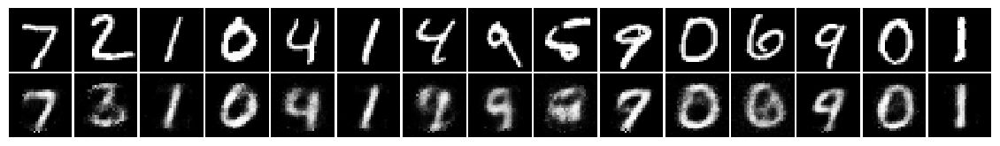

epoch 1 | iter 125 | loss 0.03234
epoch 1 | iter 130 | loss 0.03120


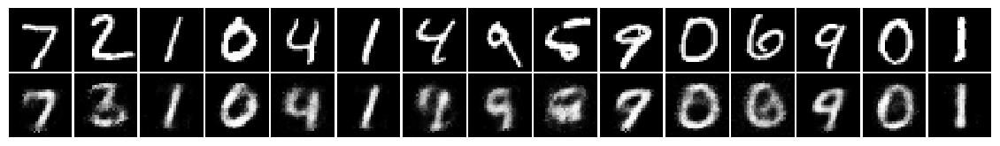

epoch 1 | iter 135 | loss 0.03117
epoch 1 | iter 140 | loss 0.03070


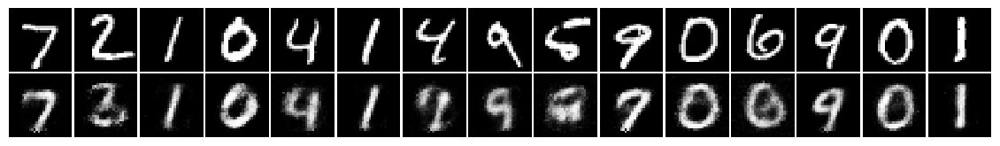

epoch 1 | iter 145 | loss 0.03042
epoch 1 | iter 150 | loss 0.02985


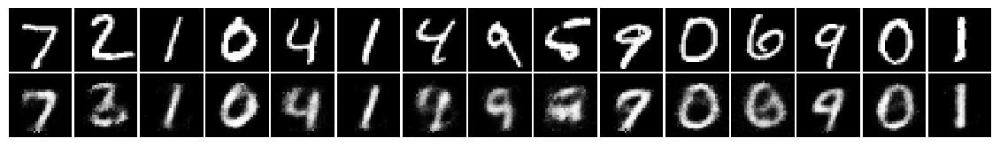

epoch 1 | iter 155 | loss 0.03051
epoch 1 | iter 160 | loss 0.03003


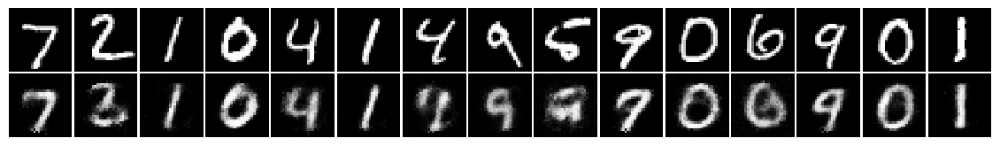

epoch 1 | iter 165 | loss 0.02907
epoch 1 | iter 170 | loss 0.02995


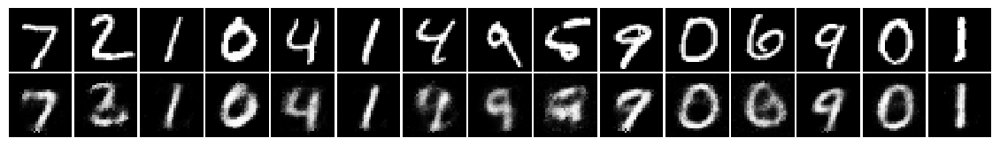

epoch 1 | iter 175 | loss 0.02935
epoch 1 | iter 180 | loss 0.02919


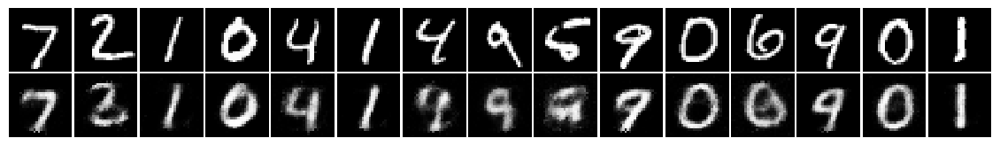

epoch 1 | iter 185 | loss 0.02917
epoch 1 | iter 190 | loss 0.02829


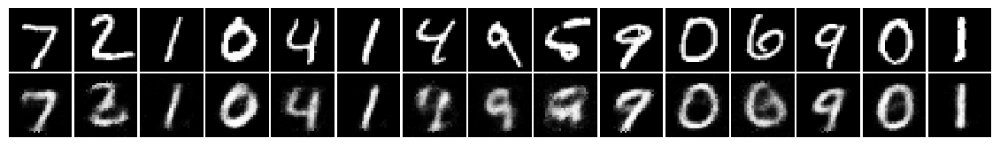

epoch 1 | iter 195 | loss 0.02923
epoch 1 | iter 200 | loss 0.02880


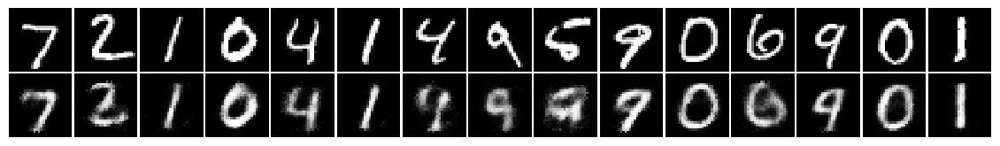

epoch 1 | iter 205 | loss 0.02725
epoch 1 | iter 210 | loss 0.02707


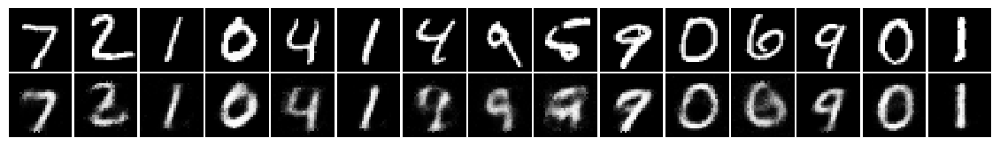

epoch 1 | iter 215 | loss 0.02724
epoch 1 | iter 220 | loss 0.02756


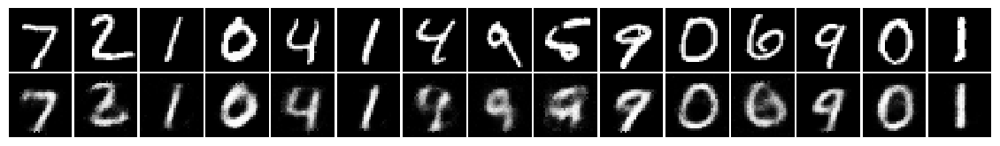

epoch 1 | iter 225 | loss 0.02616
epoch 1 | iter 230 | loss 0.02694


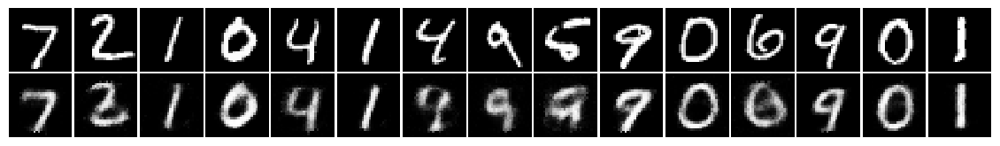

epoch 1 | iter 235 | loss 0.02653
epoch 1 | iter 240 | loss 0.02611


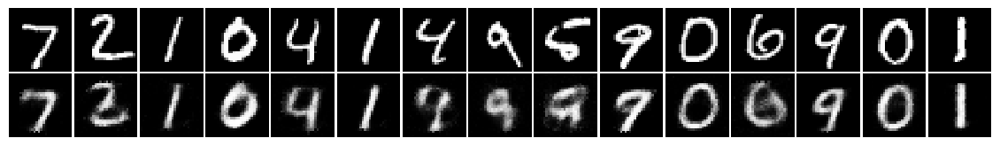

epoch 1 | iter 245 | loss 0.02727
epoch 1 | iter 250 | loss 0.02561


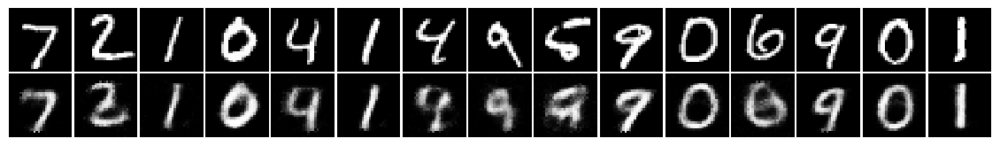

epoch 1 | iter 255 | loss 0.02581
epoch 1 | iter 260 | loss 0.02586


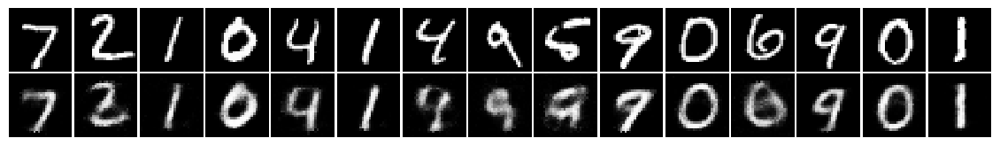

epoch 1 | iter 265 | loss 0.02565
epoch 1 | iter 270 | loss 0.02553


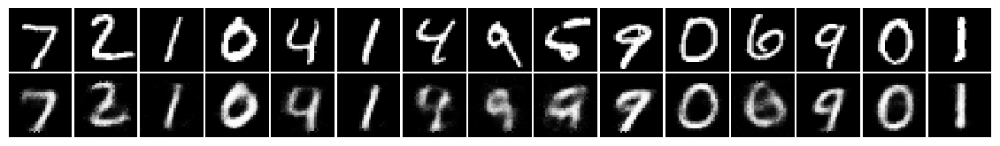

epoch 1 | iter 275 | loss 0.02466
epoch 1 | iter 280 | loss 0.02543


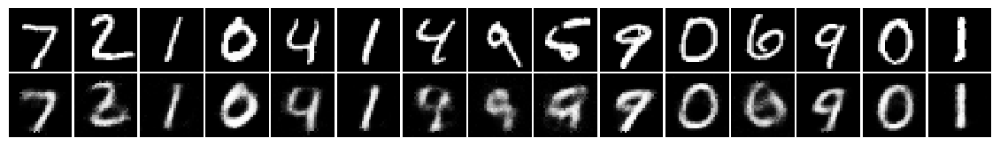

epoch 1 | iter 285 | loss 0.02491
epoch 1 | iter 290 | loss 0.02422


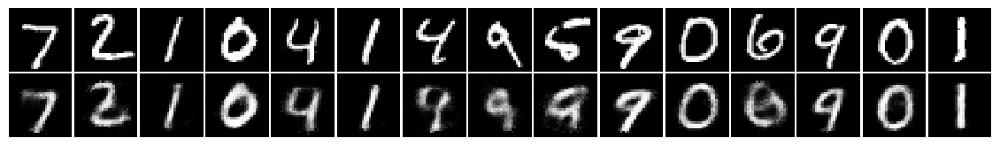

epoch 1 | iter 295 | loss 0.02458
epoch 1 | iter 300 | loss 0.02495


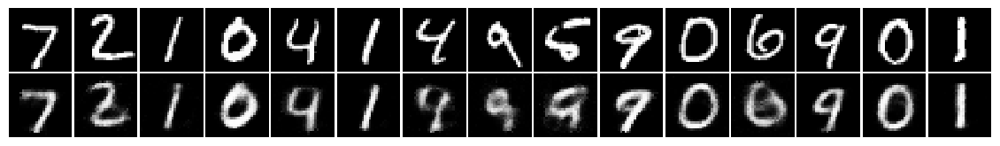

epoch 1 | iter 305 | loss 0.02505
epoch 1 | iter 310 | loss 0.02486


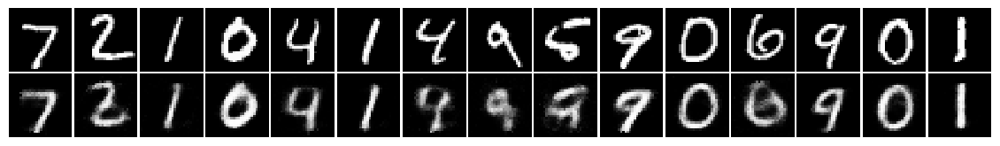

epoch 1 | iter 315 | loss 0.02475
epoch 1 | iter 320 | loss 0.02453


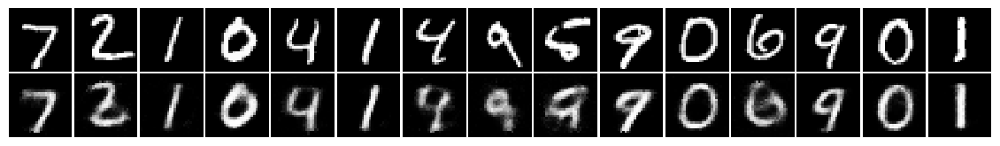

epoch 1 | iter 325 | loss 0.02449
epoch 1 | iter 330 | loss 0.02353


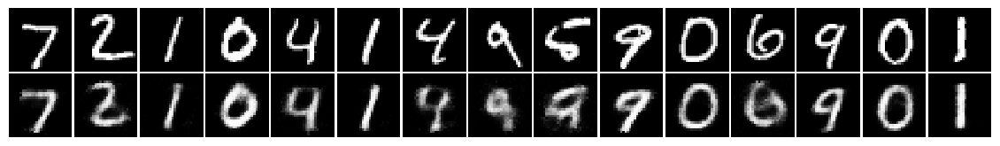

epoch 1 | iter 335 | loss 0.02405
epoch 1 | iter 340 | loss 0.02395


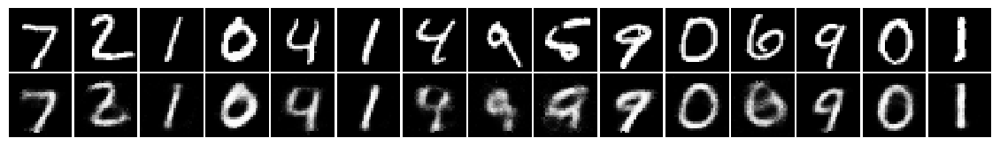

epoch 1 | iter 345 | loss 0.02375
epoch 1 | iter 350 | loss 0.02358


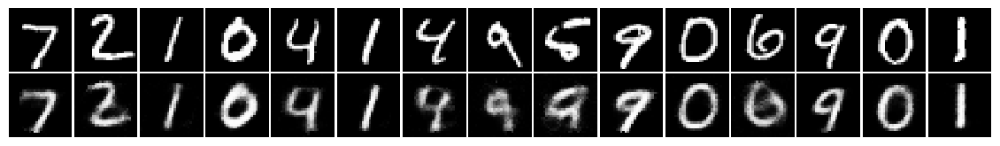

epoch 1 | iter 355 | loss 0.02347
epoch 1 | iter 360 | loss 0.02336


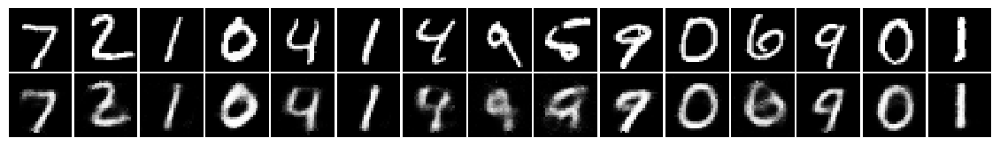

epoch 1 | iter 365 | loss 0.02363
epoch 1 | iter 370 | loss 0.02324


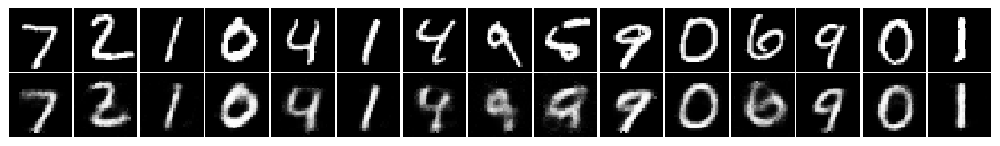

epoch 1 | iter 375 | loss 0.02389
epoch 1 | iter 380 | loss 0.02257


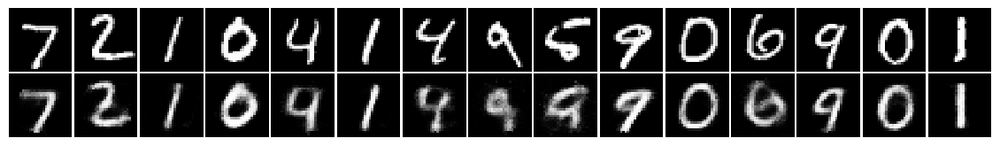

epoch 1 | iter 385 | loss 0.02383
epoch 1 | iter 390 | loss 0.02339


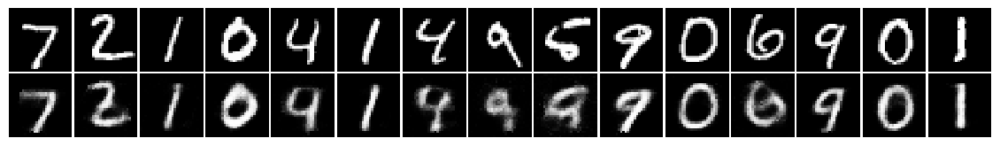

epoch 1 | iter 395 | loss 0.02210
epoch 1 | iter 400 | loss 0.02340


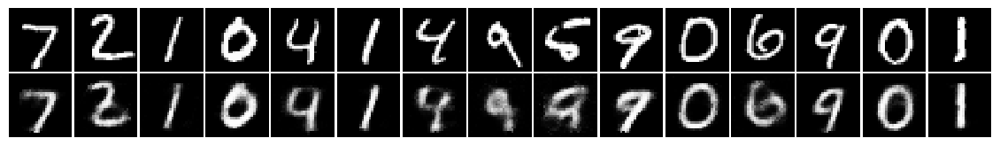

epoch 1 | iter 405 | loss 0.02258
epoch 1 | iter 410 | loss 0.02276


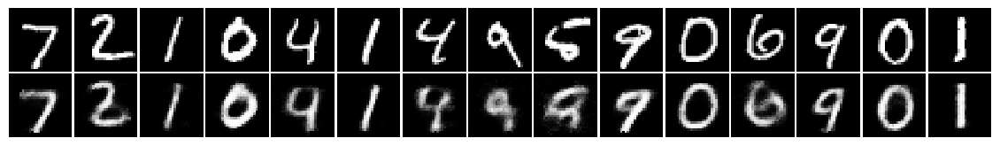

epoch 1 | iter 415 | loss 0.02209
epoch 1 | iter 420 | loss 0.02359


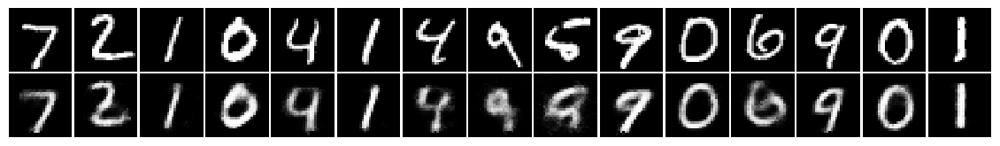

epoch 1 | iter 425 | loss 0.02257
epoch 1 | iter 430 | loss 0.02312


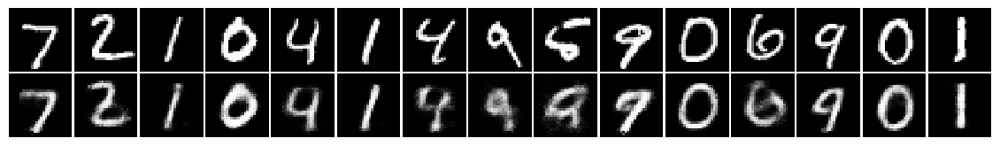

epoch 1 | iter 435 | loss 0.02389
epoch 1 | iter 440 | loss 0.02259


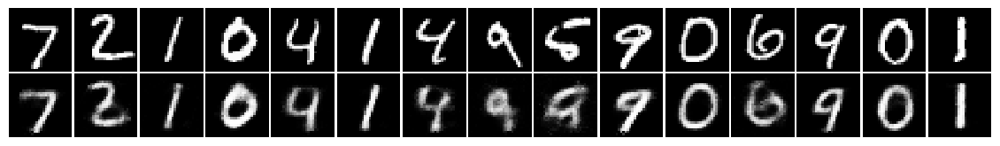

epoch 1 | iter 445 | loss 0.02234
epoch 1 | iter 450 | loss 0.02225


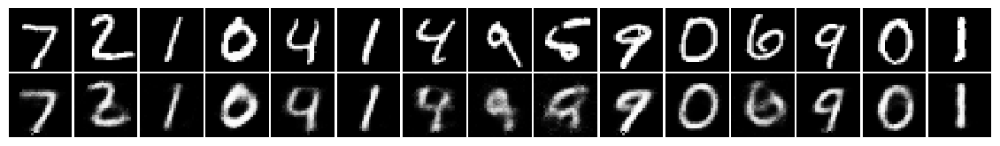

epoch 1 | iter 455 | loss 0.02211
epoch 1 | iter 460 | loss 0.02246


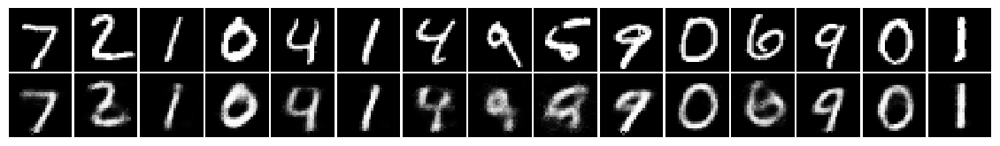

epoch 1 | iter 465 | loss 0.02169
epoch 1 | iter 470 | loss 0.02273


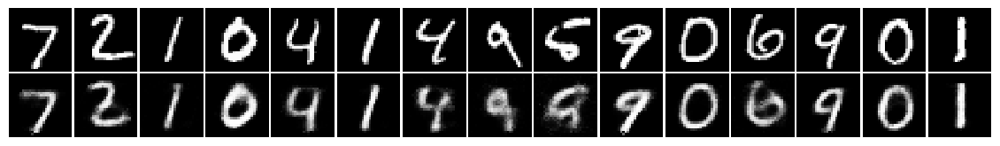

epoch 2 | iter 475 | loss 0.02186
epoch 2 | iter 480 | loss 0.02176


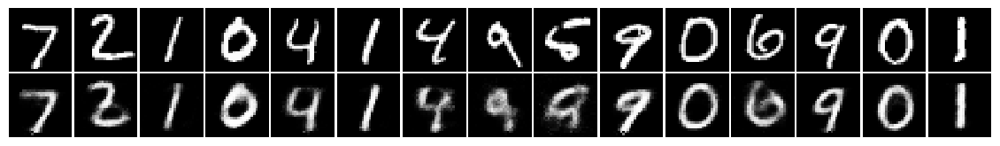

epoch 2 | iter 485 | loss 0.02190
epoch 2 | iter 490 | loss 0.02203


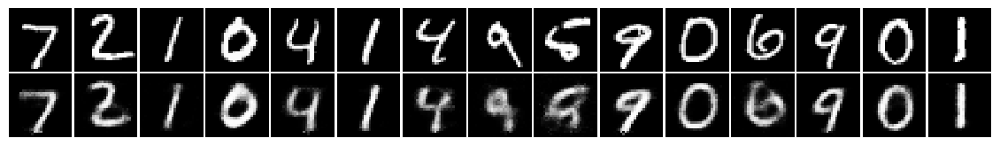

epoch 2 | iter 495 | loss 0.02180
epoch 2 | iter 500 | loss 0.02125


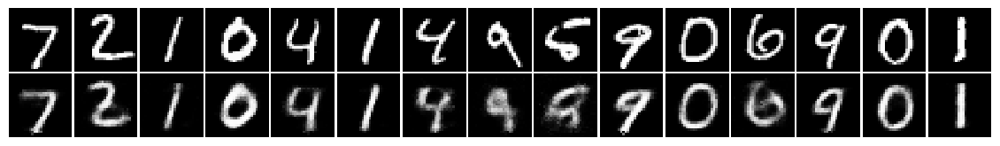

In [299]:
def show_summary(valid_dl: DataLoader, model: DataLoader):
    
    N_SAMPLES = 15
    
    model.eval()
    
    actuals, preds = [], []
    with torch.no_grad():
        for i, (x, y) in enumerate(valid_dl.dataset):
            
            actuals.append(x)
            
            recon_x = model(x.unsqueeze(0).cuda()).cpu()
            
            preds.append(recon_x.squeeze(0))
            
            if i + 1 == N_SAMPLES:
                break
                
    model.train()
            
    grid = make_grid([*actuals, *preds], pad_value=1, padding=1, nrow=N_SAMPLES)

    plt.figure(figsize=(20, 4))
    plt.imshow(grid.permute(1, 2, 0))
    plt.axis('off')
    plt.show()
        
def train_ae(train_dl: DataLoader, 
             valid_dl: DataLoader,
             model: nn.Module,
             n_epochs: int,
             max_iters: int = -1):
    
    LOG_INTERVAL = 5
    SUMMARY_INTERVAL = 10
    
    model = model.cuda()
    
    crit = nn.MSELoss(reduction='mean')
    optim = torch.optim.Adam(model.parameters())
    
    acc_loss = 0
    
    i = 1
    for epoch in range(n_epochs):
        for x, _ in train_dl:
            
            optim.zero_grad()
            
            x = x.cuda()
            
            x_recon = model(x)
            
            loss = crit(x, x_recon)
            
            acc_loss += loss.item()
            
            loss.backward()
            
            optim.step()
            
            if (i + 1) % LOG_INTERVAL == 0:
                print('epoch %d | iter %d | loss %.5f' % (epoch + 1, i + 1, acc_loss / LOG_INTERVAL))
                acc_loss = 0
                
            if (i + 1) % SUMMARY_INTERVAL == 0:
                show_summary(valid_dl, model)
                
            i += 1
            
            if i == max_iters:
                return
            
ae = AutoEncoder(inp_shape=(1, 28, 28), hidden_dim=512, out_dim=10)
train_ae(train_dl, valid_dl, ae, 50, 500)

In [191]:
#torch.save(ae.state_dict(), './ae-20')

## Training Vanilla Variational Auto Encoder

In [300]:
class VariationalAutoEncoder(nn.Module):
    def __init__(self, inp_shape: Tuple[int, int], hidden_dim: int, out_dim: int, z_dim: int):
        super().__init__()
        
        self.enc = Encoder(inp_shape, hidden_dim, out_dim)
        self.dec = Decoder(inp_shape, hidden_dim, out_dim)
        
        self.mu     = nn.Linear(out_dim, z_dim)
        self.logvar = nn.Linear(out_dim, z_dim)
        
        self.fc = nn.Linear(z_dim, out_dim)
        
        init_weights(self)
        
    def encode(self, x):
        
        enc = self.enc(x)
        
        mu, logvar = self.mu(enc), self.logvar(enc)
        
        return mu, logvar
        
    def sample_z(self, mu, logvar):
        
        eps = torch.rand_like(mu)
        
        return mu + eps * torch.exp(0.5 * logvar)
    
    def decode(self, z):
        
        return self.dec(self.fc(z))
        
    def forward(self, x):
        
        mu, logvar = self.encode(x)
        
        z = self.sample_z(mu, logvar)
        
        return self.decode(z)

In [301]:
m = VariationalAutoEncoder(inp_shape=(1, 28, 28), hidden_dim=512, out_dim=256, z_dim=2)
m

VariationalAutoEncoder(
  (enc): Encoder(
    (enc): Sequential(
      (0): Flatten()
      (1): Linear(in_features=784, out_features=512, bias=True)
      (2): ReLU()
      (3): Linear(in_features=512, out_features=256, bias=True)
    )
  )
  (dec): Decoder(
    (dec): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): ReLU()
      (2): Linear(in_features=512, out_features=784, bias=True)
    )
  )
  (mu): Linear(in_features=256, out_features=2, bias=True)
  (logvar): Linear(in_features=256, out_features=2, bias=True)
  (fc): Linear(in_features=2, out_features=256, bias=True)
)

epoch 1 | iter 20 | loss 95.87092 | KL loss 2.26055 | recon loss 93.61037 
epoch 1 | iter 40 | loss 48.30614 | KL loss 1.38721 | recon loss 46.91892 
epoch 1 | iter 60 | loss 40.70184 | KL loss 2.12824 | recon loss 38.57361 
epoch 1 | iter 80 | loss 36.35288 | KL loss 2.45039 | recon loss 33.90249 
epoch 1 | iter 100 | loss 33.55368 | KL loss 2.80081 | recon loss 30.75286 


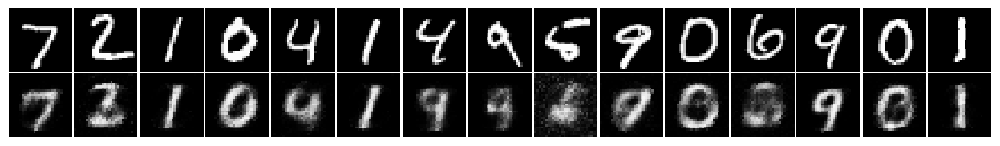

epoch 1 | iter 120 | loss 32.19809 | KL loss 3.01435 | recon loss 29.18375 
epoch 1 | iter 140 | loss 30.61812 | KL loss 3.10853 | recon loss 27.50960 
epoch 1 | iter 160 | loss 29.84780 | KL loss 3.29916 | recon loss 26.54864 
epoch 1 | iter 180 | loss 29.19078 | KL loss 3.31097 | recon loss 25.87981 
epoch 1 | iter 200 | loss 28.63745 | KL loss 3.32625 | recon loss 25.31120 


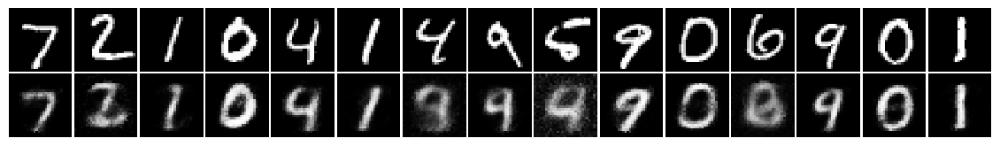

epoch 1 | iter 220 | loss 27.95909 | KL loss 3.30694 | recon loss 24.65216 
epoch 1 | iter 240 | loss 27.49704 | KL loss 3.40301 | recon loss 24.09403 
epoch 1 | iter 260 | loss 27.33629 | KL loss 3.42422 | recon loss 23.91207 
epoch 1 | iter 280 | loss 27.04931 | KL loss 3.44304 | recon loss 23.60628 
epoch 1 | iter 300 | loss 26.48495 | KL loss 3.43736 | recon loss 23.04759 


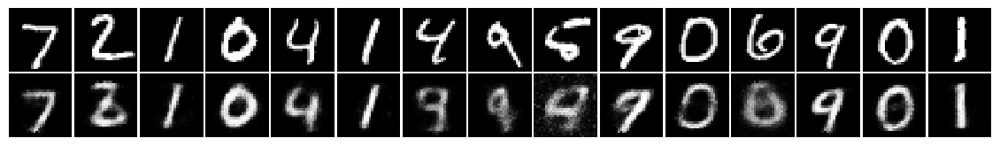

epoch 1 | iter 320 | loss 26.66017 | KL loss 3.50190 | recon loss 23.15827 
epoch 1 | iter 340 | loss 26.10538 | KL loss 3.44298 | recon loss 22.66240 
epoch 1 | iter 360 | loss 25.91848 | KL loss 3.52282 | recon loss 22.39566 
epoch 1 | iter 380 | loss 25.58642 | KL loss 3.56333 | recon loss 22.02308 
epoch 1 | iter 400 | loss 25.52739 | KL loss 3.58021 | recon loss 21.94718 


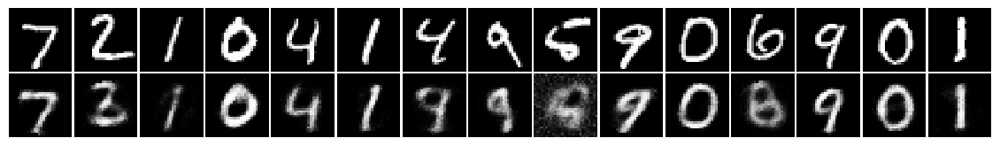

epoch 1 | iter 420 | loss 25.55660 | KL loss 3.58418 | recon loss 21.97242 
epoch 1 | iter 440 | loss 25.41289 | KL loss 3.57060 | recon loss 21.84229 
epoch 1 | iter 460 | loss 25.47461 | KL loss 3.65985 | recon loss 21.81477 
epoch 2 | iter 480 | loss 25.15094 | KL loss 3.66226 | recon loss 21.48869 
epoch 2 | iter 500 | loss 25.02386 | KL loss 3.59909 | recon loss 21.42477 


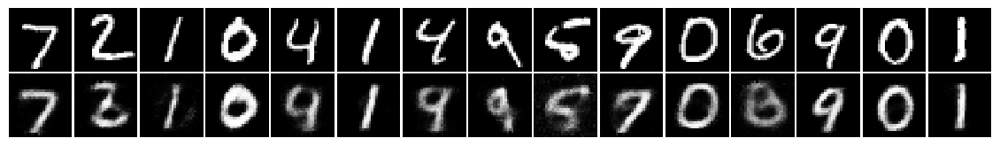

epoch 2 | iter 520 | loss 24.80479 | KL loss 3.62083 | recon loss 21.18397 
epoch 2 | iter 540 | loss 24.38167 | KL loss 3.66435 | recon loss 20.71732 
epoch 2 | iter 560 | loss 24.27070 | KL loss 3.66644 | recon loss 20.60426 
epoch 2 | iter 580 | loss 24.73942 | KL loss 3.70574 | recon loss 21.03369 
epoch 2 | iter 600 | loss 24.03831 | KL loss 3.71621 | recon loss 20.32210 


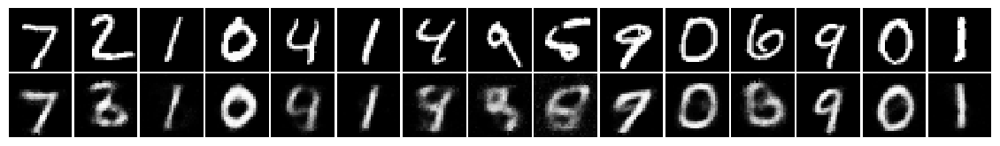

epoch 2 | iter 620 | loss 24.55337 | KL loss 3.68824 | recon loss 20.86514 
epoch 2 | iter 640 | loss 24.11818 | KL loss 3.77167 | recon loss 20.34652 
epoch 2 | iter 660 | loss 24.09780 | KL loss 3.74991 | recon loss 20.34789 
epoch 2 | iter 680 | loss 24.05028 | KL loss 3.81838 | recon loss 20.23190 
epoch 2 | iter 700 | loss 23.82084 | KL loss 3.75327 | recon loss 20.06757 


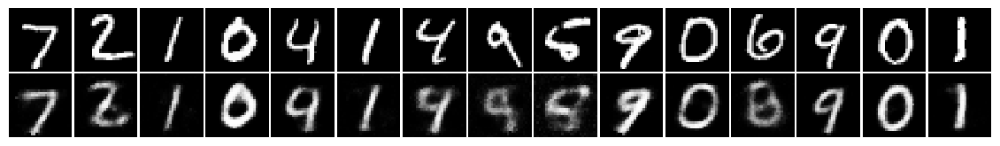

epoch 2 | iter 720 | loss 23.83589 | KL loss 3.72933 | recon loss 20.10656 
epoch 2 | iter 740 | loss 24.26198 | KL loss 3.73240 | recon loss 20.52959 
epoch 2 | iter 760 | loss 23.98710 | KL loss 3.83388 | recon loss 20.15323 
epoch 2 | iter 780 | loss 23.87717 | KL loss 3.81811 | recon loss 20.05906 
epoch 2 | iter 800 | loss 23.86530 | KL loss 3.80676 | recon loss 20.05855 


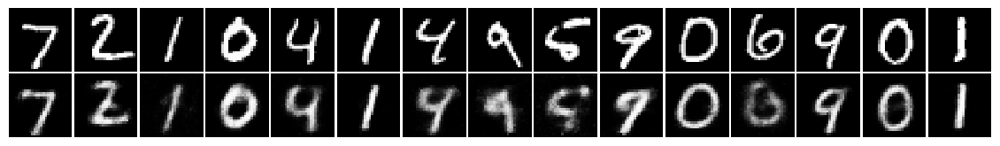

epoch 2 | iter 820 | loss 23.78648 | KL loss 3.77429 | recon loss 20.01219 
epoch 2 | iter 840 | loss 23.89057 | KL loss 3.79032 | recon loss 20.10026 
epoch 2 | iter 860 | loss 23.22996 | KL loss 3.82002 | recon loss 19.40993 
epoch 2 | iter 880 | loss 23.47139 | KL loss 3.82420 | recon loss 19.64719 
epoch 2 | iter 900 | loss 23.60544 | KL loss 3.82615 | recon loss 19.77929 


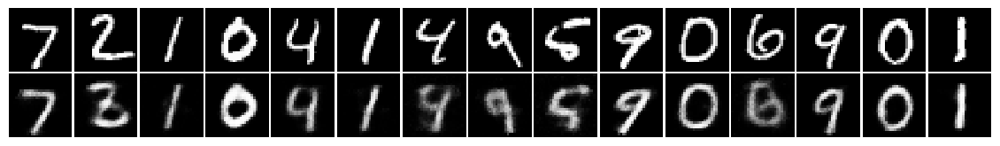

epoch 2 | iter 920 | loss 23.62292 | KL loss 3.81386 | recon loss 19.80906 
epoch 3 | iter 940 | loss 23.09538 | KL loss 3.81224 | recon loss 19.28315 
epoch 3 | iter 960 | loss 23.03346 | KL loss 3.82800 | recon loss 19.20546 
epoch 3 | iter 980 | loss 23.02859 | KL loss 3.79427 | recon loss 19.23431 
epoch 3 | iter 1000 | loss 23.08749 | KL loss 3.87130 | recon loss 19.21619 


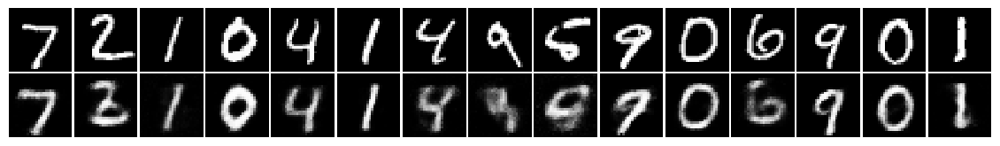

epoch 3 | iter 1020 | loss 23.28230 | KL loss 3.89189 | recon loss 19.39042 
epoch 3 | iter 1040 | loss 23.24889 | KL loss 3.90183 | recon loss 19.34706 
epoch 3 | iter 1060 | loss 23.22002 | KL loss 3.85798 | recon loss 19.36205 
epoch 3 | iter 1080 | loss 22.88390 | KL loss 3.84850 | recon loss 19.03540 
epoch 3 | iter 1100 | loss 23.07066 | KL loss 3.88574 | recon loss 19.18492 


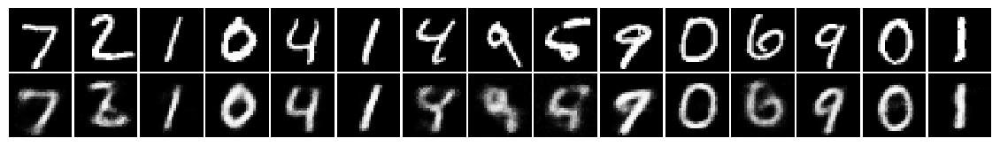

epoch 3 | iter 1120 | loss 22.93084 | KL loss 3.87793 | recon loss 19.05291 
epoch 3 | iter 1140 | loss 22.98449 | KL loss 3.91878 | recon loss 19.06572 
epoch 3 | iter 1160 | loss 22.86618 | KL loss 3.91749 | recon loss 18.94868 
epoch 3 | iter 1180 | loss 23.01214 | KL loss 3.93059 | recon loss 19.08155 
epoch 3 | iter 1200 | loss 23.15233 | KL loss 3.88269 | recon loss 19.26964 


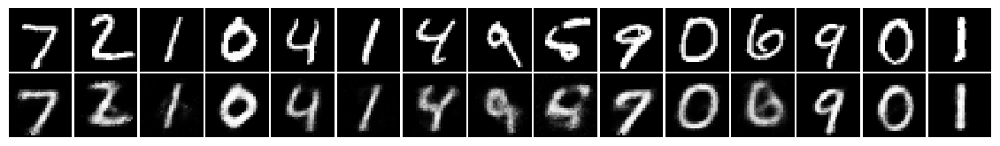

epoch 3 | iter 1220 | loss 23.05184 | KL loss 3.95030 | recon loss 19.10155 
epoch 3 | iter 1240 | loss 22.83409 | KL loss 3.86842 | recon loss 18.96567 
epoch 3 | iter 1260 | loss 23.08254 | KL loss 3.90311 | recon loss 19.17942 
epoch 3 | iter 1280 | loss 22.88586 | KL loss 3.94855 | recon loss 18.93731 
epoch 3 | iter 1300 | loss 22.72404 | KL loss 3.95793 | recon loss 18.76611 


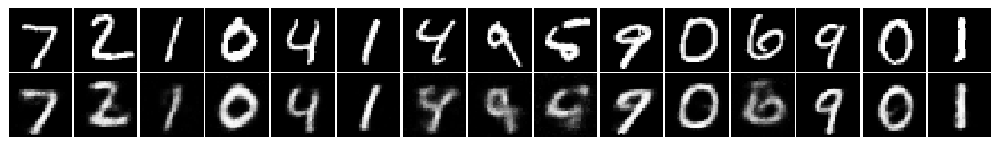

epoch 3 | iter 1320 | loss 22.70004 | KL loss 3.90609 | recon loss 18.79395 
epoch 3 | iter 1340 | loss 22.56351 | KL loss 3.98544 | recon loss 18.57807 
epoch 3 | iter 1360 | loss 22.45419 | KL loss 3.93303 | recon loss 18.52117 
epoch 3 | iter 1380 | loss 22.54301 | KL loss 3.95565 | recon loss 18.58736 
epoch 3 | iter 1400 | loss 22.59699 | KL loss 3.94715 | recon loss 18.64983 


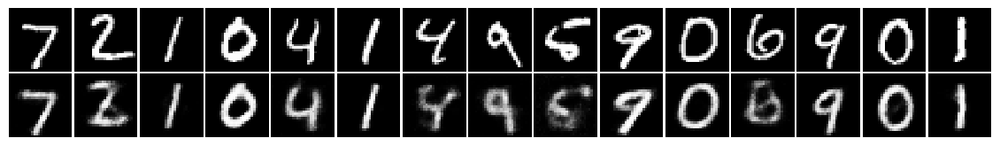

epoch 4 | iter 1420 | loss 22.62966 | KL loss 3.94324 | recon loss 18.68642 
epoch 4 | iter 1440 | loss 22.30533 | KL loss 3.98470 | recon loss 18.32063 
epoch 4 | iter 1460 | loss 22.45651 | KL loss 3.99870 | recon loss 18.45782 
epoch 4 | iter 1480 | loss 22.67493 | KL loss 3.93140 | recon loss 18.74354 
epoch 4 | iter 1500 | loss 22.39478 | KL loss 4.01064 | recon loss 18.38414 


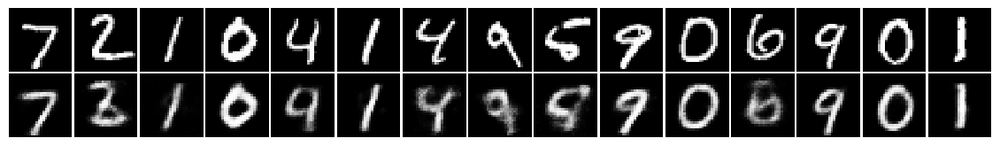

epoch 4 | iter 1520 | loss 22.27336 | KL loss 3.95573 | recon loss 18.31763 
epoch 4 | iter 1540 | loss 22.30146 | KL loss 3.94817 | recon loss 18.35329 
epoch 4 | iter 1560 | loss 22.53079 | KL loss 3.98547 | recon loss 18.54532 
epoch 4 | iter 1580 | loss 22.12620 | KL loss 4.01345 | recon loss 18.11275 
epoch 4 | iter 1600 | loss 22.72444 | KL loss 4.03443 | recon loss 18.69002 


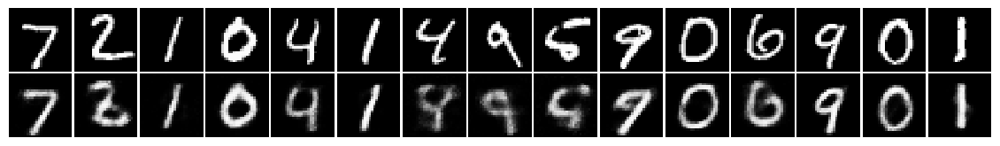

epoch 4 | iter 1620 | loss 22.35760 | KL loss 3.96870 | recon loss 18.38890 
epoch 4 | iter 1640 | loss 22.34170 | KL loss 4.02749 | recon loss 18.31421 
epoch 4 | iter 1660 | loss 22.31464 | KL loss 3.91312 | recon loss 18.40152 
epoch 4 | iter 1680 | loss 22.13050 | KL loss 4.00707 | recon loss 18.12343 
epoch 4 | iter 1700 | loss 22.28825 | KL loss 3.99875 | recon loss 18.28950 


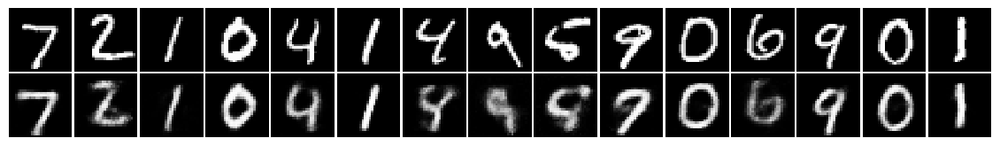

epoch 4 | iter 1720 | loss 21.91072 | KL loss 3.94452 | recon loss 17.96620 
epoch 4 | iter 1740 | loss 22.07475 | KL loss 4.05329 | recon loss 18.02146 
epoch 4 | iter 1760 | loss 22.36471 | KL loss 4.01062 | recon loss 18.35410 
epoch 4 | iter 1780 | loss 22.25533 | KL loss 4.00195 | recon loss 18.25338 
epoch 4 | iter 1800 | loss 22.33571 | KL loss 4.02471 | recon loss 18.31100 


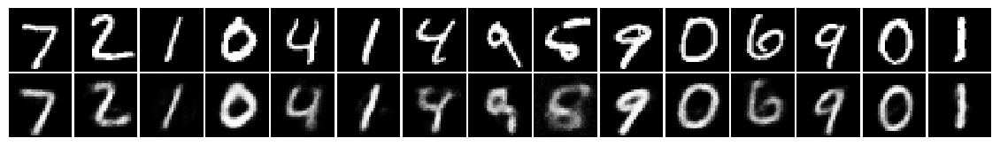

epoch 4 | iter 1820 | loss 22.34435 | KL loss 4.02845 | recon loss 18.31590 
epoch 4 | iter 1840 | loss 21.96626 | KL loss 3.99601 | recon loss 17.97025 
epoch 4 | iter 1860 | loss 22.09987 | KL loss 3.99813 | recon loss 18.10174 
epoch 5 | iter 1880 | loss 22.23417 | KL loss 4.01198 | recon loss 18.22218 
epoch 5 | iter 1900 | loss 22.16732 | KL loss 4.07564 | recon loss 18.09167 


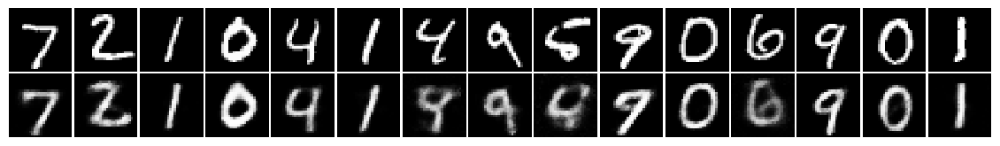

epoch 5 | iter 1920 | loss 21.94547 | KL loss 4.04615 | recon loss 17.89932 
epoch 5 | iter 1940 | loss 21.92606 | KL loss 4.02140 | recon loss 17.90466 
epoch 5 | iter 1960 | loss 21.96290 | KL loss 4.03534 | recon loss 17.92756 
epoch 5 | iter 1980 | loss 22.02835 | KL loss 4.07291 | recon loss 17.95545 
epoch 5 | iter 2000 | loss 21.69691 | KL loss 4.03305 | recon loss 17.66386 


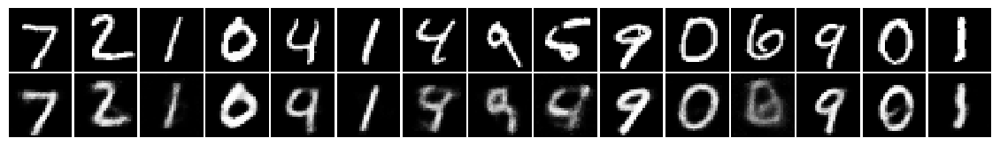

epoch 5 | iter 2020 | loss 21.94600 | KL loss 4.05967 | recon loss 17.88633 
epoch 5 | iter 2040 | loss 21.98459 | KL loss 4.06245 | recon loss 17.92214 
epoch 5 | iter 2060 | loss 21.71890 | KL loss 4.10316 | recon loss 17.61574 
epoch 5 | iter 2080 | loss 22.07650 | KL loss 4.11399 | recon loss 17.96250 
epoch 5 | iter 2100 | loss 22.22736 | KL loss 4.05466 | recon loss 18.17270 


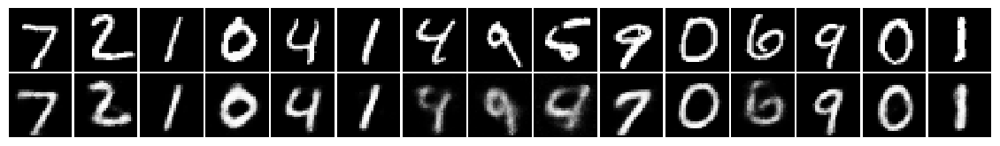

epoch 5 | iter 2120 | loss 21.66113 | KL loss 4.06113 | recon loss 17.60000 
epoch 5 | iter 2140 | loss 21.55757 | KL loss 4.02673 | recon loss 17.53085 
epoch 5 | iter 2160 | loss 21.75151 | KL loss 4.10559 | recon loss 17.64591 
epoch 5 | iter 2180 | loss 21.74544 | KL loss 4.03039 | recon loss 17.71504 
epoch 5 | iter 2200 | loss 21.71521 | KL loss 4.09050 | recon loss 17.62471 


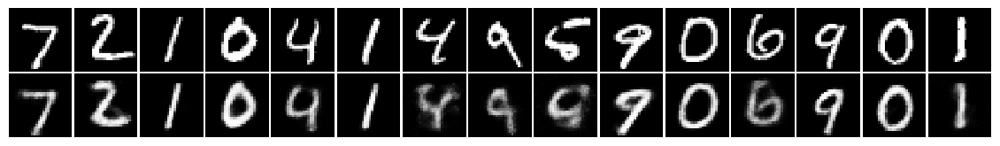

epoch 5 | iter 2220 | loss 21.73913 | KL loss 4.07871 | recon loss 17.66042 
epoch 5 | iter 2240 | loss 21.64637 | KL loss 4.08236 | recon loss 17.56401 
epoch 5 | iter 2260 | loss 21.77574 | KL loss 4.05555 | recon loss 17.72019 
epoch 5 | iter 2280 | loss 21.72110 | KL loss 4.05631 | recon loss 17.66479 
epoch 5 | iter 2300 | loss 21.31502 | KL loss 4.09391 | recon loss 17.22111 


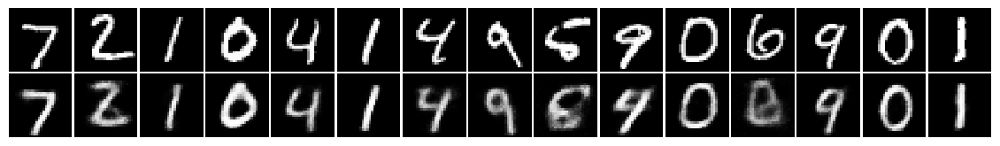

epoch 5 | iter 2320 | loss 21.81426 | KL loss 4.09224 | recon loss 17.72202 
epoch 5 | iter 2340 | loss 21.63307 | KL loss 4.08447 | recon loss 17.54861 
epoch 6 | iter 2360 | loss 21.71833 | KL loss 4.05256 | recon loss 17.66577 
epoch 6 | iter 2380 | loss 21.62028 | KL loss 4.15333 | recon loss 17.46695 
epoch 6 | iter 2400 | loss 21.32436 | KL loss 4.10915 | recon loss 17.21521 


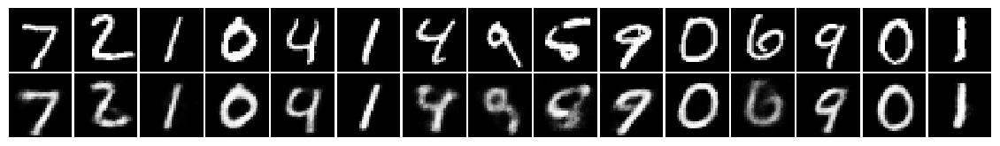

epoch 6 | iter 2420 | loss 21.54916 | KL loss 4.08520 | recon loss 17.46396 
epoch 6 | iter 2440 | loss 21.50696 | KL loss 4.09096 | recon loss 17.41601 
epoch 6 | iter 2460 | loss 21.63114 | KL loss 4.14355 | recon loss 17.48759 
epoch 6 | iter 2480 | loss 21.38267 | KL loss 4.09063 | recon loss 17.29203 
epoch 6 | iter 2500 | loss 21.66817 | KL loss 4.03757 | recon loss 17.63060 


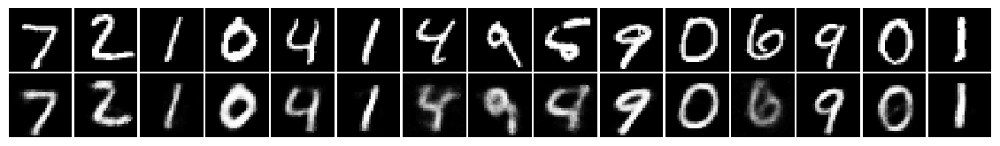

epoch 6 | iter 2520 | loss 21.32989 | KL loss 4.12404 | recon loss 17.20585 
epoch 6 | iter 2540 | loss 21.47519 | KL loss 4.12627 | recon loss 17.34892 
epoch 6 | iter 2560 | loss 21.39988 | KL loss 4.08917 | recon loss 17.31072 
epoch 6 | iter 2580 | loss 21.54554 | KL loss 4.15706 | recon loss 17.38848 
epoch 6 | iter 2600 | loss 21.52254 | KL loss 4.12729 | recon loss 17.39525 


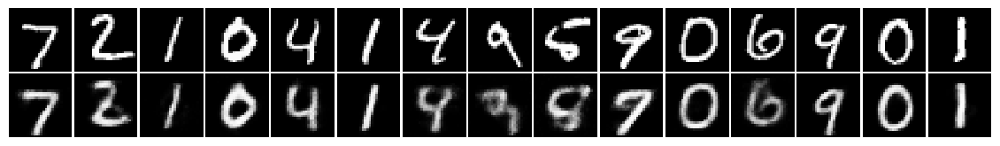

epoch 6 | iter 2620 | loss 21.37902 | KL loss 4.09765 | recon loss 17.28138 
epoch 6 | iter 2640 | loss 21.32160 | KL loss 4.17523 | recon loss 17.14637 
epoch 6 | iter 2660 | loss 21.51183 | KL loss 4.10285 | recon loss 17.40898 
epoch 6 | iter 2680 | loss 21.35541 | KL loss 4.16830 | recon loss 17.18711 
epoch 6 | iter 2700 | loss 21.25666 | KL loss 4.10512 | recon loss 17.15154 


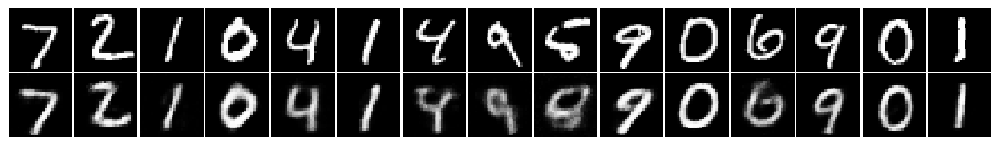

epoch 6 | iter 2720 | loss 21.10420 | KL loss 4.13343 | recon loss 16.97077 
epoch 6 | iter 2740 | loss 21.35384 | KL loss 4.16259 | recon loss 17.19125 
epoch 6 | iter 2760 | loss 21.44711 | KL loss 4.08349 | recon loss 17.36363 
epoch 6 | iter 2780 | loss 21.30931 | KL loss 4.16270 | recon loss 17.14661 
epoch 6 | iter 2800 | loss 21.19807 | KL loss 4.14512 | recon loss 17.05294 


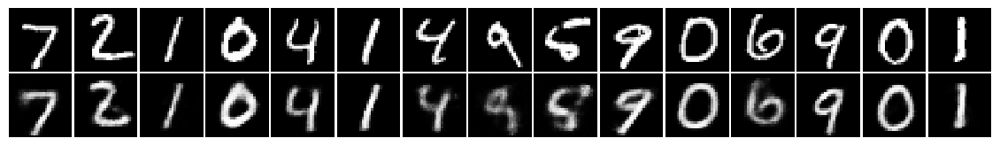

epoch 7 | iter 2820 | loss 20.90664 | KL loss 4.10111 | recon loss 16.80553 
epoch 7 | iter 2840 | loss 21.40640 | KL loss 4.19881 | recon loss 17.20759 
epoch 7 | iter 2860 | loss 21.27410 | KL loss 4.20655 | recon loss 17.06755 
epoch 7 | iter 2880 | loss 21.11656 | KL loss 4.15913 | recon loss 16.95742 
epoch 7 | iter 2900 | loss 21.16998 | KL loss 4.17789 | recon loss 16.99209 


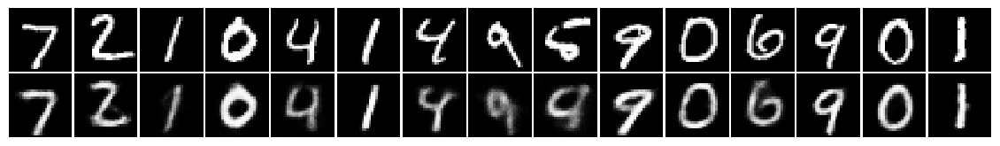

epoch 7 | iter 2920 | loss 21.18853 | KL loss 4.14708 | recon loss 17.04146 
epoch 7 | iter 2940 | loss 21.00887 | KL loss 4.11166 | recon loss 16.89721 
epoch 7 | iter 2960 | loss 21.08784 | KL loss 4.13197 | recon loss 16.95587 
epoch 7 | iter 2980 | loss 21.19488 | KL loss 4.14251 | recon loss 17.05237 
epoch 7 | iter 3000 | loss 20.78003 | KL loss 4.15535 | recon loss 16.62468 


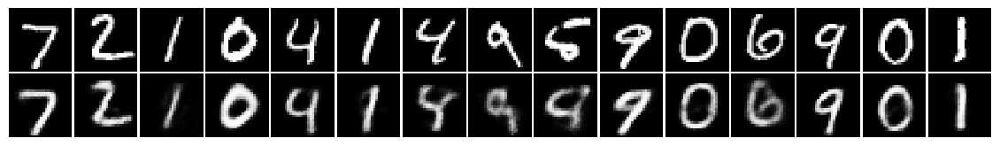

epoch 7 | iter 3020 | loss 20.69839 | KL loss 4.11832 | recon loss 16.58007 
epoch 7 | iter 3040 | loss 21.15407 | KL loss 4.11333 | recon loss 17.04075 
epoch 7 | iter 3060 | loss 21.32852 | KL loss 4.23025 | recon loss 17.09827 
epoch 7 | iter 3080 | loss 21.16665 | KL loss 4.19294 | recon loss 16.97371 
epoch 7 | iter 3100 | loss 21.25489 | KL loss 4.20895 | recon loss 17.04594 


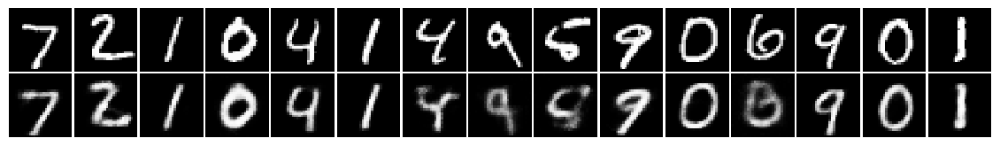

epoch 7 | iter 3120 | loss 21.26067 | KL loss 4.18909 | recon loss 17.07158 
epoch 7 | iter 3140 | loss 20.91783 | KL loss 4.13439 | recon loss 16.78344 
epoch 7 | iter 3160 | loss 21.00041 | KL loss 4.12702 | recon loss 16.87339 
epoch 7 | iter 3180 | loss 20.92738 | KL loss 4.20059 | recon loss 16.72679 
epoch 7 | iter 3200 | loss 21.29466 | KL loss 4.19452 | recon loss 17.10014 


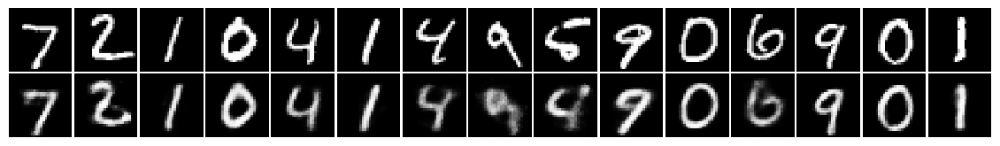

epoch 7 | iter 3220 | loss 20.97113 | KL loss 4.22927 | recon loss 16.74185 
epoch 7 | iter 3240 | loss 20.99614 | KL loss 4.25028 | recon loss 16.74586 
epoch 7 | iter 3260 | loss 20.91480 | KL loss 4.30084 | recon loss 16.61396 
epoch 7 | iter 3280 | loss 21.12788 | KL loss 4.15156 | recon loss 16.97632 
epoch 8 | iter 3300 | loss 20.68877 | KL loss 4.12454 | recon loss 16.56423 


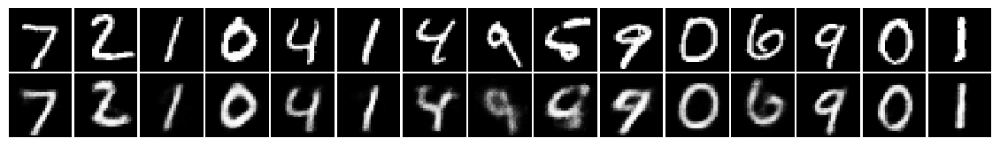

epoch 8 | iter 3320 | loss 20.82671 | KL loss 4.19572 | recon loss 16.63099 
epoch 8 | iter 3340 | loss 20.93490 | KL loss 4.25951 | recon loss 16.67539 
epoch 8 | iter 3360 | loss 20.91028 | KL loss 4.20654 | recon loss 16.70375 
epoch 8 | iter 3380 | loss 20.47443 | KL loss 4.16527 | recon loss 16.30916 
epoch 8 | iter 3400 | loss 21.03218 | KL loss 4.27891 | recon loss 16.75327 


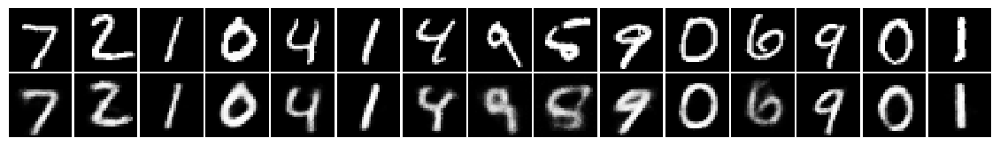

epoch 8 | iter 3420 | loss 20.99577 | KL loss 4.18716 | recon loss 16.80861 
epoch 8 | iter 3440 | loss 20.70470 | KL loss 4.25419 | recon loss 16.45051 
epoch 8 | iter 3460 | loss 20.86889 | KL loss 4.25800 | recon loss 16.61089 
epoch 8 | iter 3480 | loss 20.60992 | KL loss 4.17311 | recon loss 16.43681 
epoch 8 | iter 3500 | loss 21.15752 | KL loss 4.27180 | recon loss 16.88573 


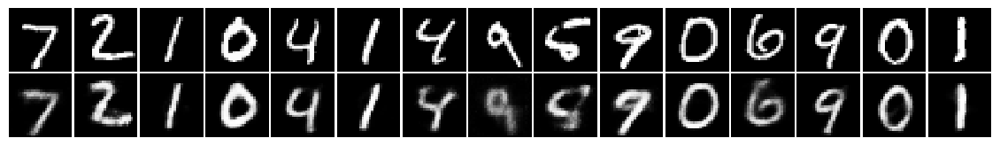

epoch 8 | iter 3520 | loss 20.79402 | KL loss 4.20935 | recon loss 16.58467 
epoch 8 | iter 3540 | loss 20.82200 | KL loss 4.20788 | recon loss 16.61412 
epoch 8 | iter 3560 | loss 20.80937 | KL loss 4.23559 | recon loss 16.57378 
epoch 8 | iter 3580 | loss 20.77076 | KL loss 4.13579 | recon loss 16.63496 
epoch 8 | iter 3600 | loss 21.00704 | KL loss 4.22327 | recon loss 16.78377 


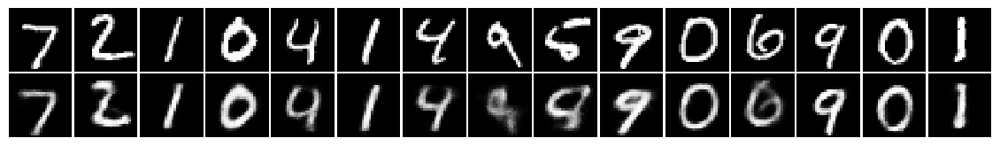

epoch 8 | iter 3620 | loss 20.88661 | KL loss 4.22550 | recon loss 16.66111 
epoch 8 | iter 3640 | loss 20.77241 | KL loss 4.24727 | recon loss 16.52514 
epoch 8 | iter 3660 | loss 21.00733 | KL loss 4.27041 | recon loss 16.73692 
epoch 8 | iter 3680 | loss 20.59947 | KL loss 4.23583 | recon loss 16.36364 
epoch 8 | iter 3700 | loss 20.64841 | KL loss 4.23294 | recon loss 16.41547 


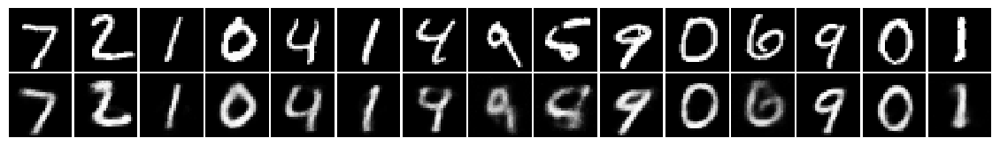

epoch 8 | iter 3720 | loss 20.51982 | KL loss 4.20964 | recon loss 16.31018 
epoch 8 | iter 3740 | loss 20.75659 | KL loss 4.29209 | recon loss 16.46450 
epoch 9 | iter 3760 | loss 20.68339 | KL loss 4.24680 | recon loss 16.43659 
epoch 9 | iter 3780 | loss 20.71898 | KL loss 4.29857 | recon loss 16.42041 
epoch 9 | iter 3800 | loss 20.60183 | KL loss 4.27483 | recon loss 16.32700 


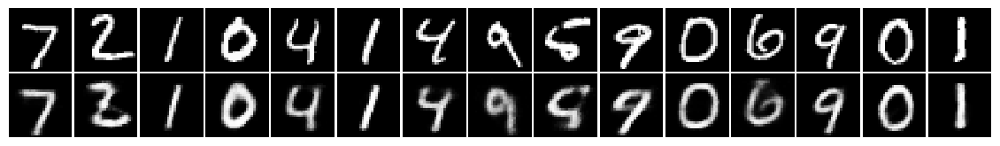

epoch 9 | iter 3820 | loss 20.63545 | KL loss 4.19304 | recon loss 16.44240 
epoch 9 | iter 3840 | loss 20.58522 | KL loss 4.23427 | recon loss 16.35095 
epoch 9 | iter 3860 | loss 20.74831 | KL loss 4.22920 | recon loss 16.51911 
epoch 9 | iter 3880 | loss 20.36729 | KL loss 4.25589 | recon loss 16.11140 
epoch 9 | iter 3900 | loss 20.67269 | KL loss 4.28675 | recon loss 16.38594 


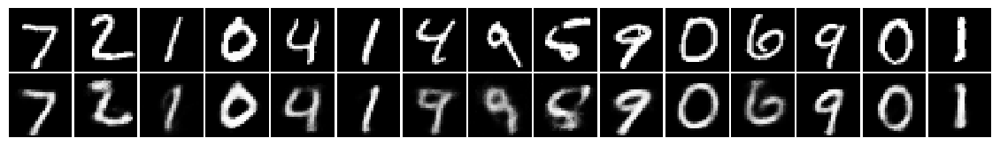

epoch 9 | iter 3920 | loss 20.68436 | KL loss 4.29656 | recon loss 16.38781 
epoch 9 | iter 3940 | loss 20.49966 | KL loss 4.23361 | recon loss 16.26605 
epoch 9 | iter 3960 | loss 20.52012 | KL loss 4.23332 | recon loss 16.28680 
epoch 9 | iter 3980 | loss 20.55581 | KL loss 4.28771 | recon loss 16.26810 
epoch 9 | iter 4000 | loss 20.40687 | KL loss 4.25590 | recon loss 16.15097 


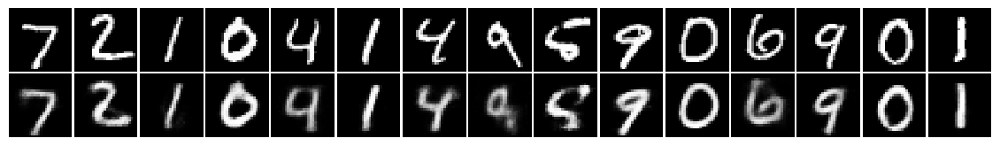

epoch 9 | iter 4020 | loss 20.62369 | KL loss 4.26882 | recon loss 16.35487 
epoch 9 | iter 4040 | loss 20.48356 | KL loss 4.25904 | recon loss 16.22453 
epoch 9 | iter 4060 | loss 20.67200 | KL loss 4.30188 | recon loss 16.37012 
epoch 9 | iter 4080 | loss 20.38502 | KL loss 4.28397 | recon loss 16.10106 
epoch 9 | iter 4100 | loss 20.71346 | KL loss 4.24226 | recon loss 16.47120 


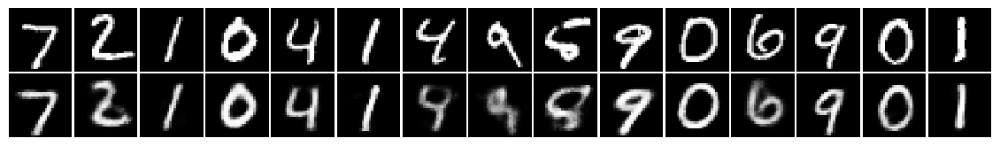

epoch 9 | iter 4120 | loss 20.52552 | KL loss 4.29317 | recon loss 16.23234 
epoch 9 | iter 4140 | loss 20.69152 | KL loss 4.24317 | recon loss 16.44835 
epoch 9 | iter 4160 | loss 20.59147 | KL loss 4.29220 | recon loss 16.29927 
epoch 9 | iter 4180 | loss 20.61695 | KL loss 4.30041 | recon loss 16.31654 
epoch 9 | iter 4200 | loss 20.19870 | KL loss 4.26537 | recon loss 15.93333 


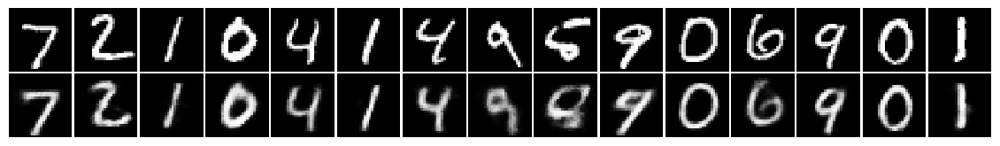

epoch 9 | iter 4220 | loss 20.67667 | KL loss 4.30443 | recon loss 16.37224 
epoch 10 | iter 4240 | loss 20.41238 | KL loss 4.31902 | recon loss 16.09335 
epoch 10 | iter 4260 | loss 20.67163 | KL loss 4.27584 | recon loss 16.39579 
epoch 10 | iter 4280 | loss 20.40353 | KL loss 4.33375 | recon loss 16.06978 
epoch 10 | iter 4300 | loss 20.31570 | KL loss 4.25646 | recon loss 16.05924 


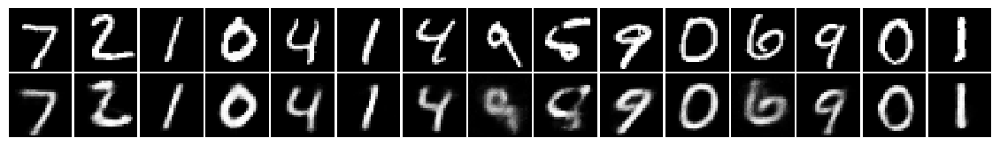

epoch 10 | iter 4320 | loss 20.43877 | KL loss 4.29063 | recon loss 16.14813 
epoch 10 | iter 4340 | loss 20.53666 | KL loss 4.25239 | recon loss 16.28427 
epoch 10 | iter 4360 | loss 20.47004 | KL loss 4.24119 | recon loss 16.22885 
epoch 10 | iter 4380 | loss 20.26052 | KL loss 4.27685 | recon loss 15.98367 
epoch 10 | iter 4400 | loss 20.39713 | KL loss 4.31318 | recon loss 16.08395 


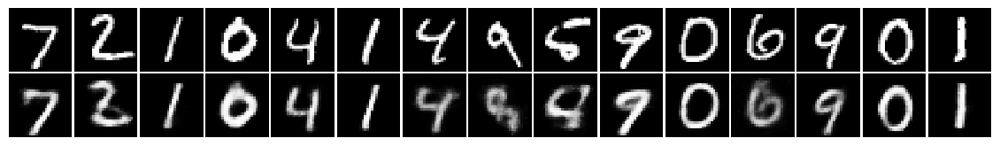

epoch 10 | iter 4420 | loss 20.38905 | KL loss 4.27770 | recon loss 16.11135 
epoch 10 | iter 4440 | loss 20.22451 | KL loss 4.29352 | recon loss 15.93099 
epoch 10 | iter 4460 | loss 20.35993 | KL loss 4.24561 | recon loss 16.11432 
epoch 10 | iter 4480 | loss 19.92880 | KL loss 4.29330 | recon loss 15.63550 
epoch 10 | iter 4500 | loss 20.15057 | KL loss 4.26093 | recon loss 15.88964 


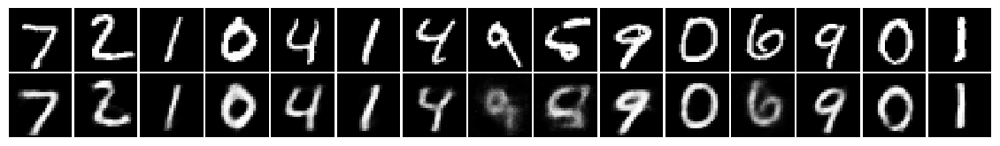

epoch 10 | iter 4520 | loss 20.61153 | KL loss 4.31463 | recon loss 16.29690 
epoch 10 | iter 4540 | loss 20.39611 | KL loss 4.36150 | recon loss 16.03461 
epoch 10 | iter 4560 | loss 20.21795 | KL loss 4.32803 | recon loss 15.88992 
epoch 10 | iter 4580 | loss 20.33113 | KL loss 4.31500 | recon loss 16.01614 
epoch 10 | iter 4600 | loss 20.43871 | KL loss 4.35654 | recon loss 16.08218 


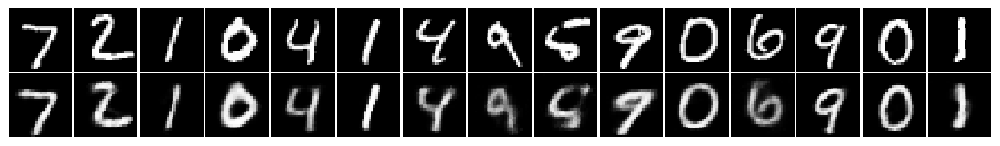

epoch 10 | iter 4620 | loss 20.45677 | KL loss 4.26911 | recon loss 16.18766 
epoch 10 | iter 4640 | loss 20.24160 | KL loss 4.25864 | recon loss 15.98296 
epoch 10 | iter 4660 | loss 20.47182 | KL loss 4.28144 | recon loss 16.19039 
epoch 10 | iter 4680 | loss 20.39695 | KL loss 4.35127 | recon loss 16.04569 
epoch 11 | iter 4700 | loss 20.38553 | KL loss 4.33317 | recon loss 16.05236 


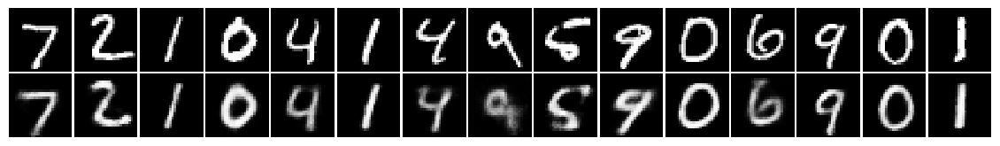

epoch 11 | iter 4720 | loss 19.99411 | KL loss 4.32236 | recon loss 15.67175 
epoch 11 | iter 4740 | loss 20.53693 | KL loss 4.32110 | recon loss 16.21583 
epoch 11 | iter 4760 | loss 20.06263 | KL loss 4.30350 | recon loss 15.75913 
epoch 11 | iter 4780 | loss 20.21978 | KL loss 4.34314 | recon loss 15.87664 
epoch 11 | iter 4800 | loss 20.30861 | KL loss 4.33274 | recon loss 15.97587 


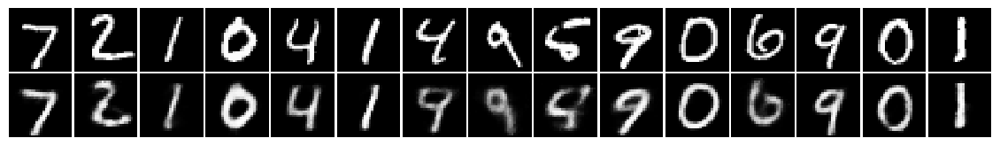

epoch 11 | iter 4820 | loss 20.42187 | KL loss 4.32163 | recon loss 16.10025 
epoch 11 | iter 4840 | loss 20.46366 | KL loss 4.36739 | recon loss 16.09627 
epoch 11 | iter 4860 | loss 20.29250 | KL loss 4.33767 | recon loss 15.95482 
epoch 11 | iter 4880 | loss 20.35416 | KL loss 4.29654 | recon loss 16.05763 
epoch 11 | iter 4900 | loss 20.31956 | KL loss 4.30923 | recon loss 16.01033 


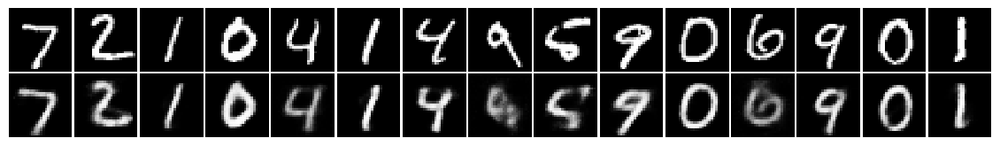

epoch 11 | iter 4920 | loss 20.41450 | KL loss 4.34545 | recon loss 16.06905 
epoch 11 | iter 4940 | loss 20.44975 | KL loss 4.37753 | recon loss 16.07222 
epoch 11 | iter 4960 | loss 20.08788 | KL loss 4.35124 | recon loss 15.73664 
epoch 11 | iter 4980 | loss 19.95856 | KL loss 4.35825 | recon loss 15.60030 
epoch 11 | iter 5000 | loss 20.07324 | KL loss 4.34808 | recon loss 15.72516 


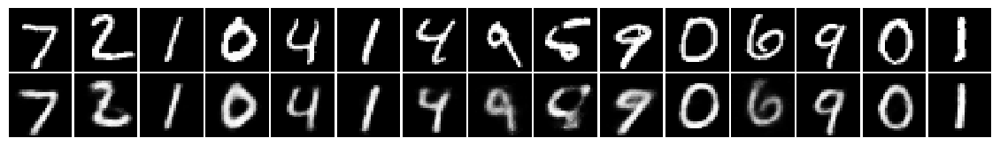

epoch 11 | iter 5020 | loss 20.31942 | KL loss 4.34854 | recon loss 15.97088 
epoch 11 | iter 5040 | loss 20.47366 | KL loss 4.38660 | recon loss 16.08705 
epoch 11 | iter 5060 | loss 20.25517 | KL loss 4.29770 | recon loss 15.95747 
epoch 11 | iter 5080 | loss 20.10163 | KL loss 4.33253 | recon loss 15.76910 
epoch 11 | iter 5100 | loss 20.03467 | KL loss 4.32628 | recon loss 15.70838 


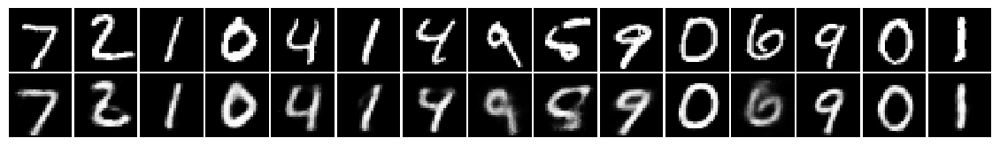

epoch 11 | iter 5120 | loss 20.12653 | KL loss 4.27849 | recon loss 15.84803 
epoch 11 | iter 5140 | loss 20.06400 | KL loss 4.34868 | recon loss 15.71531 
epoch 11 | iter 5160 | loss 19.84779 | KL loss 4.31850 | recon loss 15.52930 
epoch 12 | iter 5180 | loss 19.79294 | KL loss 4.32779 | recon loss 15.46515 
epoch 12 | iter 5200 | loss 19.97698 | KL loss 4.32291 | recon loss 15.65407 


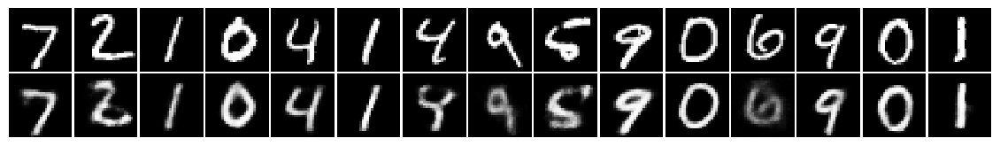

epoch 12 | iter 5220 | loss 19.99081 | KL loss 4.34936 | recon loss 15.64146 
epoch 12 | iter 5240 | loss 20.00675 | KL loss 4.36414 | recon loss 15.64261 
epoch 12 | iter 5260 | loss 20.19231 | KL loss 4.31876 | recon loss 15.87355 
epoch 12 | iter 5280 | loss 20.16317 | KL loss 4.38206 | recon loss 15.78111 
epoch 12 | iter 5300 | loss 19.90603 | KL loss 4.34200 | recon loss 15.56403 


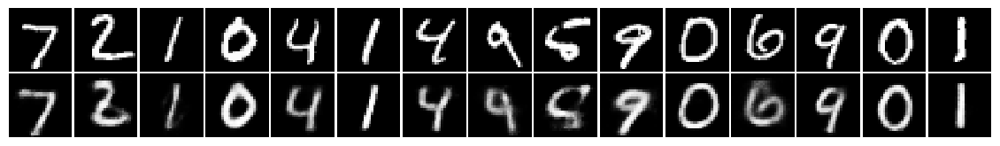

epoch 12 | iter 5320 | loss 19.81916 | KL loss 4.32399 | recon loss 15.49517 
epoch 12 | iter 5340 | loss 20.38465 | KL loss 4.42189 | recon loss 15.96276 
epoch 12 | iter 5360 | loss 20.15817 | KL loss 4.36456 | recon loss 15.79361 
epoch 12 | iter 5380 | loss 20.04666 | KL loss 4.31790 | recon loss 15.72877 
epoch 12 | iter 5400 | loss 20.19922 | KL loss 4.36935 | recon loss 15.82987 


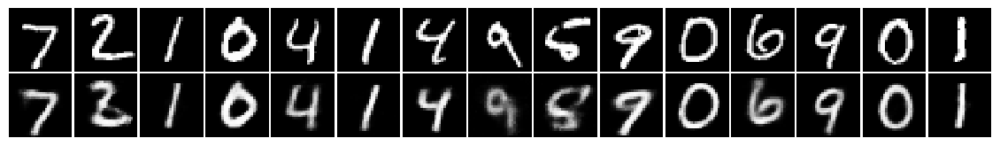

epoch 12 | iter 5420 | loss 20.05779 | KL loss 4.33363 | recon loss 15.72417 
epoch 12 | iter 5440 | loss 19.98017 | KL loss 4.33824 | recon loss 15.64193 
epoch 12 | iter 5460 | loss 19.78519 | KL loss 4.37828 | recon loss 15.40690 
epoch 12 | iter 5480 | loss 20.60519 | KL loss 4.40186 | recon loss 16.20333 
epoch 12 | iter 5500 | loss 19.84303 | KL loss 4.41771 | recon loss 15.42532 


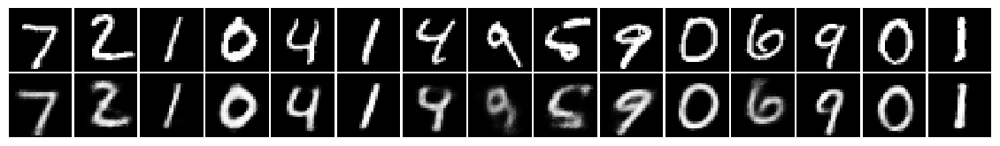

epoch 12 | iter 5520 | loss 20.44049 | KL loss 4.41299 | recon loss 16.02750 
epoch 12 | iter 5540 | loss 20.05454 | KL loss 4.38580 | recon loss 15.66874 
epoch 12 | iter 5560 | loss 19.88955 | KL loss 4.33151 | recon loss 15.55804 
epoch 12 | iter 5580 | loss 19.93194 | KL loss 4.33908 | recon loss 15.59286 
epoch 12 | iter 5600 | loss 20.25143 | KL loss 4.39084 | recon loss 15.86058 


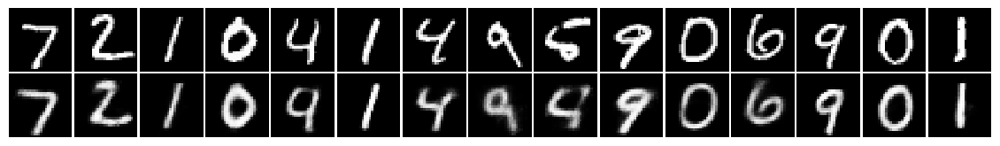

epoch 12 | iter 5620 | loss 20.15185 | KL loss 4.36184 | recon loss 15.79001 
epoch 13 | iter 5640 | loss 19.92510 | KL loss 4.37418 | recon loss 15.55092 
epoch 13 | iter 5660 | loss 20.02442 | KL loss 4.39888 | recon loss 15.62554 
epoch 13 | iter 5680 | loss 19.76742 | KL loss 4.32769 | recon loss 15.43974 
epoch 13 | iter 5700 | loss 20.15664 | KL loss 4.35842 | recon loss 15.79823 


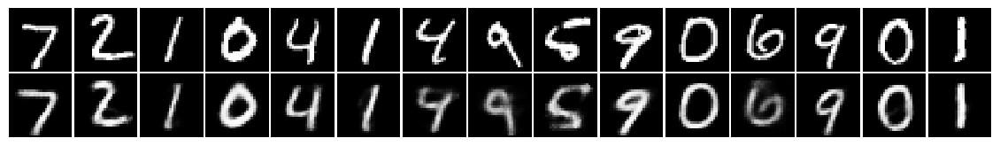

epoch 13 | iter 5720 | loss 19.96851 | KL loss 4.38365 | recon loss 15.58486 
epoch 13 | iter 5740 | loss 20.03401 | KL loss 4.36332 | recon loss 15.67068 
epoch 13 | iter 5760 | loss 19.95332 | KL loss 4.41777 | recon loss 15.53555 
epoch 13 | iter 5780 | loss 20.18759 | KL loss 4.38753 | recon loss 15.80006 
epoch 13 | iter 5800 | loss 19.95535 | KL loss 4.36373 | recon loss 15.59162 


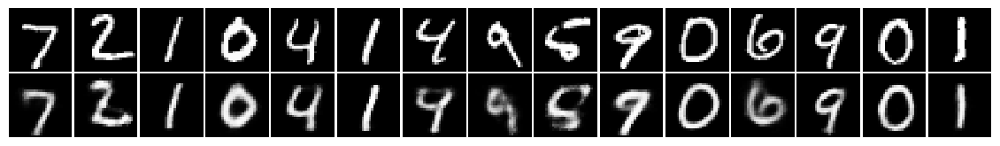

epoch 13 | iter 5820 | loss 19.74818 | KL loss 4.34562 | recon loss 15.40256 
epoch 13 | iter 5840 | loss 19.94183 | KL loss 4.37001 | recon loss 15.57182 
epoch 13 | iter 5860 | loss 19.81664 | KL loss 4.38118 | recon loss 15.43547 
epoch 13 | iter 5880 | loss 19.76289 | KL loss 4.41121 | recon loss 15.35168 
epoch 13 | iter 5900 | loss 20.04740 | KL loss 4.36912 | recon loss 15.67828 


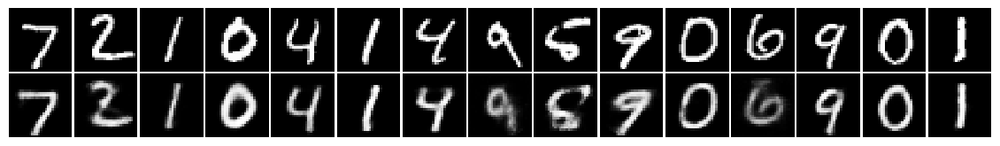

epoch 13 | iter 5920 | loss 19.99232 | KL loss 4.41377 | recon loss 15.57855 
epoch 13 | iter 5940 | loss 19.61479 | KL loss 4.39879 | recon loss 15.21600 
epoch 13 | iter 5960 | loss 19.80304 | KL loss 4.36341 | recon loss 15.43963 
epoch 13 | iter 5980 | loss 19.70273 | KL loss 4.35121 | recon loss 15.35152 
epoch 13 | iter 6000 | loss 19.96718 | KL loss 4.44597 | recon loss 15.52121 


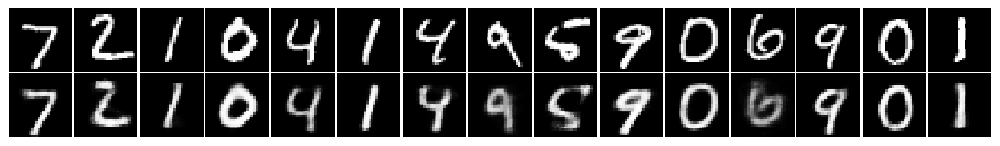

epoch 13 | iter 6020 | loss 20.04366 | KL loss 4.36668 | recon loss 15.67698 
epoch 13 | iter 6040 | loss 20.18180 | KL loss 4.37782 | recon loss 15.80398 
epoch 13 | iter 6060 | loss 20.14637 | KL loss 4.42801 | recon loss 15.71836 
epoch 13 | iter 6080 | loss 19.84038 | KL loss 4.41866 | recon loss 15.42172 
epoch 14 | iter 6100 | loss 19.97968 | KL loss 4.37890 | recon loss 15.60078 


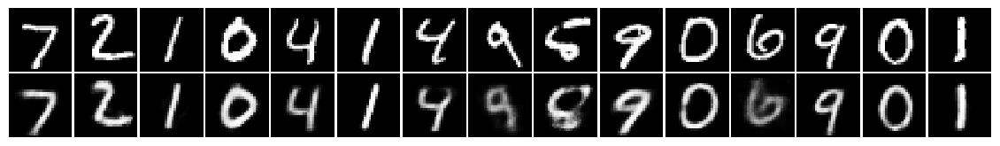

epoch 14 | iter 6120 | loss 19.81747 | KL loss 4.41255 | recon loss 15.40492 
epoch 14 | iter 6140 | loss 19.72265 | KL loss 4.30469 | recon loss 15.41797 
epoch 14 | iter 6160 | loss 19.79624 | KL loss 4.40860 | recon loss 15.38764 
epoch 14 | iter 6180 | loss 19.84522 | KL loss 4.46970 | recon loss 15.37551 
epoch 14 | iter 6200 | loss 19.87138 | KL loss 4.37920 | recon loss 15.49218 


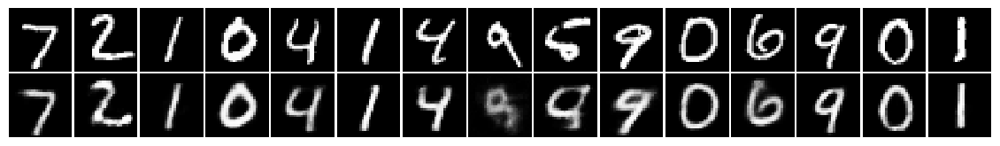

epoch 14 | iter 6220 | loss 19.70895 | KL loss 4.44663 | recon loss 15.26232 
epoch 14 | iter 6240 | loss 20.14971 | KL loss 4.40624 | recon loss 15.74347 
epoch 14 | iter 6260 | loss 19.70506 | KL loss 4.38956 | recon loss 15.31551 
epoch 14 | iter 6280 | loss 19.80392 | KL loss 4.42195 | recon loss 15.38197 
epoch 14 | iter 6300 | loss 19.67280 | KL loss 4.36477 | recon loss 15.30803 


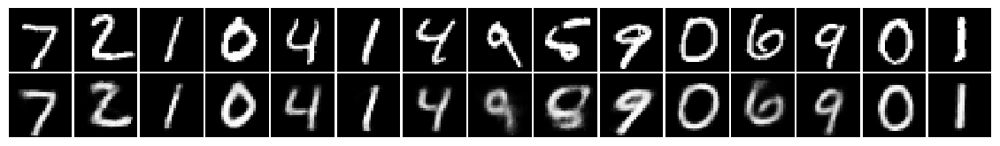

epoch 14 | iter 6320 | loss 19.87043 | KL loss 4.37126 | recon loss 15.49916 
epoch 14 | iter 6340 | loss 19.89503 | KL loss 4.41262 | recon loss 15.48241 
epoch 14 | iter 6360 | loss 19.72614 | KL loss 4.39710 | recon loss 15.32904 
epoch 14 | iter 6380 | loss 19.79419 | KL loss 4.37385 | recon loss 15.42034 
epoch 14 | iter 6400 | loss 19.73376 | KL loss 4.37018 | recon loss 15.36358 


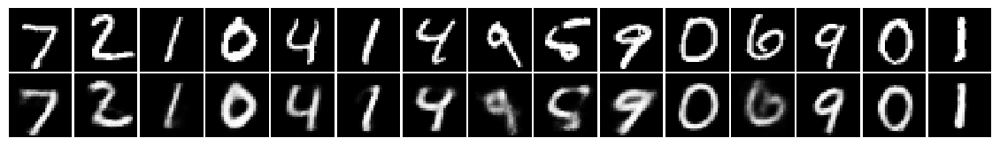

epoch 14 | iter 6420 | loss 19.78613 | KL loss 4.40129 | recon loss 15.38484 
epoch 14 | iter 6440 | loss 19.90118 | KL loss 4.38318 | recon loss 15.51800 
epoch 14 | iter 6460 | loss 20.14658 | KL loss 4.44864 | recon loss 15.69794 
epoch 14 | iter 6480 | loss 19.76013 | KL loss 4.37874 | recon loss 15.38139 
epoch 14 | iter 6500 | loss 20.02417 | KL loss 4.39813 | recon loss 15.62605 


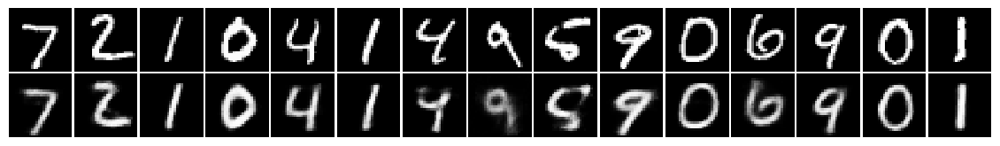

epoch 14 | iter 6520 | loss 19.48213 | KL loss 4.44445 | recon loss 15.03768 
epoch 14 | iter 6540 | loss 19.94689 | KL loss 4.47976 | recon loss 15.46713 
epoch 14 | iter 6560 | loss 19.94233 | KL loss 4.44038 | recon loss 15.50195 
epoch 15 | iter 6580 | loss 19.97255 | KL loss 4.45753 | recon loss 15.51501 
epoch 15 | iter 6600 | loss 19.72981 | KL loss 4.41715 | recon loss 15.31267 


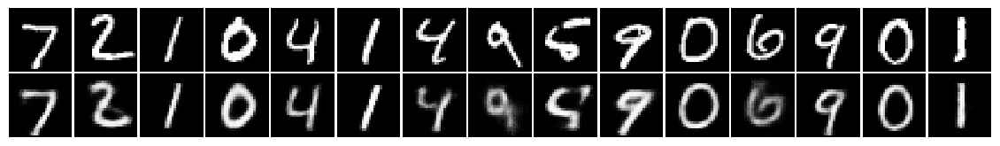

epoch 15 | iter 6620 | loss 19.65757 | KL loss 4.46314 | recon loss 15.19442 
epoch 15 | iter 6640 | loss 19.64524 | KL loss 4.43072 | recon loss 15.21452 
epoch 15 | iter 6660 | loss 19.52043 | KL loss 4.39711 | recon loss 15.12332 
epoch 15 | iter 6680 | loss 19.93054 | KL loss 4.41226 | recon loss 15.51828 
epoch 15 | iter 6700 | loss 19.55164 | KL loss 4.40778 | recon loss 15.14385 


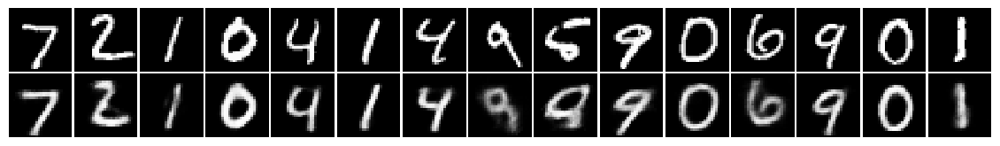

epoch 15 | iter 6720 | loss 19.79560 | KL loss 4.48003 | recon loss 15.31556 
epoch 15 | iter 6740 | loss 19.71764 | KL loss 4.43490 | recon loss 15.28274 
epoch 15 | iter 6760 | loss 19.73397 | KL loss 4.42981 | recon loss 15.30415 
epoch 15 | iter 6780 | loss 19.70433 | KL loss 4.44846 | recon loss 15.25587 
epoch 15 | iter 6800 | loss 19.76995 | KL loss 4.45657 | recon loss 15.31339 


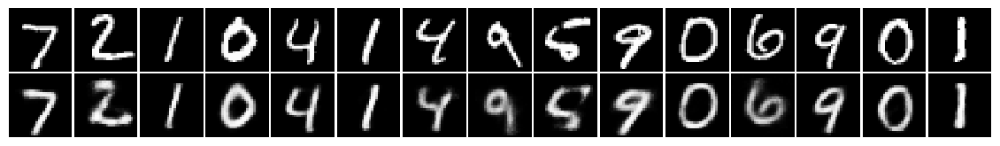

epoch 15 | iter 6820 | loss 19.44999 | KL loss 4.40080 | recon loss 15.04918 
epoch 15 | iter 6840 | loss 19.67265 | KL loss 4.37730 | recon loss 15.29535 
epoch 15 | iter 6860 | loss 20.02394 | KL loss 4.47098 | recon loss 15.55296 
epoch 15 | iter 6880 | loss 19.66614 | KL loss 4.40889 | recon loss 15.25724 
epoch 15 | iter 6900 | loss 19.74738 | KL loss 4.40580 | recon loss 15.34158 


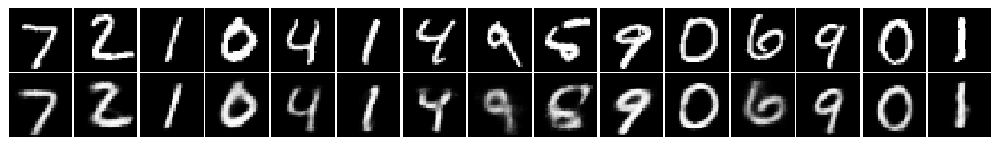

epoch 15 | iter 6920 | loss 19.94749 | KL loss 4.46625 | recon loss 15.48124 
epoch 15 | iter 6940 | loss 19.86576 | KL loss 4.41710 | recon loss 15.44867 
epoch 15 | iter 6960 | loss 19.72549 | KL loss 4.42852 | recon loss 15.29697 
epoch 15 | iter 6980 | loss 19.70262 | KL loss 4.38220 | recon loss 15.32042 
epoch 15 | iter 7000 | loss 19.75160 | KL loss 4.46255 | recon loss 15.28905 


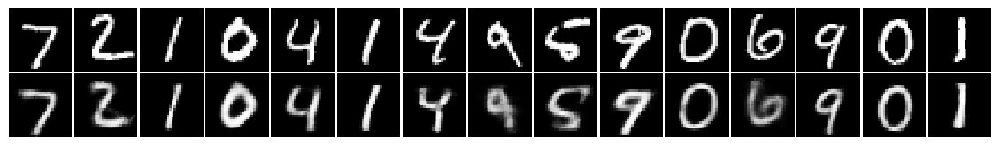

epoch 15 | iter 7020 | loss 19.84356 | KL loss 4.38353 | recon loss 15.46004 
epoch 16 | iter 7040 | loss 19.63458 | KL loss 4.39922 | recon loss 15.23536 
epoch 16 | iter 7060 | loss 19.53773 | KL loss 4.39524 | recon loss 15.14249 
epoch 16 | iter 7080 | loss 19.72798 | KL loss 4.47301 | recon loss 15.25497 
epoch 16 | iter 7100 | loss 19.65529 | KL loss 4.45136 | recon loss 15.20393 


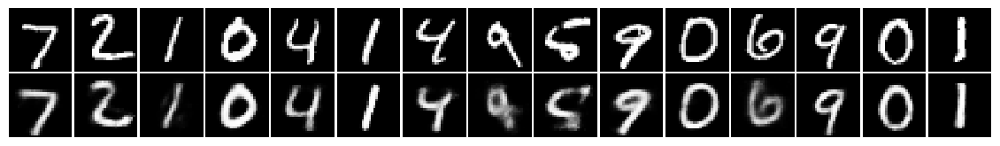

epoch 16 | iter 7120 | loss 19.59658 | KL loss 4.45941 | recon loss 15.13717 
epoch 16 | iter 7140 | loss 19.84825 | KL loss 4.36880 | recon loss 15.47945 
epoch 16 | iter 7160 | loss 19.65047 | KL loss 4.49163 | recon loss 15.15884 
epoch 16 | iter 7180 | loss 19.49125 | KL loss 4.42925 | recon loss 15.06199 
epoch 16 | iter 7200 | loss 19.67761 | KL loss 4.47775 | recon loss 15.19986 


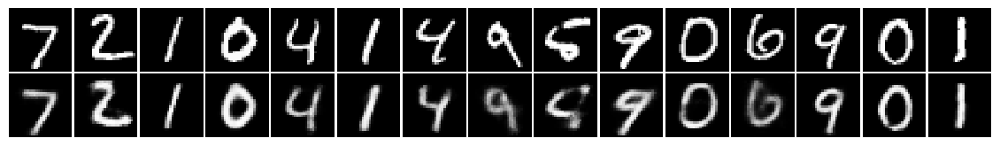

epoch 16 | iter 7220 | loss 19.69982 | KL loss 4.43393 | recon loss 15.26589 
epoch 16 | iter 7240 | loss 19.53821 | KL loss 4.43044 | recon loss 15.10777 
epoch 16 | iter 7260 | loss 19.50955 | KL loss 4.49750 | recon loss 15.01206 
epoch 16 | iter 7280 | loss 19.75519 | KL loss 4.43224 | recon loss 15.32295 
epoch 16 | iter 7300 | loss 19.80201 | KL loss 4.46224 | recon loss 15.33976 


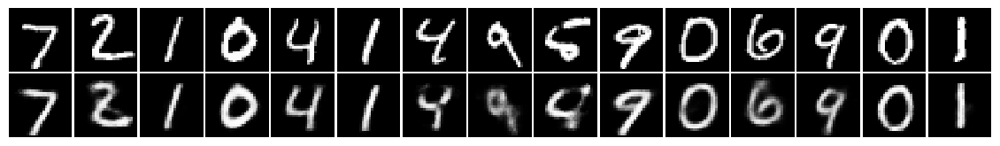

epoch 16 | iter 7320 | loss 19.44895 | KL loss 4.44542 | recon loss 15.00353 
epoch 16 | iter 7340 | loss 19.61598 | KL loss 4.44922 | recon loss 15.16675 
epoch 16 | iter 7360 | loss 19.69289 | KL loss 4.52030 | recon loss 15.17260 
epoch 16 | iter 7380 | loss 19.67687 | KL loss 4.44468 | recon loss 15.23219 
epoch 16 | iter 7400 | loss 19.69591 | KL loss 4.47412 | recon loss 15.22179 


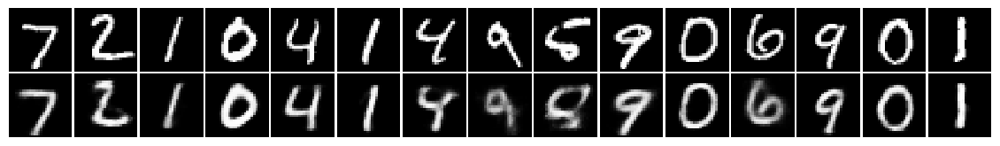

epoch 16 | iter 7420 | loss 19.51273 | KL loss 4.39803 | recon loss 15.11470 
epoch 16 | iter 7440 | loss 19.78412 | KL loss 4.55148 | recon loss 15.23264 
epoch 16 | iter 7460 | loss 19.70865 | KL loss 4.46289 | recon loss 15.24577 
epoch 16 | iter 7480 | loss 19.71958 | KL loss 4.49956 | recon loss 15.22002 
epoch 16 | iter 7500 | loss 19.44779 | KL loss 4.35785 | recon loss 15.08994 


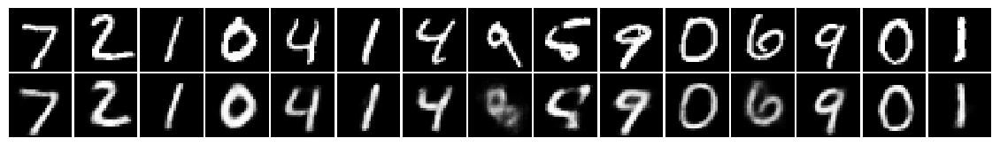

epoch 17 | iter 7520 | loss 19.74813 | KL loss 4.44936 | recon loss 15.29877 
epoch 17 | iter 7540 | loss 19.33637 | KL loss 4.44407 | recon loss 14.89230 
epoch 17 | iter 7560 | loss 19.41281 | KL loss 4.43055 | recon loss 14.98226 
epoch 17 | iter 7580 | loss 19.70023 | KL loss 4.46621 | recon loss 15.23402 
epoch 17 | iter 7600 | loss 19.67016 | KL loss 4.45773 | recon loss 15.21243 


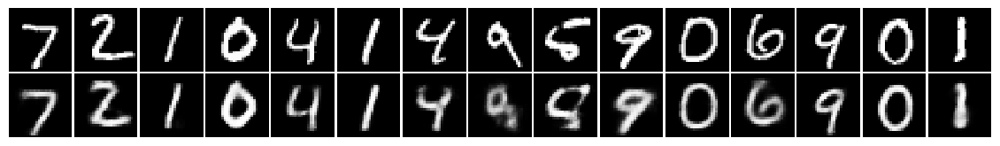

epoch 17 | iter 7620 | loss 19.69959 | KL loss 4.47752 | recon loss 15.22207 
epoch 17 | iter 7640 | loss 19.33635 | KL loss 4.42040 | recon loss 14.91595 
epoch 17 | iter 7660 | loss 19.27618 | KL loss 4.51285 | recon loss 14.76333 
epoch 17 | iter 7680 | loss 19.31106 | KL loss 4.43921 | recon loss 14.87185 
epoch 17 | iter 7700 | loss 19.53584 | KL loss 4.44819 | recon loss 15.08765 


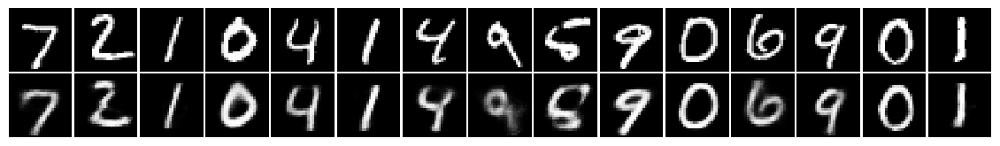

epoch 17 | iter 7720 | loss 19.70941 | KL loss 4.47858 | recon loss 15.23083 
epoch 17 | iter 7740 | loss 19.58235 | KL loss 4.45622 | recon loss 15.12613 
epoch 17 | iter 7760 | loss 19.64500 | KL loss 4.50372 | recon loss 15.14127 
epoch 17 | iter 7780 | loss 19.42905 | KL loss 4.42288 | recon loss 15.00617 
epoch 17 | iter 7800 | loss 19.58185 | KL loss 4.41983 | recon loss 15.16202 


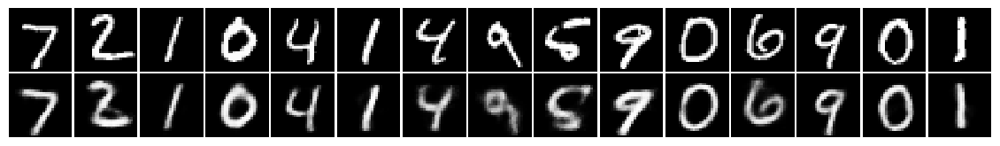

epoch 17 | iter 7820 | loss 19.67215 | KL loss 4.52211 | recon loss 15.15005 
epoch 17 | iter 7840 | loss 19.56697 | KL loss 4.41415 | recon loss 15.15282 
epoch 17 | iter 7860 | loss 19.68921 | KL loss 4.47493 | recon loss 15.21428 
epoch 17 | iter 7880 | loss 19.49692 | KL loss 4.49951 | recon loss 14.99741 
epoch 17 | iter 7900 | loss 19.74582 | KL loss 4.44532 | recon loss 15.30049 


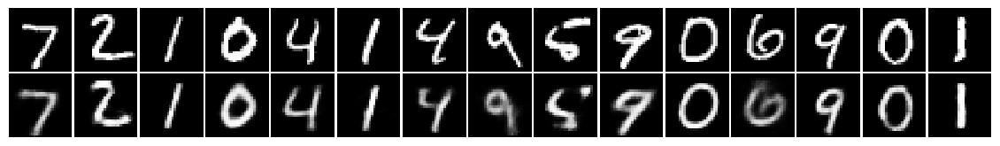

epoch 17 | iter 7920 | loss 19.39170 | KL loss 4.41932 | recon loss 14.97238 
epoch 17 | iter 7940 | loss 19.89523 | KL loss 4.46943 | recon loss 15.42580 
epoch 17 | iter 7960 | loss 19.55817 | KL loss 4.49773 | recon loss 15.06044 
epoch 18 | iter 7980 | loss 19.44351 | KL loss 4.51351 | recon loss 14.92999 
epoch 18 | iter 8000 | loss 19.30589 | KL loss 4.47523 | recon loss 14.83066 


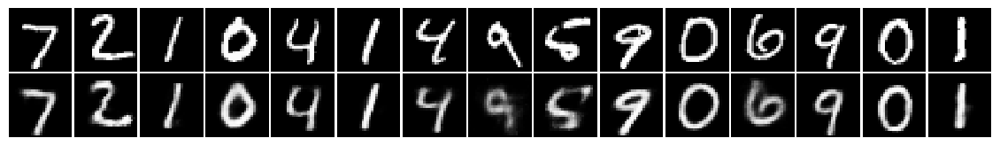

epoch 18 | iter 8020 | loss 19.45866 | KL loss 4.46336 | recon loss 14.99529 
epoch 18 | iter 8040 | loss 19.25563 | KL loss 4.42853 | recon loss 14.82710 
epoch 18 | iter 8060 | loss 19.21903 | KL loss 4.49875 | recon loss 14.72027 
epoch 18 | iter 8080 | loss 19.30255 | KL loss 4.47116 | recon loss 14.83139 
epoch 18 | iter 8100 | loss 19.46967 | KL loss 4.41579 | recon loss 15.05388 


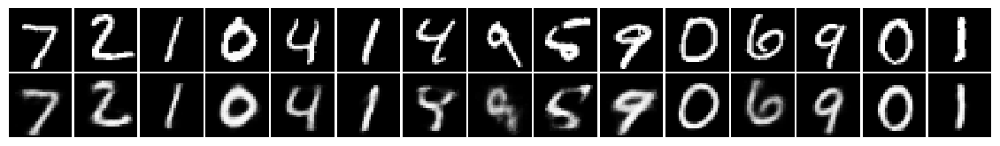

epoch 18 | iter 8120 | loss 19.56633 | KL loss 4.42151 | recon loss 15.14482 
epoch 18 | iter 8140 | loss 19.37226 | KL loss 4.45295 | recon loss 14.91931 
epoch 18 | iter 8160 | loss 19.55643 | KL loss 4.49504 | recon loss 15.06139 
epoch 18 | iter 8180 | loss 19.58132 | KL loss 4.46881 | recon loss 15.11251 
epoch 18 | iter 8200 | loss 19.79548 | KL loss 4.52923 | recon loss 15.26625 


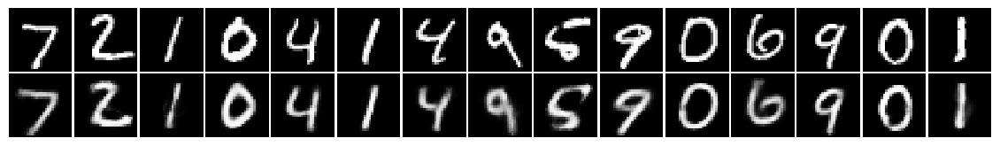

epoch 18 | iter 8220 | loss 19.48491 | KL loss 4.49682 | recon loss 14.98808 
epoch 18 | iter 8240 | loss 19.66828 | KL loss 4.51036 | recon loss 15.15792 
epoch 18 | iter 8260 | loss 19.44118 | KL loss 4.48678 | recon loss 14.95440 
epoch 18 | iter 8280 | loss 19.35418 | KL loss 4.40664 | recon loss 14.94754 
epoch 18 | iter 8300 | loss 19.46876 | KL loss 4.41553 | recon loss 15.05323 


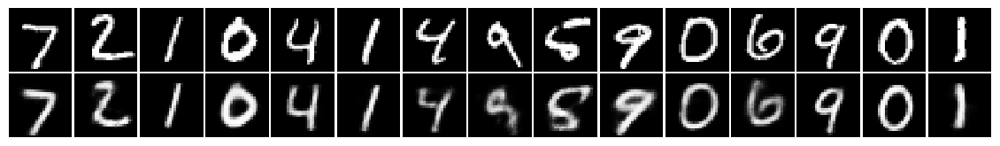

epoch 18 | iter 8320 | loss 19.37530 | KL loss 4.49477 | recon loss 14.88053 
epoch 18 | iter 8340 | loss 19.52491 | KL loss 4.45057 | recon loss 15.07434 
epoch 18 | iter 8360 | loss 19.68964 | KL loss 4.44064 | recon loss 15.24899 
epoch 18 | iter 8380 | loss 19.55426 | KL loss 4.46876 | recon loss 15.08550 
epoch 18 | iter 8400 | loss 19.60739 | KL loss 4.47577 | recon loss 15.13161 


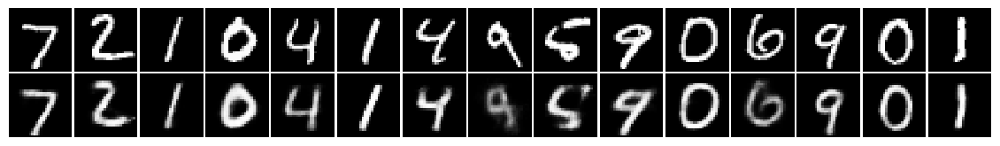

epoch 18 | iter 8420 | loss 19.52942 | KL loss 4.44774 | recon loss 15.08168 
epoch 18 | iter 8440 | loss 19.66952 | KL loss 4.49041 | recon loss 15.17911 
epoch 19 | iter 8460 | loss 19.42560 | KL loss 4.51382 | recon loss 14.91178 
epoch 19 | iter 8480 | loss 19.55803 | KL loss 4.51410 | recon loss 15.04393 
epoch 19 | iter 8500 | loss 19.47602 | KL loss 4.52813 | recon loss 14.94789 


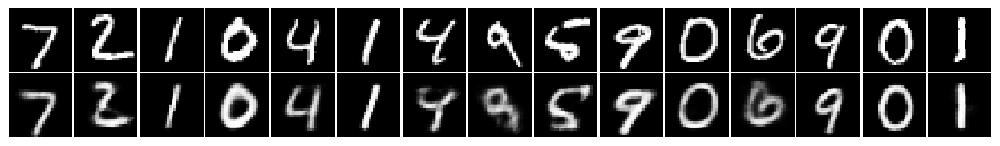

epoch 19 | iter 8520 | loss 19.25482 | KL loss 4.52602 | recon loss 14.72880 
epoch 19 | iter 8540 | loss 19.43805 | KL loss 4.54534 | recon loss 14.89271 
epoch 19 | iter 8560 | loss 19.53264 | KL loss 4.48960 | recon loss 15.04304 
epoch 19 | iter 8580 | loss 19.40754 | KL loss 4.44041 | recon loss 14.96713 
epoch 19 | iter 8600 | loss 19.41297 | KL loss 4.49713 | recon loss 14.91584 


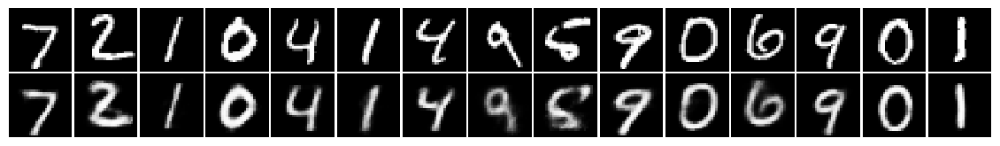

epoch 19 | iter 8620 | loss 19.52215 | KL loss 4.46287 | recon loss 15.05928 
epoch 19 | iter 8640 | loss 19.65634 | KL loss 4.48573 | recon loss 15.17061 
epoch 19 | iter 8660 | loss 19.69984 | KL loss 4.51791 | recon loss 15.18193 
epoch 19 | iter 8680 | loss 19.46353 | KL loss 4.46549 | recon loss 14.99804 
epoch 19 | iter 8700 | loss 19.15049 | KL loss 4.38813 | recon loss 14.76236 


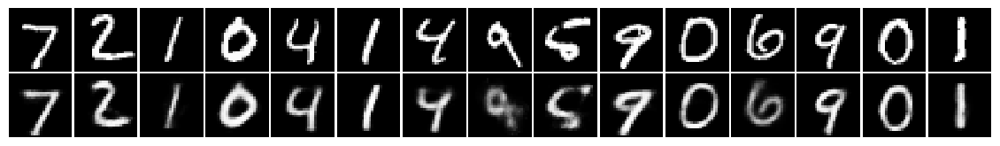

epoch 19 | iter 8720 | loss 19.34391 | KL loss 4.49741 | recon loss 14.84650 
epoch 19 | iter 8740 | loss 19.64032 | KL loss 4.48187 | recon loss 15.15845 
epoch 19 | iter 8760 | loss 19.24199 | KL loss 4.45823 | recon loss 14.78376 
epoch 19 | iter 8780 | loss 19.35476 | KL loss 4.48515 | recon loss 14.86962 
epoch 19 | iter 8800 | loss 19.55073 | KL loss 4.48875 | recon loss 15.06198 


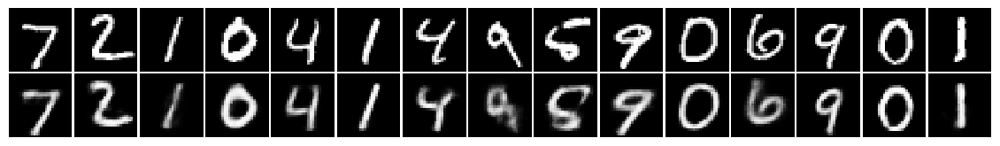

epoch 19 | iter 8820 | loss 19.31644 | KL loss 4.51617 | recon loss 14.80026 
epoch 19 | iter 8840 | loss 19.02755 | KL loss 4.49176 | recon loss 14.53579 
epoch 19 | iter 8860 | loss 19.51654 | KL loss 4.52327 | recon loss 14.99326 
epoch 19 | iter 8880 | loss 19.20466 | KL loss 4.47731 | recon loss 14.72735 
epoch 19 | iter 8900 | loss 19.61633 | KL loss 4.49137 | recon loss 15.12496 


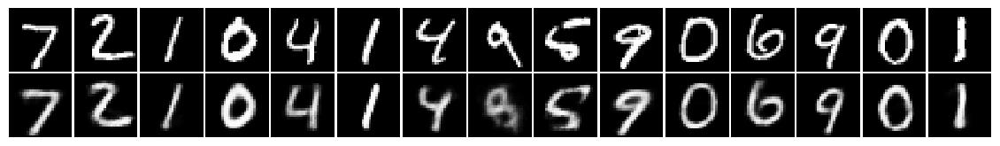

epoch 20 | iter 8920 | loss 19.28070 | KL loss 4.47155 | recon loss 14.80915 
epoch 20 | iter 8940 | loss 19.38041 | KL loss 4.53111 | recon loss 14.84929 
epoch 20 | iter 8960 | loss 19.13973 | KL loss 4.44507 | recon loss 14.69467 
epoch 20 | iter 8980 | loss 19.28212 | KL loss 4.49727 | recon loss 14.78485 
epoch 20 | iter 9000 | loss 19.21850 | KL loss 4.44522 | recon loss 14.77327 


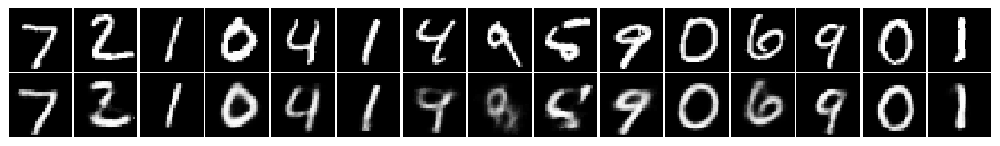

epoch 20 | iter 9020 | loss 19.50543 | KL loss 4.49578 | recon loss 15.00965 
epoch 20 | iter 9040 | loss 19.48620 | KL loss 4.48987 | recon loss 14.99634 
epoch 20 | iter 9060 | loss 19.38897 | KL loss 4.50505 | recon loss 14.88392 
epoch 20 | iter 9080 | loss 19.56650 | KL loss 4.52239 | recon loss 15.04411 
epoch 20 | iter 9100 | loss 19.37936 | KL loss 4.50038 | recon loss 14.87898 


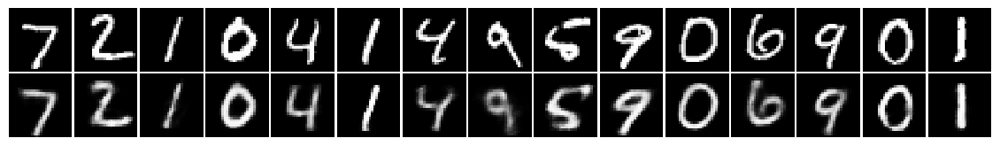

epoch 20 | iter 9120 | loss 19.13228 | KL loss 4.47447 | recon loss 14.65781 
epoch 20 | iter 9140 | loss 19.36443 | KL loss 4.50551 | recon loss 14.85892 
epoch 20 | iter 9160 | loss 19.45777 | KL loss 4.50702 | recon loss 14.95075 
epoch 20 | iter 9180 | loss 19.19270 | KL loss 4.48086 | recon loss 14.71184 
epoch 20 | iter 9200 | loss 19.05897 | KL loss 4.51713 | recon loss 14.54183 


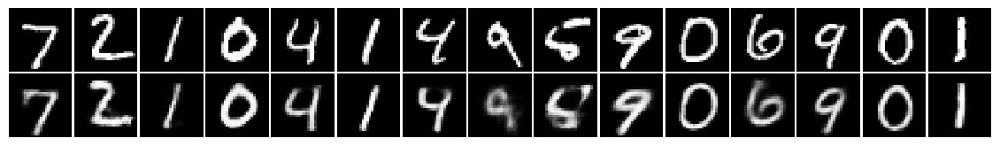

epoch 20 | iter 9220 | loss 19.04647 | KL loss 4.43618 | recon loss 14.61029 
epoch 20 | iter 9240 | loss 19.30169 | KL loss 4.47689 | recon loss 14.82480 
epoch 20 | iter 9260 | loss 19.25784 | KL loss 4.49371 | recon loss 14.76413 
epoch 20 | iter 9280 | loss 19.53126 | KL loss 4.52817 | recon loss 15.00309 
epoch 20 | iter 9300 | loss 19.16736 | KL loss 4.48617 | recon loss 14.68119 


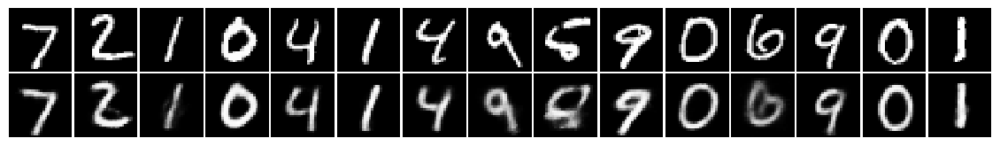

epoch 20 | iter 9320 | loss 19.44515 | KL loss 4.50866 | recon loss 14.93648 
epoch 20 | iter 9340 | loss 19.61574 | KL loss 4.52671 | recon loss 15.08903 
epoch 20 | iter 9360 | loss 19.52605 | KL loss 4.53866 | recon loss 14.98739 
epoch 20 | iter 9380 | loss 19.35244 | KL loss 4.48145 | recon loss 14.87099 
epoch 21 | iter 9400 | loss 19.43695 | KL loss 4.57165 | recon loss 14.86530 


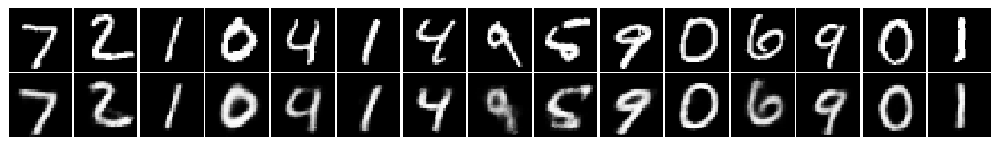

epoch 21 | iter 9420 | loss 19.31945 | KL loss 4.47646 | recon loss 14.84300 
epoch 21 | iter 9440 | loss 19.29049 | KL loss 4.57585 | recon loss 14.71464 
epoch 21 | iter 9460 | loss 19.24079 | KL loss 4.51826 | recon loss 14.72252 
epoch 21 | iter 9480 | loss 19.23728 | KL loss 4.53643 | recon loss 14.70085 
epoch 21 | iter 9500 | loss 19.58989 | KL loss 4.51726 | recon loss 15.07263 


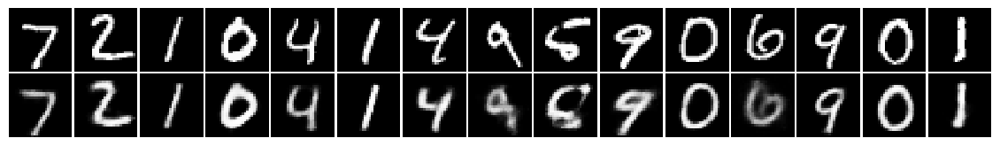

epoch 21 | iter 9520 | loss 19.30242 | KL loss 4.56162 | recon loss 14.74080 
epoch 21 | iter 9540 | loss 19.40596 | KL loss 4.57325 | recon loss 14.83272 
epoch 21 | iter 9560 | loss 19.16183 | KL loss 4.50627 | recon loss 14.65556 
epoch 21 | iter 9580 | loss 19.21779 | KL loss 4.53830 | recon loss 14.67949 
epoch 21 | iter 9600 | loss 19.21351 | KL loss 4.46630 | recon loss 14.74721 


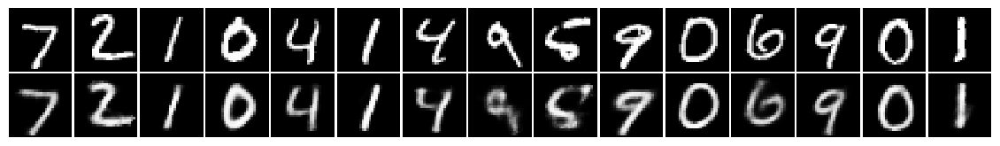

epoch 21 | iter 9620 | loss 19.21661 | KL loss 4.50571 | recon loss 14.71089 
epoch 21 | iter 9640 | loss 19.42697 | KL loss 4.55469 | recon loss 14.87228 
epoch 21 | iter 9660 | loss 19.18069 | KL loss 4.51646 | recon loss 14.66422 
epoch 21 | iter 9680 | loss 19.13486 | KL loss 4.43455 | recon loss 14.70031 
epoch 21 | iter 9700 | loss 19.18744 | KL loss 4.51419 | recon loss 14.67325 


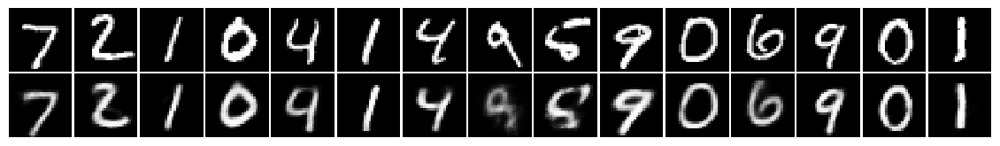

epoch 21 | iter 9720 | loss 19.31169 | KL loss 4.46458 | recon loss 14.84712 
epoch 21 | iter 9740 | loss 19.23466 | KL loss 4.51854 | recon loss 14.71612 
epoch 21 | iter 9760 | loss 19.15667 | KL loss 4.47138 | recon loss 14.68529 
epoch 21 | iter 9780 | loss 19.21791 | KL loss 4.50100 | recon loss 14.71691 
epoch 21 | iter 9800 | loss 19.33122 | KL loss 4.52427 | recon loss 14.80695 


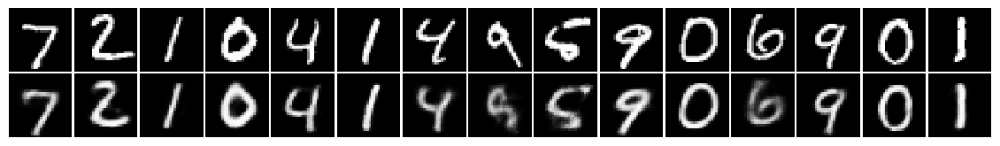

epoch 21 | iter 9820 | loss 19.15762 | KL loss 4.50369 | recon loss 14.65394 
epoch 21 | iter 9840 | loss 19.14789 | KL loss 4.45065 | recon loss 14.69723 
epoch 22 | iter 9860 | loss 19.48379 | KL loss 4.54092 | recon loss 14.94286 
epoch 22 | iter 9880 | loss 19.19801 | KL loss 4.48654 | recon loss 14.71146 
epoch 22 | iter 9900 | loss 19.19400 | KL loss 4.53162 | recon loss 14.66238 


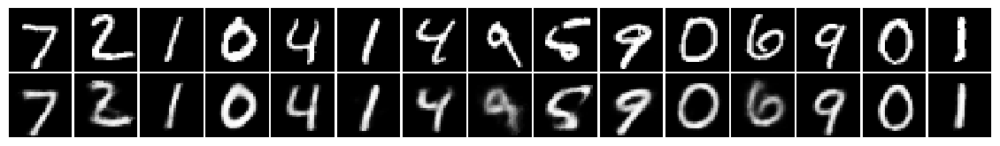

epoch 22 | iter 9920 | loss 19.14963 | KL loss 4.52250 | recon loss 14.62712 
epoch 22 | iter 9940 | loss 19.00881 | KL loss 4.52152 | recon loss 14.48730 
epoch 22 | iter 9960 | loss 19.37190 | KL loss 4.48069 | recon loss 14.89120 
epoch 22 | iter 9980 | loss 19.28804 | KL loss 4.53985 | recon loss 14.74819 
epoch 22 | iter 10000 | loss 19.28661 | KL loss 4.48568 | recon loss 14.80093 


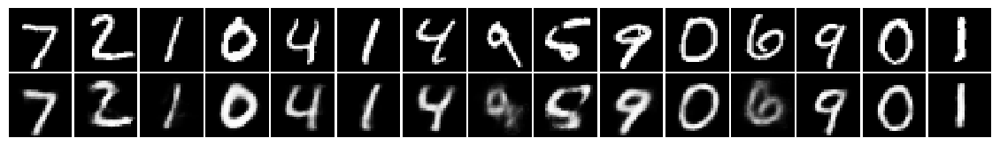

epoch 22 | iter 10020 | loss 19.33609 | KL loss 4.56386 | recon loss 14.77224 
epoch 22 | iter 10040 | loss 19.18307 | KL loss 4.54594 | recon loss 14.63713 
epoch 22 | iter 10060 | loss 19.02540 | KL loss 4.48233 | recon loss 14.54307 
epoch 22 | iter 10080 | loss 18.89607 | KL loss 4.45703 | recon loss 14.43904 
epoch 22 | iter 10100 | loss 19.00854 | KL loss 4.53096 | recon loss 14.47758 


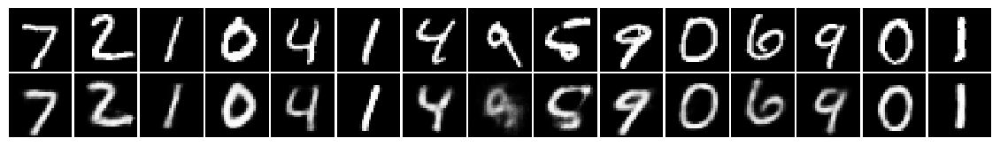

epoch 22 | iter 10120 | loss 19.41313 | KL loss 4.54797 | recon loss 14.86516 
epoch 22 | iter 10140 | loss 19.54731 | KL loss 4.56816 | recon loss 14.97915 
epoch 22 | iter 10160 | loss 19.04635 | KL loss 4.52255 | recon loss 14.52380 
epoch 22 | iter 10180 | loss 19.41691 | KL loss 4.49344 | recon loss 14.92347 
epoch 22 | iter 10200 | loss 19.33144 | KL loss 4.54886 | recon loss 14.78259 


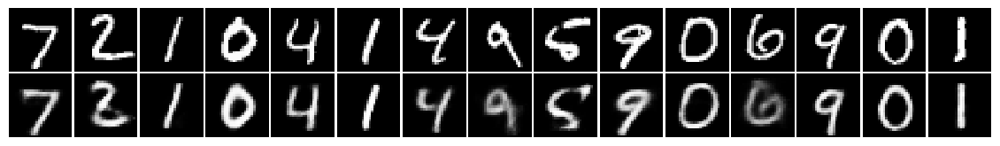

epoch 22 | iter 10220 | loss 19.15852 | KL loss 4.50762 | recon loss 14.65091 
epoch 22 | iter 10240 | loss 19.37973 | KL loss 4.56127 | recon loss 14.81846 
epoch 22 | iter 10260 | loss 19.09657 | KL loss 4.49298 | recon loss 14.60359 
epoch 22 | iter 10280 | loss 19.18103 | KL loss 4.46167 | recon loss 14.71937 
epoch 22 | iter 10300 | loss 19.20862 | KL loss 4.55459 | recon loss 14.65403 


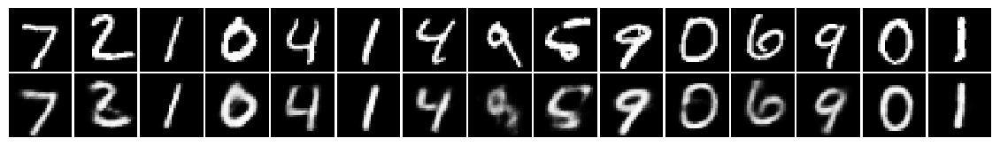

epoch 23 | iter 10320 | loss 19.26555 | KL loss 4.54617 | recon loss 14.71938 
epoch 23 | iter 10340 | loss 18.95311 | KL loss 4.56057 | recon loss 14.39254 
epoch 23 | iter 10360 | loss 19.11573 | KL loss 4.49448 | recon loss 14.62125 
epoch 23 | iter 10380 | loss 19.12716 | KL loss 4.53946 | recon loss 14.58770 
epoch 23 | iter 10400 | loss 19.12712 | KL loss 4.49670 | recon loss 14.63043 


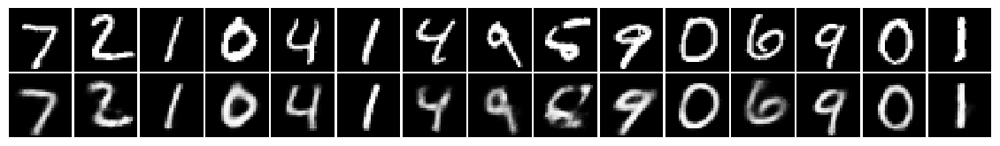

epoch 23 | iter 10420 | loss 19.25650 | KL loss 4.52240 | recon loss 14.73411 
epoch 23 | iter 10440 | loss 19.11139 | KL loss 4.46552 | recon loss 14.64586 
epoch 23 | iter 10460 | loss 19.20470 | KL loss 4.54502 | recon loss 14.65968 
epoch 23 | iter 10480 | loss 19.38671 | KL loss 4.52380 | recon loss 14.86292 
epoch 23 | iter 10500 | loss 19.25924 | KL loss 4.53960 | recon loss 14.71964 


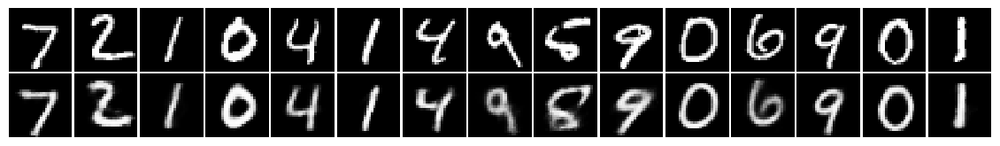

epoch 23 | iter 10520 | loss 19.31486 | KL loss 4.51228 | recon loss 14.80258 
epoch 23 | iter 10540 | loss 19.02569 | KL loss 4.54188 | recon loss 14.48381 
epoch 23 | iter 10560 | loss 19.15533 | KL loss 4.49539 | recon loss 14.65993 
epoch 23 | iter 10580 | loss 18.96089 | KL loss 4.54998 | recon loss 14.41091 
epoch 23 | iter 10600 | loss 19.06365 | KL loss 4.54789 | recon loss 14.51576 


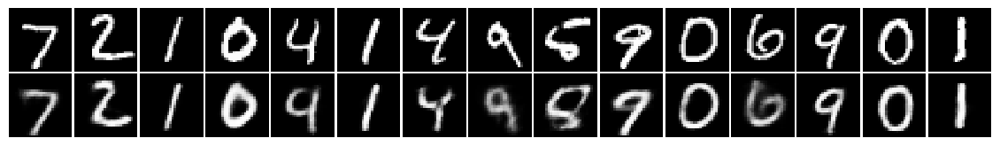

epoch 23 | iter 10620 | loss 19.10530 | KL loss 4.51581 | recon loss 14.58949 
epoch 23 | iter 10640 | loss 19.24337 | KL loss 4.53004 | recon loss 14.71333 
epoch 23 | iter 10660 | loss 19.41899 | KL loss 4.56829 | recon loss 14.85070 
epoch 23 | iter 10680 | loss 19.09154 | KL loss 4.48307 | recon loss 14.60847 
epoch 23 | iter 10700 | loss 19.30146 | KL loss 4.60107 | recon loss 14.70040 


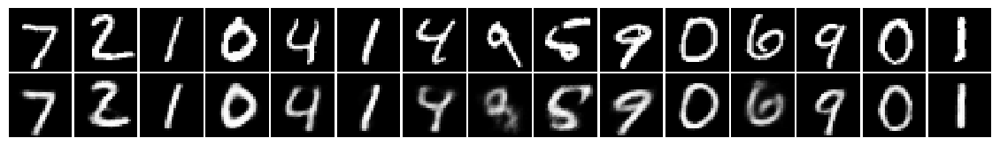

epoch 23 | iter 10720 | loss 19.11676 | KL loss 4.51627 | recon loss 14.60049 
epoch 23 | iter 10740 | loss 19.26289 | KL loss 4.49550 | recon loss 14.76740 
epoch 23 | iter 10760 | loss 19.32165 | KL loss 4.53247 | recon loss 14.78918 
epoch 23 | iter 10780 | loss 19.22129 | KL loss 4.55146 | recon loss 14.66983 
epoch 24 | iter 10800 | loss 19.07086 | KL loss 4.58880 | recon loss 14.48206 


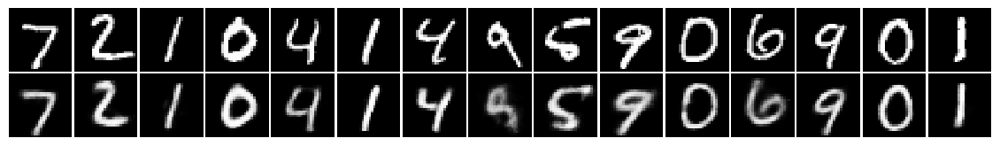

epoch 24 | iter 10820 | loss 19.02242 | KL loss 4.55418 | recon loss 14.46824 
epoch 24 | iter 10840 | loss 19.29155 | KL loss 4.53347 | recon loss 14.75808 
epoch 24 | iter 10860 | loss 18.88645 | KL loss 4.54182 | recon loss 14.34463 
epoch 24 | iter 10880 | loss 18.99935 | KL loss 4.49403 | recon loss 14.50532 
epoch 24 | iter 10900 | loss 19.08231 | KL loss 4.63353 | recon loss 14.44877 


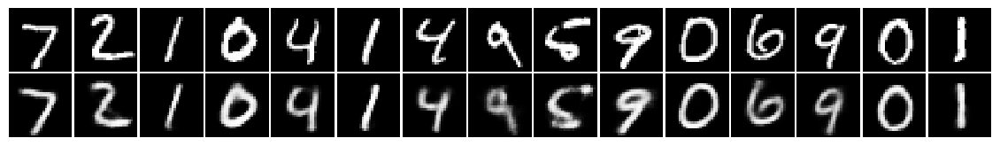

epoch 24 | iter 10920 | loss 19.41840 | KL loss 4.48742 | recon loss 14.93098 
epoch 24 | iter 10940 | loss 19.14373 | KL loss 4.54789 | recon loss 14.59584 
epoch 24 | iter 10960 | loss 19.08340 | KL loss 4.55063 | recon loss 14.53276 
epoch 24 | iter 10980 | loss 19.02005 | KL loss 4.51381 | recon loss 14.50624 
epoch 24 | iter 11000 | loss 18.98255 | KL loss 4.55812 | recon loss 14.42443 


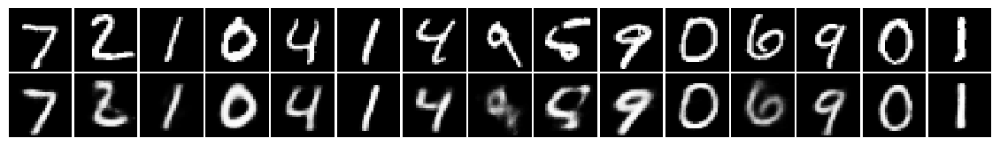

epoch 24 | iter 11020 | loss 19.23999 | KL loss 4.52526 | recon loss 14.71474 
epoch 24 | iter 11040 | loss 19.28191 | KL loss 4.51264 | recon loss 14.76926 
epoch 24 | iter 11060 | loss 19.09252 | KL loss 4.57222 | recon loss 14.52030 
epoch 24 | iter 11080 | loss 19.14559 | KL loss 4.55913 | recon loss 14.58646 
epoch 24 | iter 11100 | loss 19.29688 | KL loss 4.58583 | recon loss 14.71105 


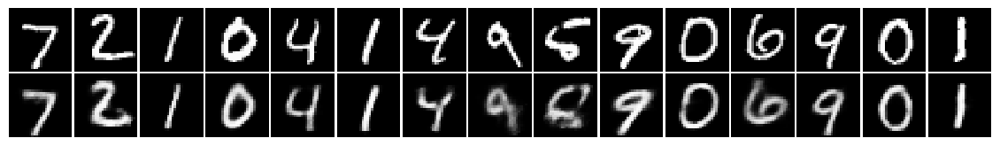

epoch 24 | iter 11120 | loss 18.97318 | KL loss 4.49857 | recon loss 14.47462 
epoch 24 | iter 11140 | loss 18.88990 | KL loss 4.47200 | recon loss 14.41790 
epoch 24 | iter 11160 | loss 18.74522 | KL loss 4.55633 | recon loss 14.18889 
epoch 24 | iter 11180 | loss 19.10205 | KL loss 4.52788 | recon loss 14.57417 
epoch 24 | iter 11200 | loss 19.19005 | KL loss 4.56686 | recon loss 14.62319 


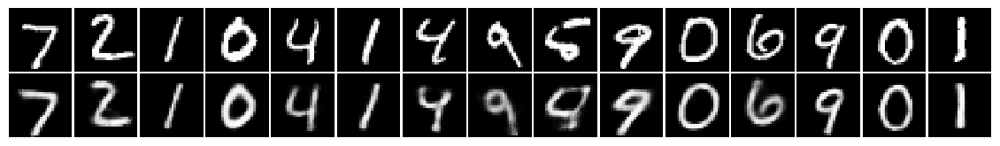

epoch 24 | iter 11220 | loss 19.12044 | KL loss 4.57347 | recon loss 14.54697 
epoch 24 | iter 11240 | loss 19.28916 | KL loss 4.51649 | recon loss 14.77267 
epoch 25 | iter 11260 | loss 19.14288 | KL loss 4.52154 | recon loss 14.62134 
epoch 25 | iter 11280 | loss 19.05307 | KL loss 4.57649 | recon loss 14.47658 
epoch 25 | iter 11300 | loss 19.09096 | KL loss 4.52165 | recon loss 14.56930 


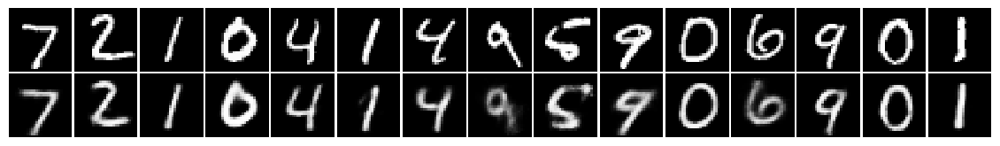

epoch 25 | iter 11320 | loss 18.97092 | KL loss 4.49843 | recon loss 14.47249 
epoch 25 | iter 11340 | loss 19.09219 | KL loss 4.58965 | recon loss 14.50254 
epoch 25 | iter 11360 | loss 19.26373 | KL loss 4.51840 | recon loss 14.74533 
epoch 25 | iter 11380 | loss 18.99340 | KL loss 4.53938 | recon loss 14.45402 
epoch 25 | iter 11400 | loss 18.99848 | KL loss 4.53165 | recon loss 14.46683 


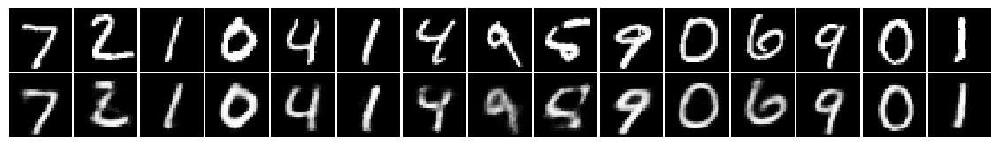

epoch 25 | iter 11420 | loss 18.90406 | KL loss 4.53199 | recon loss 14.37207 
epoch 25 | iter 11440 | loss 18.91001 | KL loss 4.52477 | recon loss 14.38525 
epoch 25 | iter 11460 | loss 19.17974 | KL loss 4.55297 | recon loss 14.62677 
epoch 25 | iter 11480 | loss 19.24735 | KL loss 4.59654 | recon loss 14.65081 
epoch 25 | iter 11500 | loss 19.03813 | KL loss 4.53938 | recon loss 14.49876 


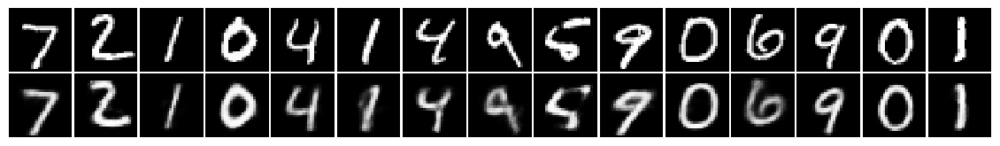

epoch 25 | iter 11520 | loss 19.11165 | KL loss 4.55030 | recon loss 14.56135 
epoch 25 | iter 11540 | loss 18.92037 | KL loss 4.53924 | recon loss 14.38112 
epoch 25 | iter 11560 | loss 19.15722 | KL loss 4.49966 | recon loss 14.65756 
epoch 25 | iter 11580 | loss 18.95887 | KL loss 4.57277 | recon loss 14.38610 
epoch 25 | iter 11600 | loss 18.99080 | KL loss 4.59679 | recon loss 14.39401 


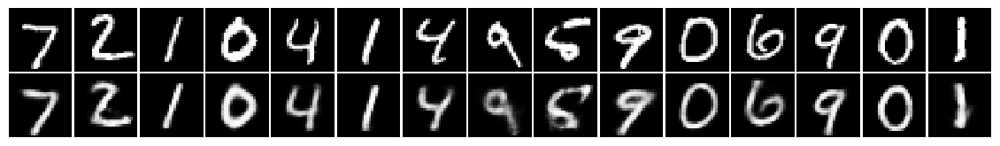

epoch 25 | iter 11620 | loss 18.97967 | KL loss 4.51317 | recon loss 14.46650 
epoch 25 | iter 11640 | loss 19.34884 | KL loss 4.58254 | recon loss 14.76630 
epoch 25 | iter 11660 | loss 19.05885 | KL loss 4.52425 | recon loss 14.53460 
epoch 25 | iter 11680 | loss 19.05776 | KL loss 4.55758 | recon loss 14.50018 
epoch 25 | iter 11700 | loss 19.19654 | KL loss 4.56113 | recon loss 14.63542 


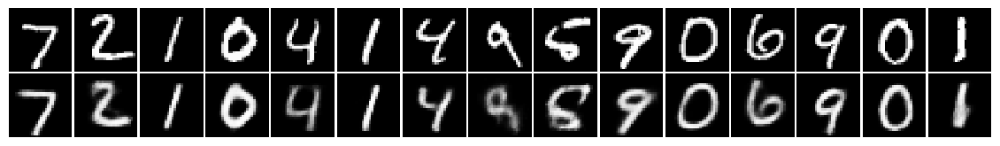

epoch 25 | iter 11720 | loss 18.82532 | KL loss 4.53965 | recon loss 14.28567 
epoch 26 | iter 11740 | loss 18.94791 | KL loss 4.46512 | recon loss 14.48280 
epoch 26 | iter 11760 | loss 19.05933 | KL loss 4.53838 | recon loss 14.52095 
epoch 26 | iter 11780 | loss 18.78245 | KL loss 4.54373 | recon loss 14.23872 
epoch 26 | iter 11800 | loss 19.05630 | KL loss 4.60231 | recon loss 14.45399 


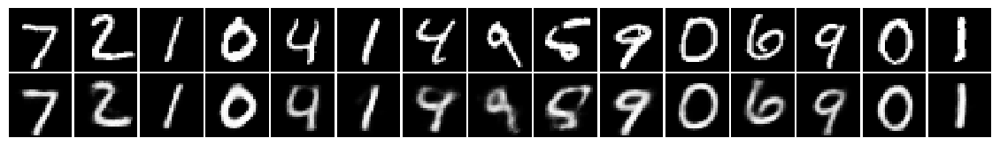

epoch 26 | iter 11820 | loss 18.99926 | KL loss 4.52243 | recon loss 14.47683 
epoch 26 | iter 11840 | loss 18.90136 | KL loss 4.51803 | recon loss 14.38333 
epoch 26 | iter 11860 | loss 18.60066 | KL loss 4.52700 | recon loss 14.07366 
epoch 26 | iter 11880 | loss 19.27759 | KL loss 4.59057 | recon loss 14.68702 
epoch 26 | iter 11900 | loss 18.86811 | KL loss 4.55958 | recon loss 14.30853 


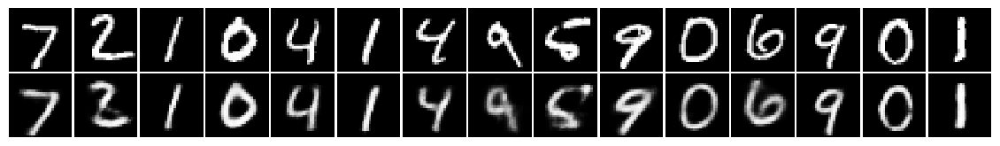

epoch 26 | iter 11920 | loss 18.83263 | KL loss 4.57526 | recon loss 14.25738 
epoch 26 | iter 11940 | loss 19.09738 | KL loss 4.58728 | recon loss 14.51010 
epoch 26 | iter 11960 | loss 19.20178 | KL loss 4.54607 | recon loss 14.65572 
epoch 26 | iter 11980 | loss 19.08817 | KL loss 4.53632 | recon loss 14.55185 
epoch 26 | iter 12000 | loss 18.65919 | KL loss 4.51287 | recon loss 14.14632 


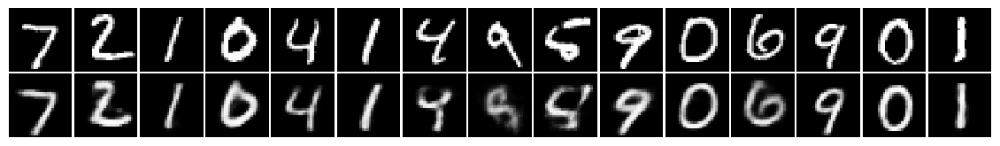

epoch 26 | iter 12020 | loss 18.90194 | KL loss 4.55447 | recon loss 14.34746 
epoch 26 | iter 12040 | loss 19.25013 | KL loss 4.59609 | recon loss 14.65404 
epoch 26 | iter 12060 | loss 18.87513 | KL loss 4.46467 | recon loss 14.41046 
epoch 26 | iter 12080 | loss 19.16853 | KL loss 4.57062 | recon loss 14.59791 
epoch 26 | iter 12100 | loss 19.23774 | KL loss 4.59929 | recon loss 14.63845 


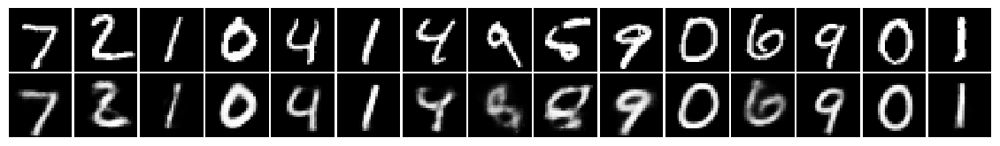

epoch 26 | iter 12120 | loss 19.05776 | KL loss 4.59152 | recon loss 14.46624 
epoch 26 | iter 12140 | loss 18.92018 | KL loss 4.45687 | recon loss 14.46331 
epoch 26 | iter 12160 | loss 19.09410 | KL loss 4.54201 | recon loss 14.55208 
epoch 26 | iter 12180 | loss 19.01555 | KL loss 4.56753 | recon loss 14.44802 
epoch 27 | iter 12200 | loss 18.98516 | KL loss 4.55945 | recon loss 14.42571 


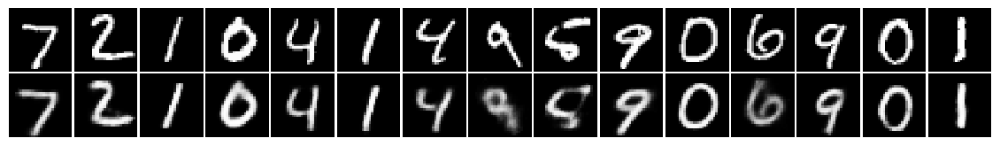

epoch 27 | iter 12220 | loss 19.00322 | KL loss 4.59439 | recon loss 14.40883 
epoch 27 | iter 12240 | loss 19.07216 | KL loss 4.57551 | recon loss 14.49665 
epoch 27 | iter 12260 | loss 19.04045 | KL loss 4.58934 | recon loss 14.45111 
epoch 27 | iter 12280 | loss 18.67967 | KL loss 4.52498 | recon loss 14.15470 
epoch 27 | iter 12300 | loss 18.89976 | KL loss 4.53326 | recon loss 14.36650 


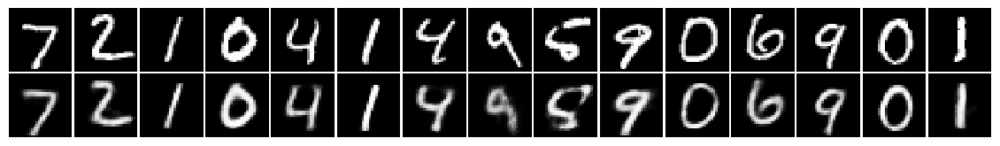

epoch 27 | iter 12320 | loss 18.98262 | KL loss 4.62126 | recon loss 14.36136 
epoch 27 | iter 12340 | loss 18.95148 | KL loss 4.55655 | recon loss 14.39493 
epoch 27 | iter 12360 | loss 18.70529 | KL loss 4.54187 | recon loss 14.16342 
epoch 27 | iter 12380 | loss 19.16315 | KL loss 4.55774 | recon loss 14.60541 
epoch 27 | iter 12400 | loss 19.20875 | KL loss 4.57931 | recon loss 14.62943 


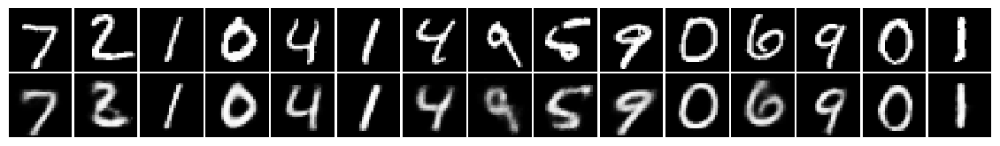

epoch 27 | iter 12420 | loss 18.81481 | KL loss 4.54425 | recon loss 14.27056 
epoch 27 | iter 12440 | loss 18.83708 | KL loss 4.58711 | recon loss 14.24997 
epoch 27 | iter 12460 | loss 18.86703 | KL loss 4.53624 | recon loss 14.33079 
epoch 27 | iter 12480 | loss 19.06383 | KL loss 4.50729 | recon loss 14.55654 
epoch 27 | iter 12500 | loss 18.78405 | KL loss 4.51266 | recon loss 14.27139 


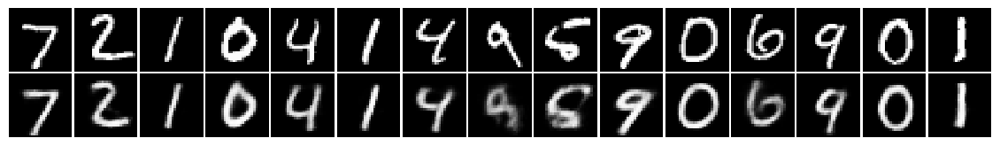

epoch 27 | iter 12520 | loss 18.98652 | KL loss 4.62742 | recon loss 14.35910 
epoch 27 | iter 12540 | loss 19.02679 | KL loss 4.52695 | recon loss 14.49984 
epoch 27 | iter 12560 | loss 19.20593 | KL loss 4.53775 | recon loss 14.66818 
epoch 27 | iter 12580 | loss 19.10745 | KL loss 4.53965 | recon loss 14.56780 
epoch 27 | iter 12600 | loss 19.04602 | KL loss 4.58972 | recon loss 14.45630 


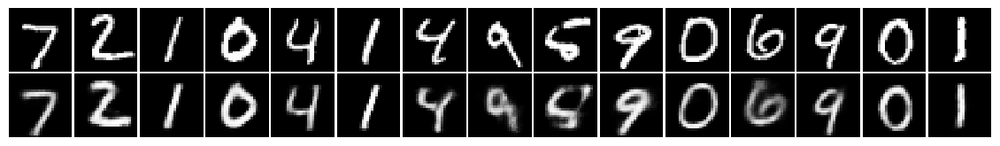

epoch 27 | iter 12620 | loss 19.00166 | KL loss 4.56518 | recon loss 14.43648 
epoch 27 | iter 12640 | loss 18.96462 | KL loss 4.54913 | recon loss 14.41549 
epoch 27 | iter 12660 | loss 18.78255 | KL loss 4.51501 | recon loss 14.26754 
epoch 28 | iter 12680 | loss 18.96667 | KL loss 4.57584 | recon loss 14.39083 
epoch 28 | iter 12700 | loss 18.69042 | KL loss 4.52841 | recon loss 14.16201 


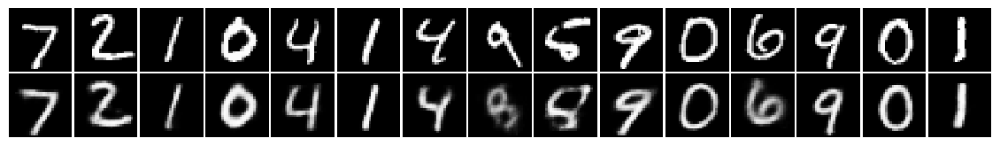

epoch 28 | iter 12720 | loss 18.82958 | KL loss 4.51302 | recon loss 14.31656 
epoch 28 | iter 12740 | loss 18.98741 | KL loss 4.55091 | recon loss 14.43650 
epoch 28 | iter 12760 | loss 19.11741 | KL loss 4.57685 | recon loss 14.54056 
epoch 28 | iter 12780 | loss 19.11923 | KL loss 4.60521 | recon loss 14.51402 
epoch 28 | iter 12800 | loss 18.53705 | KL loss 4.48052 | recon loss 14.05654 


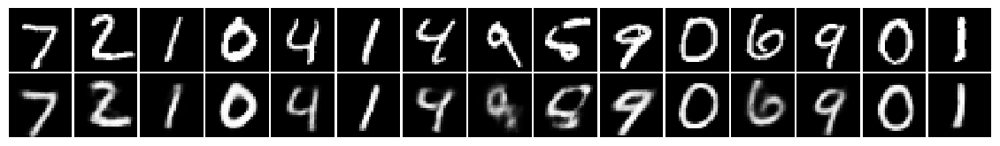

epoch 28 | iter 12820 | loss 19.05255 | KL loss 4.62380 | recon loss 14.42875 
epoch 28 | iter 12840 | loss 18.61224 | KL loss 4.52533 | recon loss 14.08691 
epoch 28 | iter 12860 | loss 18.90375 | KL loss 4.57764 | recon loss 14.32611 
epoch 28 | iter 12880 | loss 18.92327 | KL loss 4.55063 | recon loss 14.37264 
epoch 28 | iter 12900 | loss 18.92477 | KL loss 4.57196 | recon loss 14.35281 


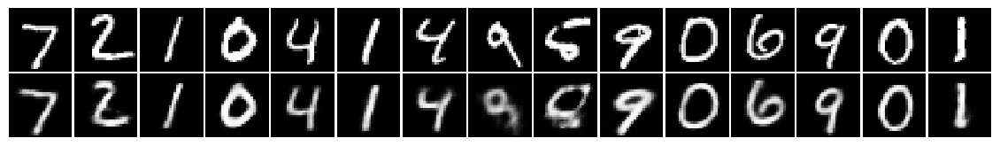

epoch 28 | iter 12920 | loss 18.93709 | KL loss 4.55293 | recon loss 14.38417 
epoch 28 | iter 12940 | loss 19.24392 | KL loss 4.58928 | recon loss 14.65464 
epoch 28 | iter 12960 | loss 18.78270 | KL loss 4.53644 | recon loss 14.24626 
epoch 28 | iter 12980 | loss 18.88019 | KL loss 4.59556 | recon loss 14.28464 
epoch 28 | iter 13000 | loss 18.83446 | KL loss 4.60573 | recon loss 14.22873 


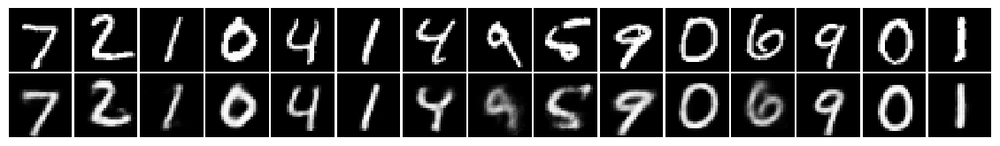

epoch 28 | iter 13020 | loss 18.71909 | KL loss 4.56854 | recon loss 14.15056 
epoch 28 | iter 13040 | loss 18.92776 | KL loss 4.56463 | recon loss 14.36314 
epoch 28 | iter 13060 | loss 18.91888 | KL loss 4.59551 | recon loss 14.32338 
epoch 28 | iter 13080 | loss 19.02572 | KL loss 4.63280 | recon loss 14.39292 
epoch 28 | iter 13100 | loss 18.90136 | KL loss 4.56056 | recon loss 14.34080 


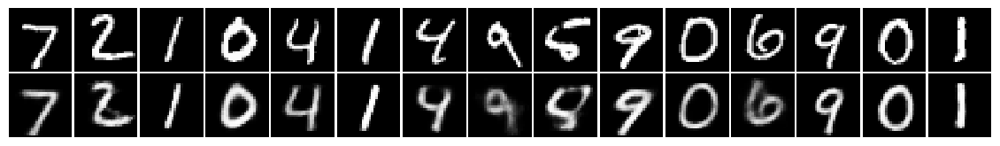

epoch 28 | iter 13120 | loss 19.10404 | KL loss 4.57531 | recon loss 14.52872 
epoch 29 | iter 13140 | loss 19.38874 | KL loss 4.59725 | recon loss 14.79149 
epoch 29 | iter 13160 | loss 18.61352 | KL loss 4.59511 | recon loss 14.01841 
epoch 29 | iter 13180 | loss 18.93980 | KL loss 4.57613 | recon loss 14.36367 
epoch 29 | iter 13200 | loss 18.78455 | KL loss 4.52589 | recon loss 14.25866 


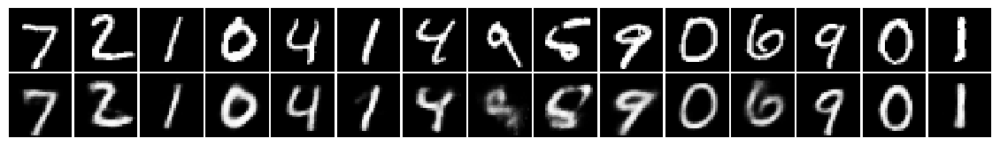

epoch 29 | iter 13220 | loss 18.91168 | KL loss 4.60839 | recon loss 14.30329 
epoch 29 | iter 13240 | loss 19.00550 | KL loss 4.59031 | recon loss 14.41519 
epoch 29 | iter 13260 | loss 18.72223 | KL loss 4.58269 | recon loss 14.13954 
epoch 29 | iter 13280 | loss 18.72622 | KL loss 4.52251 | recon loss 14.20371 
epoch 29 | iter 13300 | loss 18.92076 | KL loss 4.55743 | recon loss 14.36333 


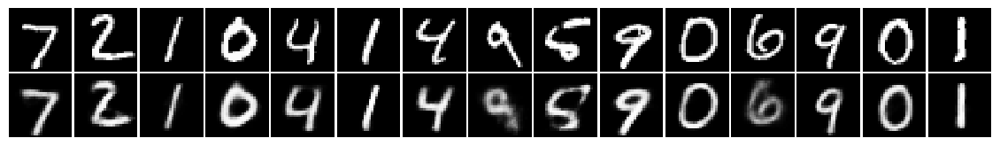

epoch 29 | iter 13320 | loss 18.97359 | KL loss 4.55240 | recon loss 14.42119 
epoch 29 | iter 13340 | loss 18.85912 | KL loss 4.57334 | recon loss 14.28579 
epoch 29 | iter 13360 | loss 18.62718 | KL loss 4.54694 | recon loss 14.08024 
epoch 29 | iter 13380 | loss 19.18616 | KL loss 4.59529 | recon loss 14.59086 
epoch 29 | iter 13400 | loss 18.90579 | KL loss 4.57188 | recon loss 14.33391 


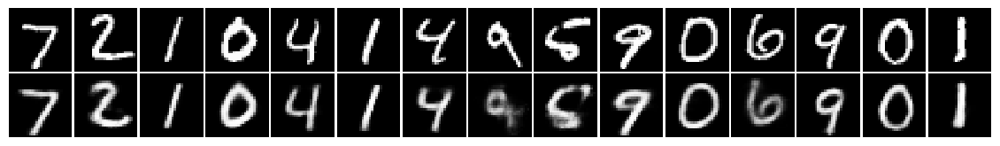

epoch 29 | iter 13420 | loss 19.03214 | KL loss 4.57862 | recon loss 14.45352 
epoch 29 | iter 13440 | loss 18.86753 | KL loss 4.55068 | recon loss 14.31686 
epoch 29 | iter 13460 | loss 18.80373 | KL loss 4.52031 | recon loss 14.28343 
epoch 29 | iter 13480 | loss 18.91241 | KL loss 4.58348 | recon loss 14.32893 
epoch 29 | iter 13500 | loss 18.69859 | KL loss 4.60306 | recon loss 14.09553 


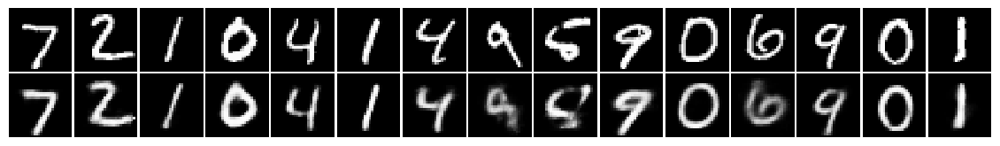

epoch 29 | iter 13520 | loss 18.86441 | KL loss 4.55471 | recon loss 14.30969 
epoch 29 | iter 13540 | loss 18.99446 | KL loss 4.59789 | recon loss 14.39657 
epoch 29 | iter 13560 | loss 18.95367 | KL loss 4.57007 | recon loss 14.38360 
epoch 29 | iter 13580 | loss 18.80270 | KL loss 4.56197 | recon loss 14.24073 
epoch 29 | iter 13600 | loss 19.11165 | KL loss 4.61124 | recon loss 14.50041 


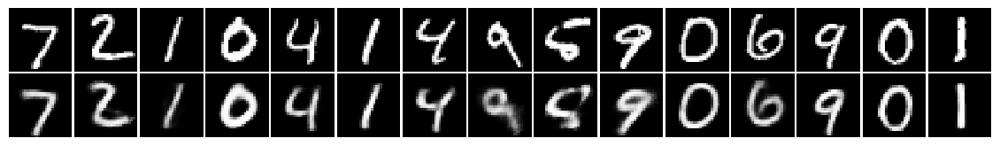

epoch 30 | iter 13620 | loss 18.61456 | KL loss 4.59381 | recon loss 14.02075 
epoch 30 | iter 13640 | loss 19.12346 | KL loss 4.61493 | recon loss 14.50853 
epoch 30 | iter 13660 | loss 18.96036 | KL loss 4.51962 | recon loss 14.44074 
epoch 30 | iter 13680 | loss 18.59094 | KL loss 4.53632 | recon loss 14.05462 
epoch 30 | iter 13700 | loss 18.55452 | KL loss 4.59122 | recon loss 13.96331 


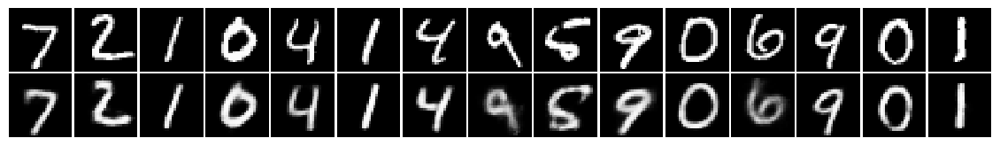

epoch 30 | iter 13720 | loss 18.73565 | KL loss 4.55895 | recon loss 14.17670 
epoch 30 | iter 13740 | loss 18.79056 | KL loss 4.61486 | recon loss 14.17570 
epoch 30 | iter 13760 | loss 18.92930 | KL loss 4.53187 | recon loss 14.39743 
epoch 30 | iter 13780 | loss 18.61643 | KL loss 4.60799 | recon loss 14.00844 
epoch 30 | iter 13800 | loss 18.91588 | KL loss 4.55405 | recon loss 14.36183 


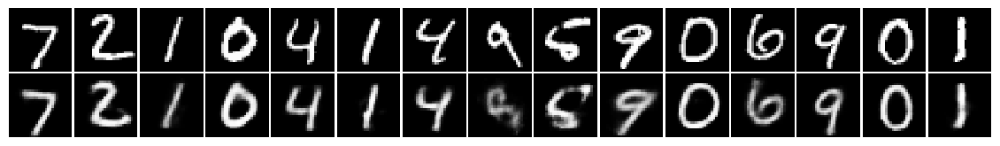

epoch 30 | iter 13820 | loss 18.65155 | KL loss 4.52194 | recon loss 14.12961 
epoch 30 | iter 13840 | loss 19.01295 | KL loss 4.54488 | recon loss 14.46806 
epoch 30 | iter 13860 | loss 18.96208 | KL loss 4.55653 | recon loss 14.40555 
epoch 30 | iter 13880 | loss 19.06433 | KL loss 4.60021 | recon loss 14.46412 
epoch 30 | iter 13900 | loss 18.92029 | KL loss 4.57736 | recon loss 14.34292 


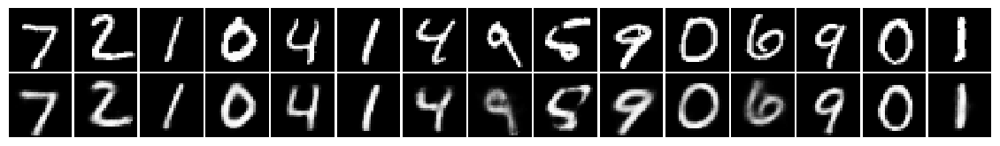

epoch 30 | iter 13920 | loss 18.85100 | KL loss 4.61230 | recon loss 14.23869 
epoch 30 | iter 13940 | loss 19.17452 | KL loss 4.57755 | recon loss 14.59697 
epoch 30 | iter 13960 | loss 18.91031 | KL loss 4.56592 | recon loss 14.34438 
epoch 30 | iter 13980 | loss 18.75772 | KL loss 4.57186 | recon loss 14.18586 
epoch 30 | iter 14000 | loss 18.83291 | KL loss 4.58692 | recon loss 14.24599 


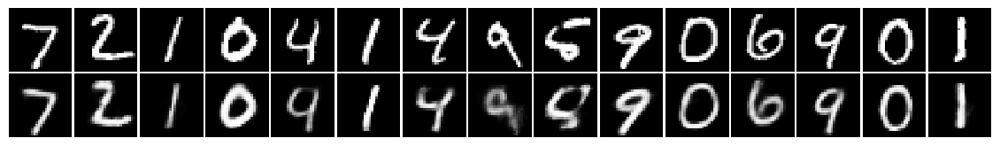

epoch 30 | iter 14020 | loss 18.74091 | KL loss 4.59990 | recon loss 14.14101 
epoch 30 | iter 14040 | loss 18.80903 | KL loss 4.58770 | recon loss 14.22133 
epoch 30 | iter 14060 | loss 18.97229 | KL loss 4.62984 | recon loss 14.34245 
epoch 31 | iter 14080 | loss 18.76577 | KL loss 4.57023 | recon loss 14.19553 
epoch 31 | iter 14100 | loss 18.64428 | KL loss 4.54468 | recon loss 14.09960 


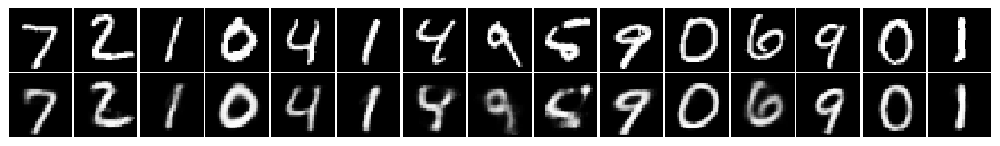

epoch 31 | iter 14120 | loss 18.62074 | KL loss 4.54108 | recon loss 14.07966 
epoch 31 | iter 14140 | loss 18.87281 | KL loss 4.60471 | recon loss 14.26810 
epoch 31 | iter 14160 | loss 18.67110 | KL loss 4.59679 | recon loss 14.07432 
epoch 31 | iter 14180 | loss 18.73939 | KL loss 4.57753 | recon loss 14.16186 
epoch 31 | iter 14200 | loss 18.58078 | KL loss 4.61074 | recon loss 13.97004 


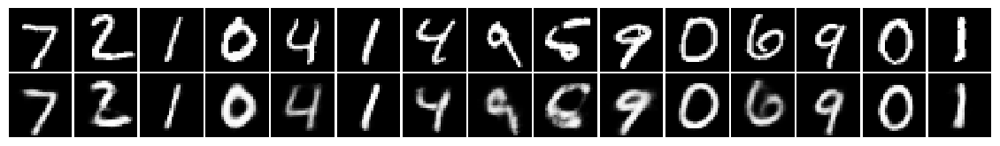

epoch 31 | iter 14220 | loss 18.86430 | KL loss 4.62284 | recon loss 14.24146 
epoch 31 | iter 14240 | loss 18.68410 | KL loss 4.57660 | recon loss 14.10750 
epoch 31 | iter 14260 | loss 18.80262 | KL loss 4.57492 | recon loss 14.22771 
epoch 31 | iter 14280 | loss 18.83612 | KL loss 4.61265 | recon loss 14.22347 
epoch 31 | iter 14300 | loss 18.63710 | KL loss 4.52411 | recon loss 14.11299 


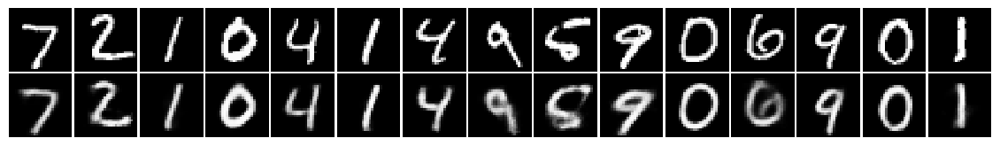

epoch 31 | iter 14320 | loss 18.89440 | KL loss 4.55228 | recon loss 14.34212 
epoch 31 | iter 14340 | loss 18.85809 | KL loss 4.53877 | recon loss 14.31933 
epoch 31 | iter 14360 | loss 18.98016 | KL loss 4.63827 | recon loss 14.34188 
epoch 31 | iter 14380 | loss 18.79194 | KL loss 4.54827 | recon loss 14.24367 
epoch 31 | iter 14400 | loss 18.67413 | KL loss 4.58249 | recon loss 14.09164 


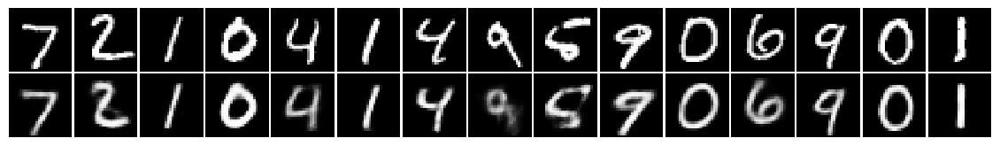

epoch 31 | iter 14420 | loss 18.64994 | KL loss 4.52950 | recon loss 14.12044 
epoch 31 | iter 14440 | loss 18.88831 | KL loss 4.53540 | recon loss 14.35291 
epoch 31 | iter 14460 | loss 18.68129 | KL loss 4.56216 | recon loss 14.11912 
epoch 31 | iter 14480 | loss 18.79076 | KL loss 4.61517 | recon loss 14.17560 
epoch 31 | iter 14500 | loss 18.80251 | KL loss 4.54253 | recon loss 14.25999 


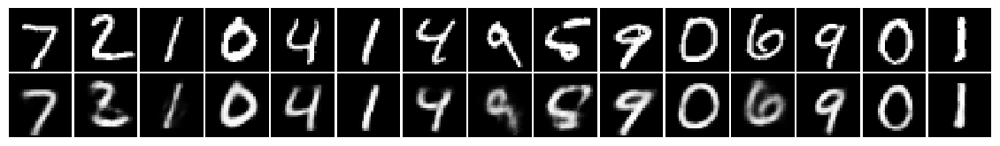

epoch 31 | iter 14520 | loss 19.00403 | KL loss 4.60610 | recon loss 14.39793 
epoch 31 | iter 14540 | loss 19.13456 | KL loss 4.66416 | recon loss 14.47040 
epoch 32 | iter 14560 | loss 18.65265 | KL loss 4.62588 | recon loss 14.02677 
epoch 32 | iter 14580 | loss 18.75140 | KL loss 4.60997 | recon loss 14.14142 
epoch 32 | iter 14600 | loss 18.64680 | KL loss 4.57539 | recon loss 14.07141 


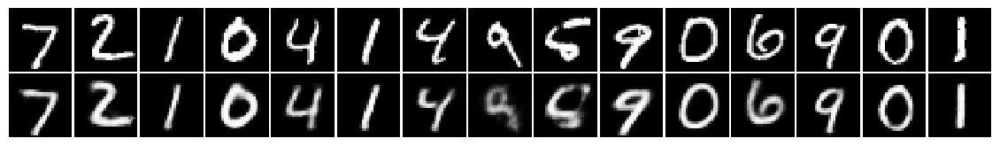

epoch 32 | iter 14620 | loss 18.76752 | KL loss 4.63978 | recon loss 14.12774 
epoch 32 | iter 14640 | loss 18.57637 | KL loss 4.54774 | recon loss 14.02863 
epoch 32 | iter 14660 | loss 18.72523 | KL loss 4.58627 | recon loss 14.13896 
epoch 32 | iter 14680 | loss 18.80281 | KL loss 4.61088 | recon loss 14.19193 
epoch 32 | iter 14700 | loss 18.70850 | KL loss 4.61984 | recon loss 14.08866 


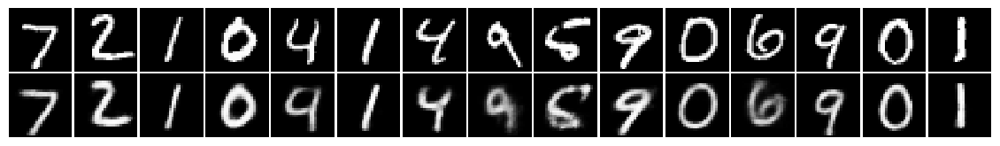

epoch 32 | iter 14720 | loss 18.80674 | KL loss 4.56736 | recon loss 14.23939 
epoch 32 | iter 14740 | loss 18.94968 | KL loss 4.64612 | recon loss 14.30356 
epoch 32 | iter 14760 | loss 18.88295 | KL loss 4.63215 | recon loss 14.25081 
epoch 32 | iter 14780 | loss 18.65224 | KL loss 4.60299 | recon loss 14.04925 
epoch 32 | iter 14800 | loss 18.77428 | KL loss 4.57857 | recon loss 14.19572 


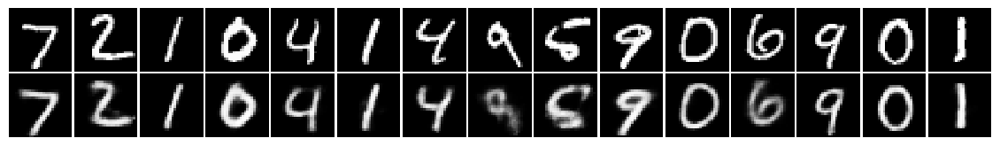

epoch 32 | iter 14820 | loss 18.72958 | KL loss 4.58908 | recon loss 14.14050 
epoch 32 | iter 14840 | loss 18.94948 | KL loss 4.59905 | recon loss 14.35043 
epoch 32 | iter 14860 | loss 18.56739 | KL loss 4.58214 | recon loss 13.98525 
epoch 32 | iter 14880 | loss 18.80453 | KL loss 4.57968 | recon loss 14.22485 
epoch 32 | iter 14900 | loss 18.72542 | KL loss 4.58142 | recon loss 14.14400 


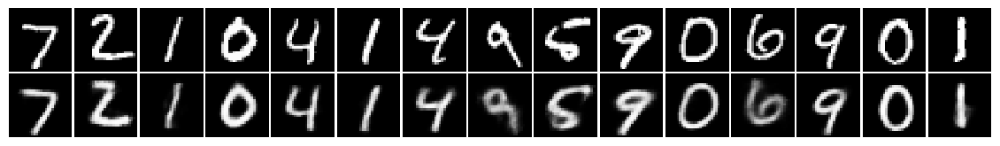

epoch 32 | iter 14920 | loss 18.65792 | KL loss 4.49859 | recon loss 14.15934 
epoch 32 | iter 14940 | loss 18.96886 | KL loss 4.57410 | recon loss 14.39475 
epoch 32 | iter 14960 | loss 18.73591 | KL loss 4.57171 | recon loss 14.16420 
epoch 32 | iter 14980 | loss 18.88000 | KL loss 4.56803 | recon loss 14.31198 
epoch 32 | iter 15000 | loss 19.04677 | KL loss 4.62588 | recon loss 14.42090 


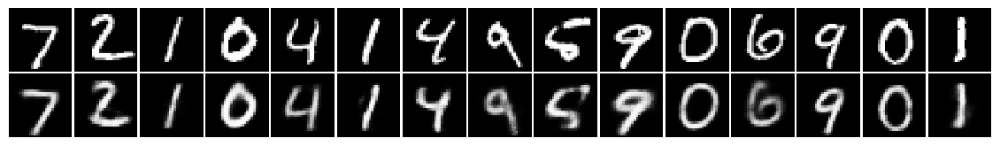

epoch 33 | iter 15020 | loss 18.77523 | KL loss 4.59723 | recon loss 14.17800 
epoch 33 | iter 15040 | loss 18.59082 | KL loss 4.61069 | recon loss 13.98013 
epoch 33 | iter 15060 | loss 18.73615 | KL loss 4.64183 | recon loss 14.09432 
epoch 33 | iter 15080 | loss 18.50687 | KL loss 4.58310 | recon loss 13.92377 
epoch 33 | iter 15100 | loss 18.55477 | KL loss 4.58593 | recon loss 13.96884 


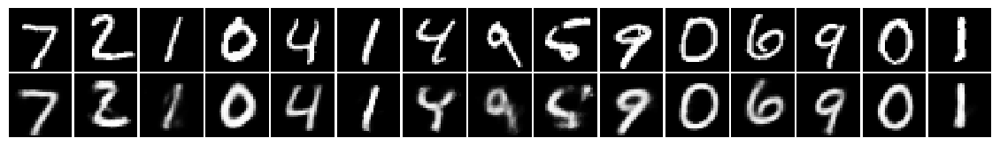

epoch 33 | iter 15120 | loss 18.83133 | KL loss 4.59913 | recon loss 14.23221 
epoch 33 | iter 15140 | loss 18.79156 | KL loss 4.60704 | recon loss 14.18452 
epoch 33 | iter 15160 | loss 18.51693 | KL loss 4.60692 | recon loss 13.91001 
epoch 33 | iter 15180 | loss 18.86160 | KL loss 4.60921 | recon loss 14.25239 
epoch 33 | iter 15200 | loss 18.59847 | KL loss 4.58116 | recon loss 14.01731 


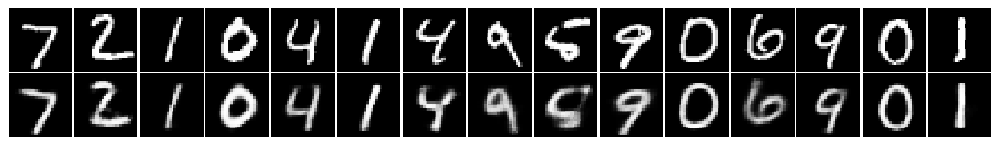

epoch 33 | iter 15220 | loss 18.72836 | KL loss 4.58592 | recon loss 14.14245 
epoch 33 | iter 15240 | loss 18.88448 | KL loss 4.58372 | recon loss 14.30076 
epoch 33 | iter 15260 | loss 18.54092 | KL loss 4.57206 | recon loss 13.96886 
epoch 33 | iter 15280 | loss 18.76896 | KL loss 4.62317 | recon loss 14.14579 
epoch 33 | iter 15300 | loss 18.58482 | KL loss 4.56146 | recon loss 14.02337 


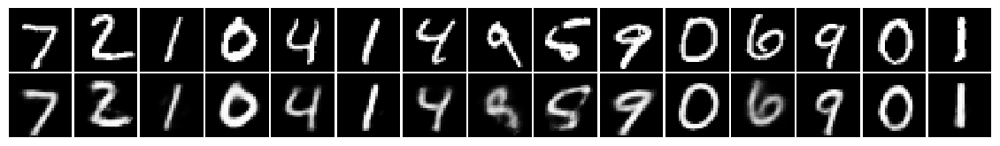

epoch 33 | iter 15320 | loss 18.81150 | KL loss 4.55987 | recon loss 14.25163 
epoch 33 | iter 15340 | loss 18.70304 | KL loss 4.59752 | recon loss 14.10552 
epoch 33 | iter 15360 | loss 18.78505 | KL loss 4.59934 | recon loss 14.18571 
epoch 33 | iter 15380 | loss 18.65807 | KL loss 4.55391 | recon loss 14.10416 
epoch 33 | iter 15400 | loss 18.76165 | KL loss 4.57169 | recon loss 14.18996 


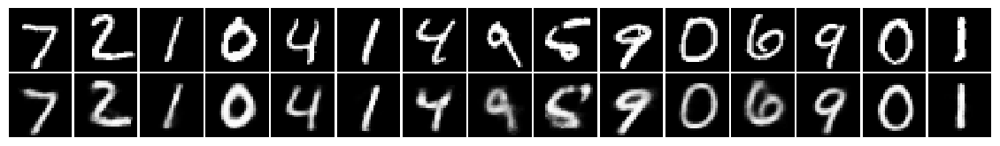

epoch 33 | iter 15420 | loss 18.55376 | KL loss 4.55277 | recon loss 14.00099 
epoch 33 | iter 15440 | loss 18.81939 | KL loss 4.57295 | recon loss 14.24644 
epoch 33 | iter 15460 | loss 18.93464 | KL loss 4.58566 | recon loss 14.34898 
epoch 34 | iter 15480 | loss 18.88339 | KL loss 4.59181 | recon loss 14.29158 
epoch 34 | iter 15500 | loss 18.45990 | KL loss 4.57705 | recon loss 13.88285 


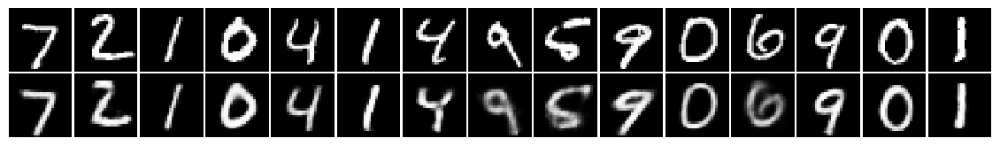

epoch 34 | iter 15520 | loss 18.60144 | KL loss 4.58648 | recon loss 14.01496 
epoch 34 | iter 15540 | loss 18.66646 | KL loss 4.60935 | recon loss 14.05711 
epoch 34 | iter 15560 | loss 18.46494 | KL loss 4.57059 | recon loss 13.89435 
epoch 34 | iter 15580 | loss 18.66292 | KL loss 4.58345 | recon loss 14.07946 
epoch 34 | iter 15600 | loss 18.77639 | KL loss 4.58054 | recon loss 14.19585 


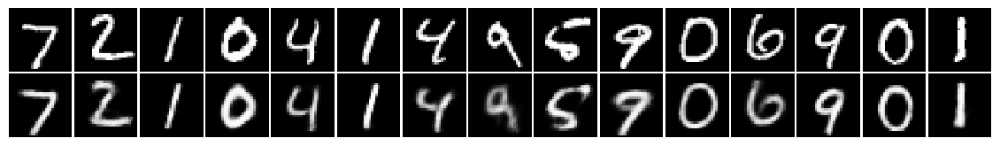

epoch 34 | iter 15620 | loss 18.87152 | KL loss 4.62109 | recon loss 14.25043 
epoch 34 | iter 15640 | loss 18.72270 | KL loss 4.65839 | recon loss 14.06431 
epoch 34 | iter 15660 | loss 18.60490 | KL loss 4.60042 | recon loss 14.00448 
epoch 34 | iter 15680 | loss 18.63179 | KL loss 4.55313 | recon loss 14.07867 
epoch 34 | iter 15700 | loss 18.76921 | KL loss 4.61739 | recon loss 14.15182 


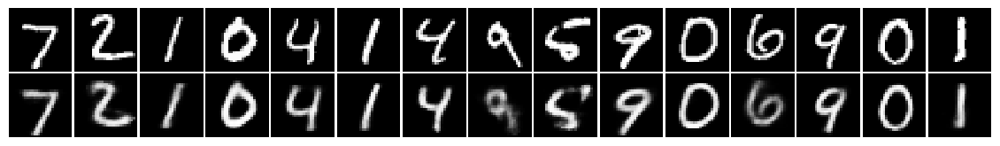

epoch 34 | iter 15720 | loss 18.77380 | KL loss 4.60599 | recon loss 14.16780 
epoch 34 | iter 15740 | loss 18.84902 | KL loss 4.62666 | recon loss 14.22236 
epoch 34 | iter 15760 | loss 18.83898 | KL loss 4.64211 | recon loss 14.19687 
epoch 34 | iter 15780 | loss 18.62864 | KL loss 4.59362 | recon loss 14.03502 
epoch 34 | iter 15800 | loss 18.69726 | KL loss 4.56954 | recon loss 14.12772 


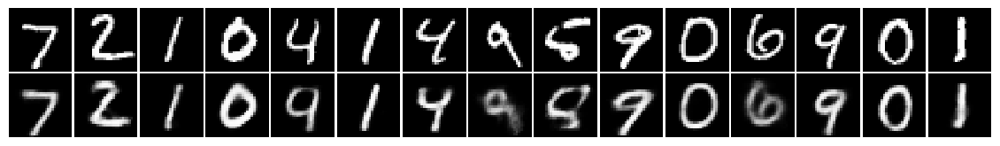

epoch 34 | iter 15820 | loss 18.61169 | KL loss 4.60322 | recon loss 14.00847 
epoch 34 | iter 15840 | loss 18.77993 | KL loss 4.55170 | recon loss 14.22823 
epoch 34 | iter 15860 | loss 18.62012 | KL loss 4.64655 | recon loss 13.97357 
epoch 34 | iter 15880 | loss 18.87294 | KL loss 4.64719 | recon loss 14.22575 
epoch 34 | iter 15900 | loss 18.74283 | KL loss 4.58879 | recon loss 14.15404 


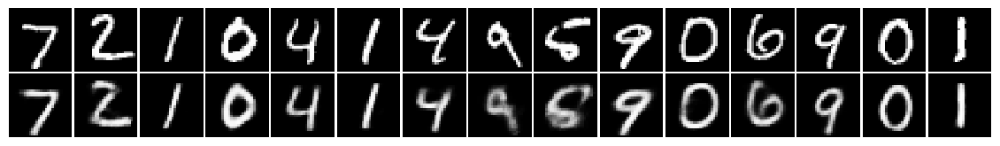

epoch 34 | iter 15920 | loss 18.64152 | KL loss 4.58978 | recon loss 14.05173 
epoch 34 | iter 15940 | loss 18.93506 | KL loss 4.67992 | recon loss 14.25514 
epoch 35 | iter 15960 | loss 18.73622 | KL loss 4.62583 | recon loss 14.11039 
epoch 35 | iter 15980 | loss 18.52085 | KL loss 4.58295 | recon loss 13.93791 
epoch 35 | iter 16000 | loss 18.73297 | KL loss 4.61838 | recon loss 14.11459 


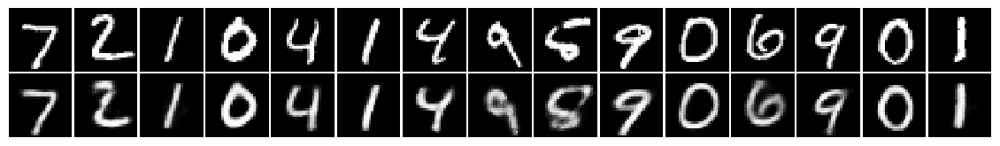

epoch 35 | iter 16020 | loss 18.51681 | KL loss 4.59012 | recon loss 13.92669 
epoch 35 | iter 16040 | loss 18.84965 | KL loss 4.60683 | recon loss 14.24282 
epoch 35 | iter 16060 | loss 18.68392 | KL loss 4.58293 | recon loss 14.10099 
epoch 35 | iter 16080 | loss 18.64610 | KL loss 4.56063 | recon loss 14.08547 
epoch 35 | iter 16100 | loss 18.23119 | KL loss 4.50720 | recon loss 13.72400 


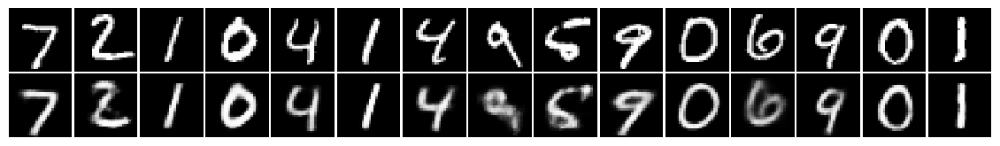

epoch 35 | iter 16120 | loss 18.97885 | KL loss 4.66920 | recon loss 14.30966 
epoch 35 | iter 16140 | loss 18.69097 | KL loss 4.63430 | recon loss 14.05666 
epoch 35 | iter 16160 | loss 18.43512 | KL loss 4.52567 | recon loss 13.90946 
epoch 35 | iter 16180 | loss 18.55333 | KL loss 4.64515 | recon loss 13.90818 
epoch 35 | iter 16200 | loss 18.90169 | KL loss 4.60191 | recon loss 14.29978 


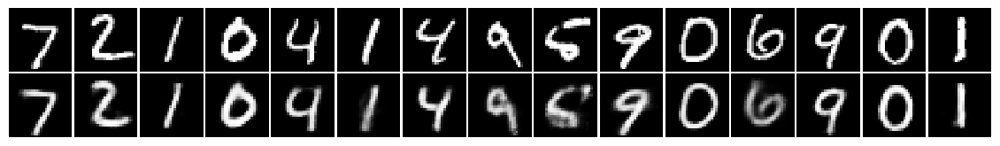

epoch 35 | iter 16220 | loss 18.61414 | KL loss 4.59677 | recon loss 14.01737 
epoch 35 | iter 16240 | loss 18.65122 | KL loss 4.53868 | recon loss 14.11254 
epoch 35 | iter 16260 | loss 18.76924 | KL loss 4.66769 | recon loss 14.10155 
epoch 35 | iter 16280 | loss 18.63743 | KL loss 4.62856 | recon loss 14.00887 
epoch 35 | iter 16300 | loss 18.74728 | KL loss 4.58884 | recon loss 14.15844 


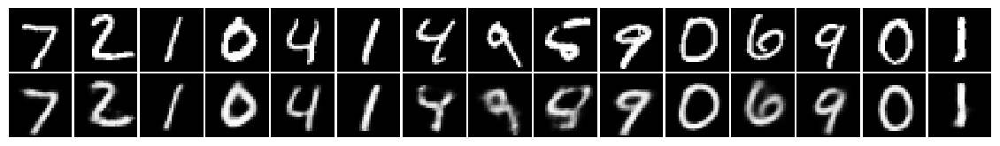

epoch 35 | iter 16320 | loss 18.43778 | KL loss 4.55463 | recon loss 13.88315 
epoch 35 | iter 16340 | loss 18.51183 | KL loss 4.55592 | recon loss 13.95591 
epoch 35 | iter 16360 | loss 18.55483 | KL loss 4.60748 | recon loss 13.94735 
epoch 35 | iter 16380 | loss 18.93343 | KL loss 4.62765 | recon loss 14.30578 
epoch 35 | iter 16400 | loss 18.58662 | KL loss 4.58827 | recon loss 13.99835 


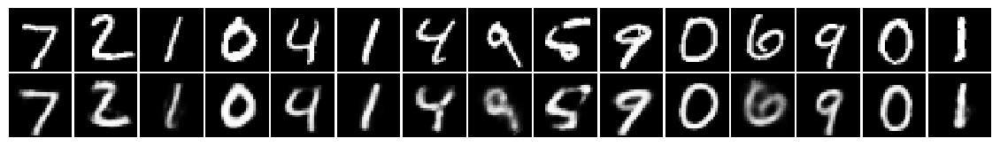

epoch 36 | iter 16420 | loss 18.94776 | KL loss 4.64714 | recon loss 14.30062 
epoch 36 | iter 16440 | loss 18.63938 | KL loss 4.57130 | recon loss 14.06808 
epoch 36 | iter 16460 | loss 18.57544 | KL loss 4.59127 | recon loss 13.98417 
epoch 36 | iter 16480 | loss 18.83629 | KL loss 4.63781 | recon loss 14.19848 
epoch 36 | iter 16500 | loss 18.51311 | KL loss 4.58510 | recon loss 13.92802 


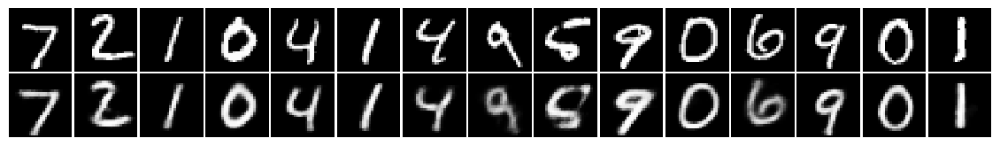

epoch 36 | iter 16520 | loss 18.50696 | KL loss 4.59363 | recon loss 13.91334 
epoch 36 | iter 16540 | loss 18.59855 | KL loss 4.64169 | recon loss 13.95686 
epoch 36 | iter 16560 | loss 18.62323 | KL loss 4.60730 | recon loss 14.01593 
epoch 36 | iter 16580 | loss 18.70516 | KL loss 4.57612 | recon loss 14.12904 
epoch 36 | iter 16600 | loss 18.44587 | KL loss 4.60343 | recon loss 13.84244 


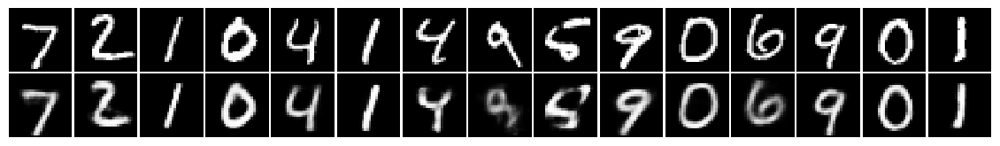

epoch 36 | iter 16620 | loss 18.60690 | KL loss 4.56853 | recon loss 14.03837 
epoch 36 | iter 16640 | loss 18.46639 | KL loss 4.59017 | recon loss 13.87621 
epoch 36 | iter 16660 | loss 18.71578 | KL loss 4.64095 | recon loss 14.07483 
epoch 36 | iter 16680 | loss 18.73274 | KL loss 4.65197 | recon loss 14.08077 
epoch 36 | iter 16700 | loss 18.85877 | KL loss 4.58637 | recon loss 14.27239 


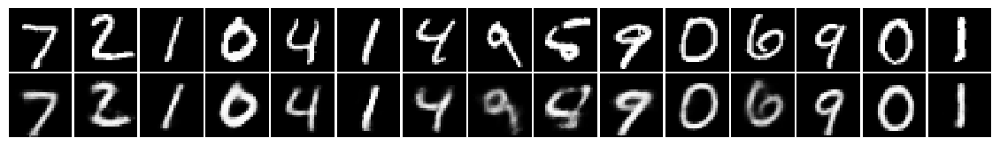

epoch 36 | iter 16720 | loss 18.58444 | KL loss 4.58190 | recon loss 14.00254 
epoch 36 | iter 16740 | loss 18.65660 | KL loss 4.64296 | recon loss 14.01364 
epoch 36 | iter 16760 | loss 18.70006 | KL loss 4.61378 | recon loss 14.08627 
epoch 36 | iter 16780 | loss 18.54869 | KL loss 4.59634 | recon loss 13.95235 
epoch 36 | iter 16800 | loss 18.49398 | KL loss 4.62633 | recon loss 13.86765 


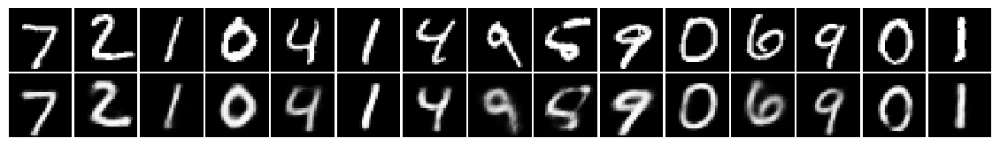

epoch 36 | iter 16820 | loss 18.72770 | KL loss 4.57128 | recon loss 14.15642 
epoch 36 | iter 16840 | loss 18.58136 | KL loss 4.61597 | recon loss 13.96538 
epoch 36 | iter 16860 | loss 18.88862 | KL loss 4.68354 | recon loss 14.20508 
epoch 36 | iter 16880 | loss 18.54802 | KL loss 4.58758 | recon loss 13.96044 
epoch 37 | iter 16900 | loss 18.50732 | KL loss 4.56517 | recon loss 13.94215 


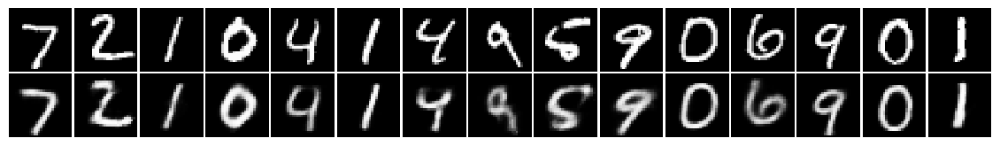

epoch 37 | iter 16920 | loss 18.65913 | KL loss 4.66529 | recon loss 13.99384 
epoch 37 | iter 16940 | loss 18.40025 | KL loss 4.64822 | recon loss 13.75203 
epoch 37 | iter 16960 | loss 18.65108 | KL loss 4.60696 | recon loss 14.04412 
epoch 37 | iter 16980 | loss 18.65238 | KL loss 4.56990 | recon loss 14.08248 
epoch 37 | iter 17000 | loss 18.80819 | KL loss 4.62425 | recon loss 14.18394 


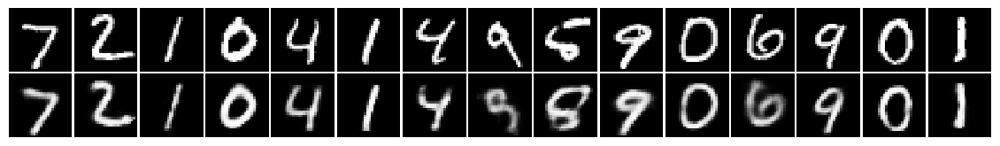

epoch 37 | iter 17020 | loss 18.56227 | KL loss 4.61930 | recon loss 13.94297 
epoch 37 | iter 17040 | loss 18.69498 | KL loss 4.64541 | recon loss 14.04957 
epoch 37 | iter 17060 | loss 18.57949 | KL loss 4.64727 | recon loss 13.93222 
epoch 37 | iter 17080 | loss 18.83777 | KL loss 4.60223 | recon loss 14.23554 
epoch 37 | iter 17100 | loss 18.33762 | KL loss 4.59556 | recon loss 13.74207 


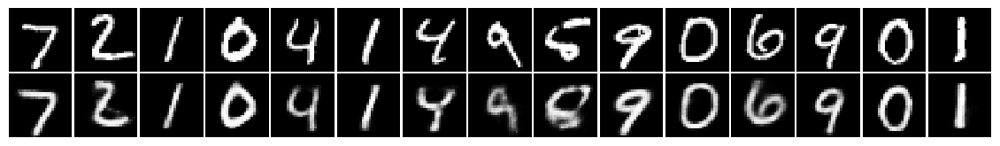

epoch 37 | iter 17120 | loss 18.44431 | KL loss 4.61591 | recon loss 13.82840 
epoch 37 | iter 17140 | loss 18.43965 | KL loss 4.60261 | recon loss 13.83704 
epoch 37 | iter 17160 | loss 18.75925 | KL loss 4.62520 | recon loss 14.13405 
epoch 37 | iter 17180 | loss 18.43087 | KL loss 4.58882 | recon loss 13.84205 
epoch 37 | iter 17200 | loss 18.55913 | KL loss 4.62540 | recon loss 13.93372 


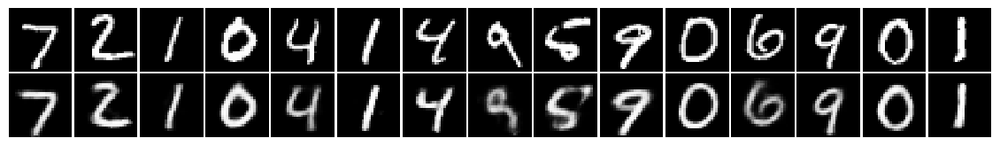

epoch 37 | iter 17220 | loss 18.68956 | KL loss 4.60876 | recon loss 14.08081 
epoch 37 | iter 17240 | loss 18.65979 | KL loss 4.64454 | recon loss 14.01525 
epoch 37 | iter 17260 | loss 18.82839 | KL loss 4.68378 | recon loss 14.14461 
epoch 37 | iter 17280 | loss 18.58008 | KL loss 4.57543 | recon loss 14.00465 
epoch 37 | iter 17300 | loss 18.57565 | KL loss 4.53146 | recon loss 14.04419 


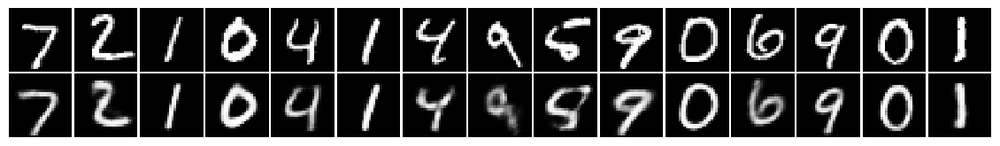

epoch 37 | iter 17320 | loss 18.57939 | KL loss 4.59323 | recon loss 13.98617 
epoch 37 | iter 17340 | loss 18.62101 | KL loss 4.61561 | recon loss 14.00540 
epoch 38 | iter 17360 | loss 18.72342 | KL loss 4.60817 | recon loss 14.11525 
epoch 38 | iter 17380 | loss 18.52547 | KL loss 4.62018 | recon loss 13.90528 
epoch 38 | iter 17400 | loss 18.49374 | KL loss 4.60263 | recon loss 13.89111 


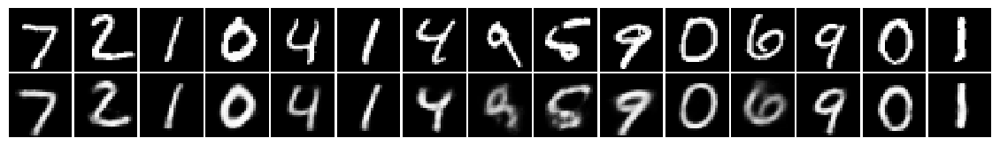

epoch 38 | iter 17420 | loss 18.38931 | KL loss 4.58798 | recon loss 13.80133 
epoch 38 | iter 17440 | loss 18.59998 | KL loss 4.66458 | recon loss 13.93540 
epoch 38 | iter 17460 | loss 18.56293 | KL loss 4.60916 | recon loss 13.95377 
epoch 38 | iter 17480 | loss 18.39615 | KL loss 4.60371 | recon loss 13.79243 
epoch 38 | iter 17500 | loss 18.48869 | KL loss 4.63148 | recon loss 13.85721 


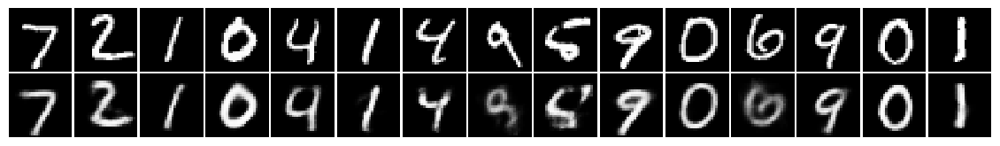

epoch 38 | iter 17520 | loss 18.64081 | KL loss 4.62658 | recon loss 14.01423 
epoch 38 | iter 17540 | loss 18.49811 | KL loss 4.60689 | recon loss 13.89122 
epoch 38 | iter 17560 | loss 18.44748 | KL loss 4.59243 | recon loss 13.85506 
epoch 38 | iter 17580 | loss 18.46879 | KL loss 4.67097 | recon loss 13.79782 
epoch 38 | iter 17600 | loss 18.66631 | KL loss 4.58415 | recon loss 14.08216 


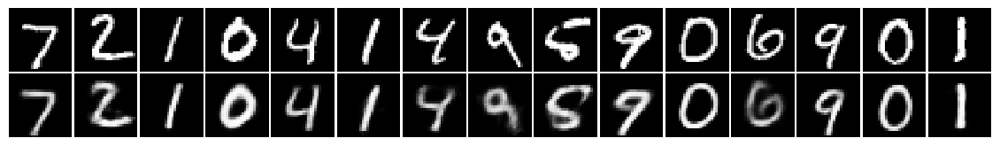

epoch 38 | iter 17620 | loss 18.54386 | KL loss 4.66364 | recon loss 13.88023 
epoch 38 | iter 17640 | loss 18.83304 | KL loss 4.65497 | recon loss 14.17807 
epoch 38 | iter 17660 | loss 18.56465 | KL loss 4.62897 | recon loss 13.93568 
epoch 38 | iter 17680 | loss 18.71904 | KL loss 4.62603 | recon loss 14.09301 
epoch 38 | iter 17700 | loss 18.70066 | KL loss 4.57583 | recon loss 14.12483 


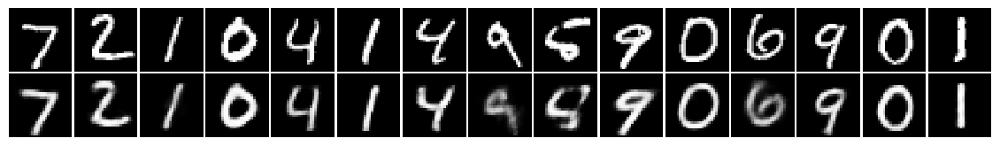

epoch 38 | iter 17720 | loss 18.68225 | KL loss 4.61787 | recon loss 14.06437 
epoch 38 | iter 17740 | loss 18.75142 | KL loss 4.62764 | recon loss 14.12378 
epoch 38 | iter 17760 | loss 18.57772 | KL loss 4.60515 | recon loss 13.97257 
epoch 38 | iter 17780 | loss 18.60776 | KL loss 4.60049 | recon loss 14.00727 
epoch 38 | iter 17800 | loss 18.71875 | KL loss 4.69982 | recon loss 14.01893 


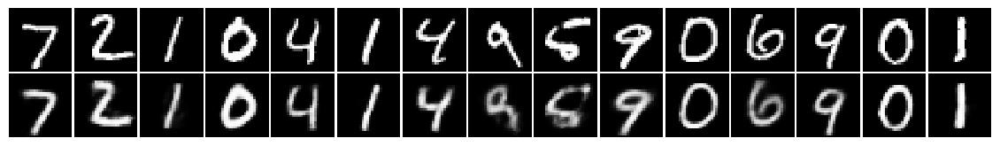

epoch 38 | iter 17820 | loss 18.58543 | KL loss 4.61263 | recon loss 13.97280 
epoch 39 | iter 17840 | loss 18.58988 | KL loss 4.64813 | recon loss 13.94175 
epoch 39 | iter 17860 | loss 18.27598 | KL loss 4.64866 | recon loss 13.62733 
epoch 39 | iter 17880 | loss 18.40669 | KL loss 4.56857 | recon loss 13.83811 
epoch 39 | iter 17900 | loss 18.32993 | KL loss 4.64318 | recon loss 13.68675 


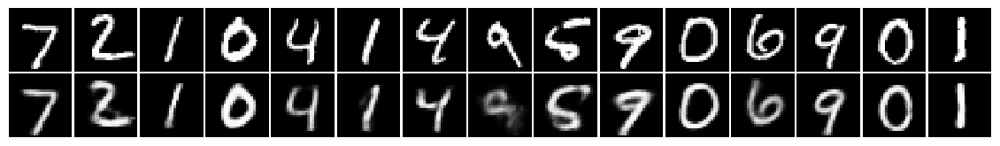

epoch 39 | iter 17920 | loss 18.77394 | KL loss 4.66146 | recon loss 14.11248 
epoch 39 | iter 17940 | loss 18.63375 | KL loss 4.62312 | recon loss 14.01063 
epoch 39 | iter 17960 | loss 18.54114 | KL loss 4.62591 | recon loss 13.91523 
epoch 39 | iter 17980 | loss 18.44437 | KL loss 4.59005 | recon loss 13.85432 
epoch 39 | iter 18000 | loss 18.83355 | KL loss 4.61423 | recon loss 14.21932 


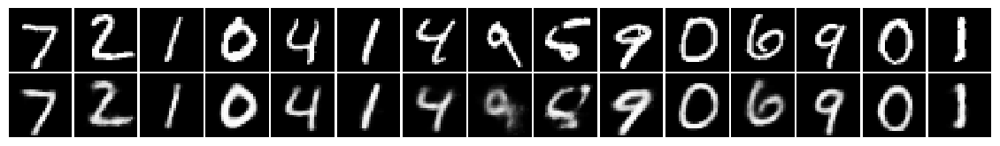

epoch 39 | iter 18020 | loss 18.54447 | KL loss 4.67342 | recon loss 13.87105 
epoch 39 | iter 18040 | loss 18.22433 | KL loss 4.59672 | recon loss 13.62761 
epoch 39 | iter 18060 | loss 18.62589 | KL loss 4.63698 | recon loss 13.98891 
epoch 39 | iter 18080 | loss 18.58575 | KL loss 4.63526 | recon loss 13.95049 
epoch 39 | iter 18100 | loss 18.61898 | KL loss 4.64348 | recon loss 13.97550 


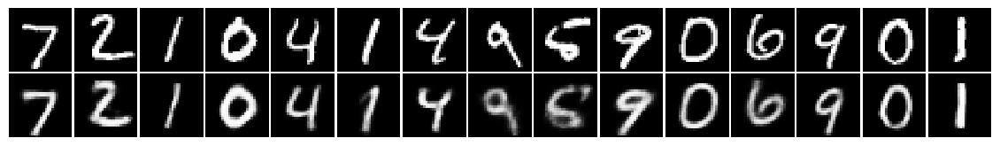

epoch 39 | iter 18120 | loss 18.52974 | KL loss 4.58806 | recon loss 13.94167 
epoch 39 | iter 18140 | loss 18.65531 | KL loss 4.68534 | recon loss 13.96997 
epoch 39 | iter 18160 | loss 18.92182 | KL loss 4.64660 | recon loss 14.27522 
epoch 39 | iter 18180 | loss 18.62222 | KL loss 4.66105 | recon loss 13.96117 
epoch 39 | iter 18200 | loss 18.43959 | KL loss 4.56422 | recon loss 13.87537 


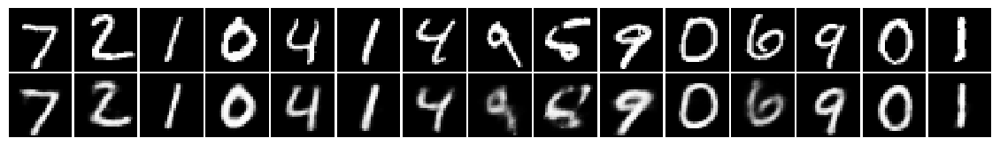

epoch 39 | iter 18220 | loss 18.58121 | KL loss 4.59096 | recon loss 13.99025 
epoch 39 | iter 18240 | loss 18.61732 | KL loss 4.62975 | recon loss 13.98757 
epoch 39 | iter 18260 | loss 18.57709 | KL loss 4.61474 | recon loss 13.96235 
epoch 39 | iter 18280 | loss 18.75476 | KL loss 4.61890 | recon loss 14.13586 
epoch 40 | iter 18300 | loss 18.45919 | KL loss 4.66255 | recon loss 13.79664 


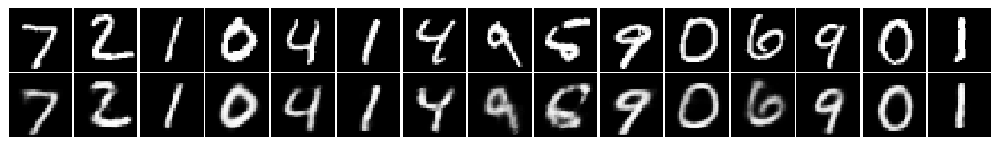

epoch 40 | iter 18320 | loss 18.44237 | KL loss 4.59876 | recon loss 13.84360 
epoch 40 | iter 18340 | loss 18.61677 | KL loss 4.68647 | recon loss 13.93030 
epoch 40 | iter 18360 | loss 18.50520 | KL loss 4.66013 | recon loss 13.84507 
epoch 40 | iter 18380 | loss 18.53371 | KL loss 4.61052 | recon loss 13.92320 
epoch 40 | iter 18400 | loss 18.54905 | KL loss 4.64537 | recon loss 13.90367 


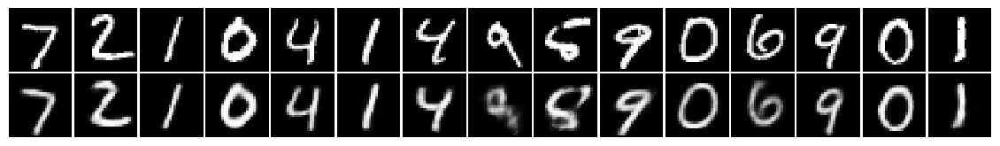

epoch 40 | iter 18420 | loss 18.35177 | KL loss 4.56058 | recon loss 13.79119 
epoch 40 | iter 18440 | loss 18.58578 | KL loss 4.55016 | recon loss 14.03561 
epoch 40 | iter 18460 | loss 18.82361 | KL loss 4.63499 | recon loss 14.18862 
epoch 40 | iter 18480 | loss 18.65330 | KL loss 4.63251 | recon loss 14.02079 
epoch 40 | iter 18500 | loss 18.35143 | KL loss 4.57590 | recon loss 13.77552 


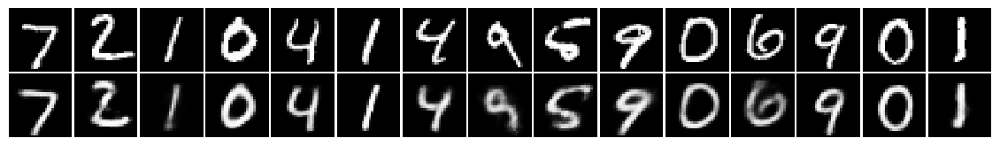

epoch 40 | iter 18520 | loss 18.62632 | KL loss 4.66030 | recon loss 13.96602 
epoch 40 | iter 18540 | loss 18.79187 | KL loss 4.65562 | recon loss 14.13625 
epoch 40 | iter 18560 | loss 18.54738 | KL loss 4.61364 | recon loss 13.93374 
epoch 40 | iter 18580 | loss 18.45587 | KL loss 4.65929 | recon loss 13.79657 
epoch 40 | iter 18600 | loss 18.58781 | KL loss 4.64310 | recon loss 13.94471 


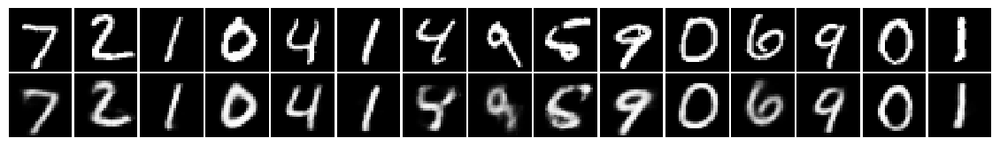

epoch 40 | iter 18620 | loss 18.79704 | KL loss 4.61464 | recon loss 14.18241 
epoch 40 | iter 18640 | loss 18.34968 | KL loss 4.57751 | recon loss 13.77217 
epoch 40 | iter 18660 | loss 18.59445 | KL loss 4.67197 | recon loss 13.92248 
epoch 40 | iter 18680 | loss 18.53326 | KL loss 4.62420 | recon loss 13.90906 
epoch 40 | iter 18700 | loss 18.24337 | KL loss 4.57241 | recon loss 13.67096 


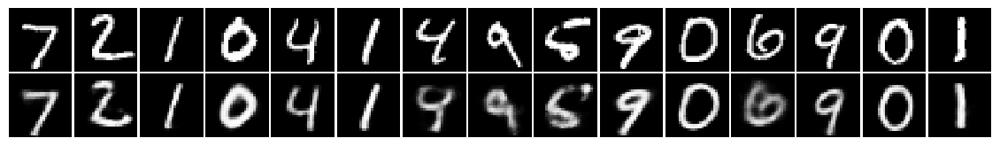

epoch 40 | iter 18720 | loss 18.38067 | KL loss 4.62347 | recon loss 13.75719 
epoch 40 | iter 18740 | loss 18.39243 | KL loss 4.59560 | recon loss 13.79682 
epoch 40 | iter 18760 | loss 18.40712 | KL loss 4.62097 | recon loss 13.78615 
epoch 41 | iter 18780 | loss 18.42213 | KL loss 4.64497 | recon loss 13.77716 
epoch 41 | iter 18800 | loss 18.14568 | KL loss 4.63124 | recon loss 13.51445 


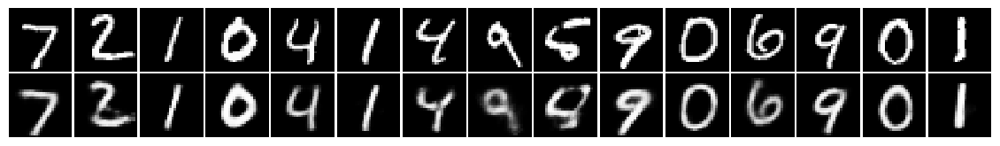

epoch 41 | iter 18820 | loss 18.24123 | KL loss 4.64840 | recon loss 13.59283 
epoch 41 | iter 18840 | loss 18.63516 | KL loss 4.62134 | recon loss 14.01382 
epoch 41 | iter 18860 | loss 18.60731 | KL loss 4.63251 | recon loss 13.97480 
epoch 41 | iter 18880 | loss 18.56932 | KL loss 4.61698 | recon loss 13.95233 
epoch 41 | iter 18900 | loss 18.58424 | KL loss 4.58410 | recon loss 14.00014 


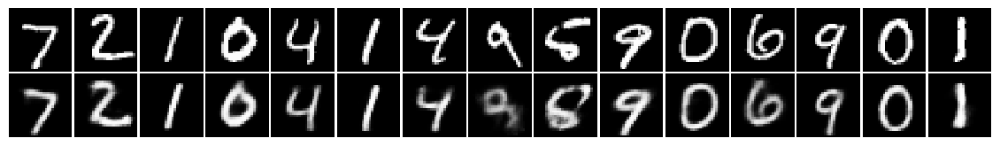

epoch 41 | iter 18920 | loss 18.19230 | KL loss 4.54325 | recon loss 13.64905 
epoch 41 | iter 18940 | loss 18.43918 | KL loss 4.62152 | recon loss 13.81767 
epoch 41 | iter 18960 | loss 18.51458 | KL loss 4.58513 | recon loss 13.92945 
epoch 41 | iter 18980 | loss 18.57375 | KL loss 4.64867 | recon loss 13.92509 
epoch 41 | iter 19000 | loss 18.50682 | KL loss 4.62308 | recon loss 13.88374 


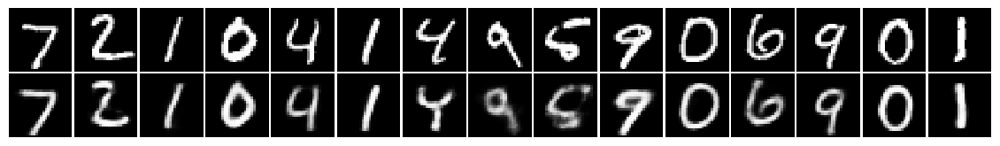

epoch 41 | iter 19020 | loss 18.48798 | KL loss 4.57637 | recon loss 13.91161 
epoch 41 | iter 19040 | loss 18.66064 | KL loss 4.65659 | recon loss 14.00406 
epoch 41 | iter 19060 | loss 18.44489 | KL loss 4.63459 | recon loss 13.81030 
epoch 41 | iter 19080 | loss 18.51808 | KL loss 4.62295 | recon loss 13.89513 
epoch 41 | iter 19100 | loss 18.69385 | KL loss 4.61057 | recon loss 14.08327 


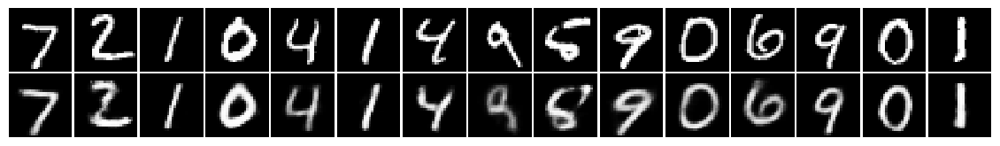

epoch 41 | iter 19120 | loss 18.61650 | KL loss 4.63543 | recon loss 13.98108 
epoch 41 | iter 19140 | loss 18.63999 | KL loss 4.64460 | recon loss 13.99539 
epoch 41 | iter 19160 | loss 18.59669 | KL loss 4.60916 | recon loss 13.98753 
epoch 41 | iter 19180 | loss 18.23030 | KL loss 4.61069 | recon loss 13.61961 
epoch 41 | iter 19200 | loss 18.41155 | KL loss 4.57236 | recon loss 13.83919 


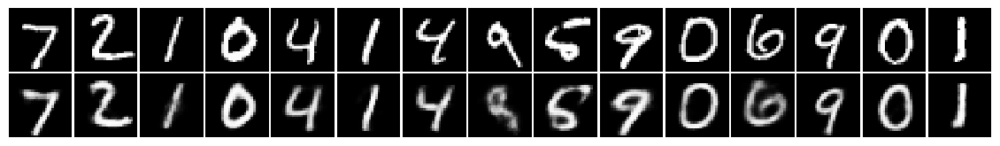

epoch 41 | iter 19220 | loss 18.62716 | KL loss 4.62072 | recon loss 14.00644 
epoch 42 | iter 19240 | loss 18.48227 | KL loss 4.62395 | recon loss 13.85832 
epoch 42 | iter 19260 | loss 18.42621 | KL loss 4.66117 | recon loss 13.76504 
epoch 42 | iter 19280 | loss 18.36190 | KL loss 4.61917 | recon loss 13.74273 
epoch 42 | iter 19300 | loss 18.45947 | KL loss 4.58212 | recon loss 13.87735 


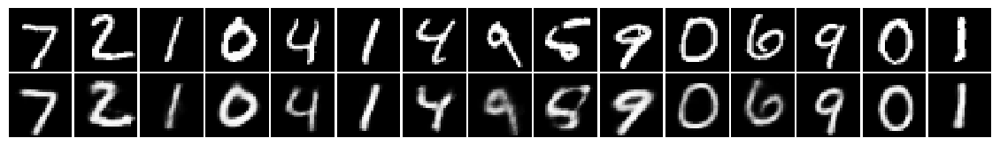

epoch 42 | iter 19320 | loss 18.54108 | KL loss 4.69128 | recon loss 13.84981 
epoch 42 | iter 19340 | loss 18.29019 | KL loss 4.60602 | recon loss 13.68417 
epoch 42 | iter 19360 | loss 18.59233 | KL loss 4.66704 | recon loss 13.92529 
epoch 42 | iter 19380 | loss 18.37825 | KL loss 4.70186 | recon loss 13.67638 
epoch 42 | iter 19400 | loss 18.49181 | KL loss 4.62052 | recon loss 13.87129 


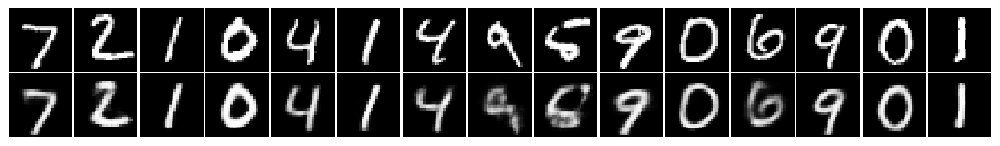

epoch 42 | iter 19420 | loss 18.43040 | KL loss 4.67492 | recon loss 13.75548 
epoch 42 | iter 19440 | loss 18.75096 | KL loss 4.61344 | recon loss 14.13752 
epoch 42 | iter 19460 | loss 18.47671 | KL loss 4.60384 | recon loss 13.87286 
epoch 42 | iter 19480 | loss 18.38153 | KL loss 4.59937 | recon loss 13.78216 
epoch 42 | iter 19500 | loss 18.49371 | KL loss 4.62023 | recon loss 13.87349 


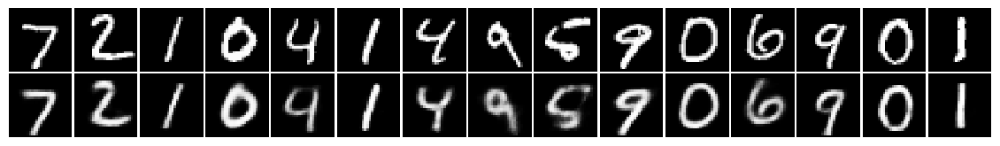

epoch 42 | iter 19520 | loss 18.49223 | KL loss 4.61954 | recon loss 13.87269 
epoch 42 | iter 19540 | loss 18.56359 | KL loss 4.66197 | recon loss 13.90162 
epoch 42 | iter 19560 | loss 18.54342 | KL loss 4.65600 | recon loss 13.88743 
epoch 42 | iter 19580 | loss 18.54099 | KL loss 4.65879 | recon loss 13.88220 
epoch 42 | iter 19600 | loss 18.59731 | KL loss 4.64744 | recon loss 13.94988 


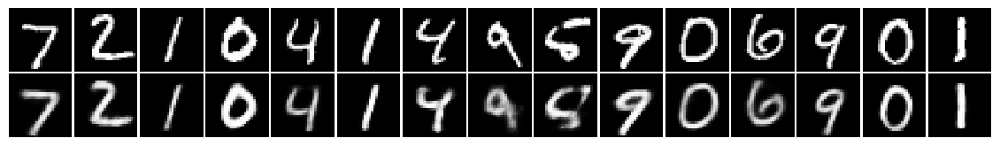

epoch 42 | iter 19620 | loss 18.36242 | KL loss 4.59141 | recon loss 13.77101 
epoch 42 | iter 19640 | loss 18.69107 | KL loss 4.65903 | recon loss 14.03204 
epoch 42 | iter 19660 | loss 18.45608 | KL loss 4.68264 | recon loss 13.77344 
epoch 42 | iter 19680 | loss 18.34584 | KL loss 4.62390 | recon loss 13.72195 
epoch 43 | iter 19700 | loss 18.45208 | KL loss 4.64659 | recon loss 13.80549 


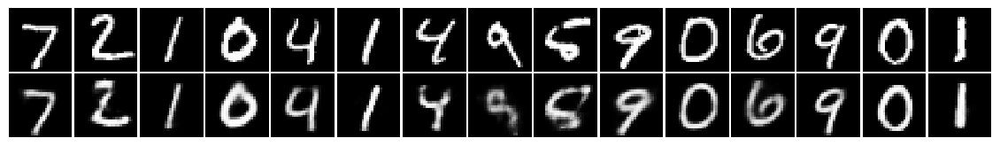

epoch 43 | iter 19720 | loss 18.53453 | KL loss 4.64257 | recon loss 13.89196 
epoch 43 | iter 19740 | loss 18.47074 | KL loss 4.66915 | recon loss 13.80159 
epoch 43 | iter 19760 | loss 18.38539 | KL loss 4.64991 | recon loss 13.73548 
epoch 43 | iter 19780 | loss 18.30954 | KL loss 4.64279 | recon loss 13.66674 
epoch 43 | iter 19800 | loss 18.35693 | KL loss 4.60407 | recon loss 13.75287 


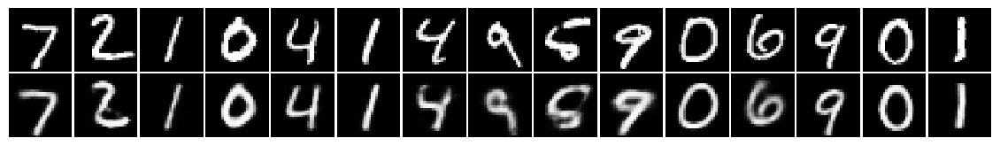

epoch 43 | iter 19820 | loss 18.47855 | KL loss 4.63526 | recon loss 13.84330 
epoch 43 | iter 19840 | loss 18.63185 | KL loss 4.67067 | recon loss 13.96117 
epoch 43 | iter 19860 | loss 18.30622 | KL loss 4.56300 | recon loss 13.74322 
epoch 43 | iter 19880 | loss 18.54123 | KL loss 4.66374 | recon loss 13.87749 
epoch 43 | iter 19900 | loss 18.32676 | KL loss 4.64850 | recon loss 13.67826 


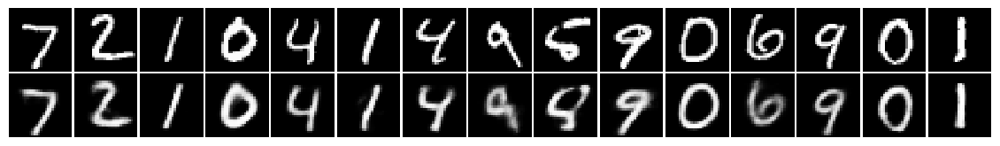

epoch 43 | iter 19920 | loss 18.59425 | KL loss 4.63589 | recon loss 13.95836 
epoch 43 | iter 19940 | loss 18.53056 | KL loss 4.66846 | recon loss 13.86210 
epoch 43 | iter 19960 | loss 18.42588 | KL loss 4.64728 | recon loss 13.77860 
epoch 43 | iter 19980 | loss 18.40992 | KL loss 4.66038 | recon loss 13.74954 
epoch 43 | iter 20000 | loss 18.52937 | KL loss 4.63072 | recon loss 13.89865 


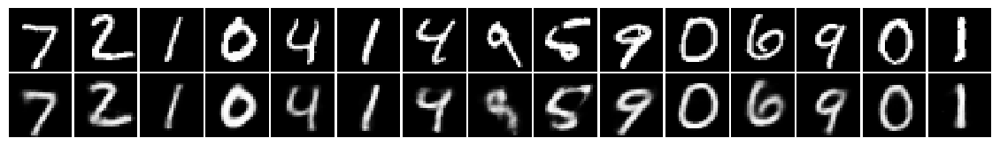

epoch 43 | iter 20020 | loss 18.41039 | KL loss 4.61046 | recon loss 13.79994 
epoch 43 | iter 20040 | loss 18.66927 | KL loss 4.63476 | recon loss 14.03451 
epoch 43 | iter 20060 | loss 18.49439 | KL loss 4.64290 | recon loss 13.85149 
epoch 43 | iter 20080 | loss 18.35372 | KL loss 4.60843 | recon loss 13.74528 
epoch 43 | iter 20100 | loss 18.40499 | KL loss 4.64658 | recon loss 13.75841 


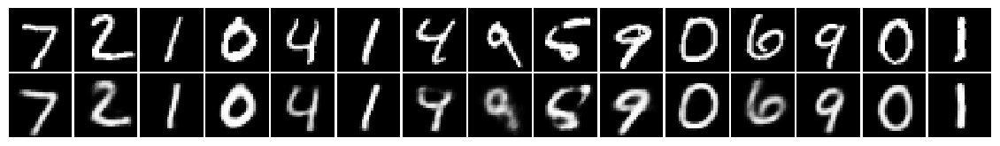

epoch 43 | iter 20120 | loss 18.33639 | KL loss 4.65957 | recon loss 13.67682 
epoch 43 | iter 20140 | loss 18.30276 | KL loss 4.67247 | recon loss 13.63029 
epoch 43 | iter 20160 | loss 18.51879 | KL loss 4.62428 | recon loss 13.89452 
epoch 44 | iter 20180 | loss 18.44881 | KL loss 4.62515 | recon loss 13.82365 
epoch 44 | iter 20200 | loss 18.38732 | KL loss 4.60568 | recon loss 13.78164 


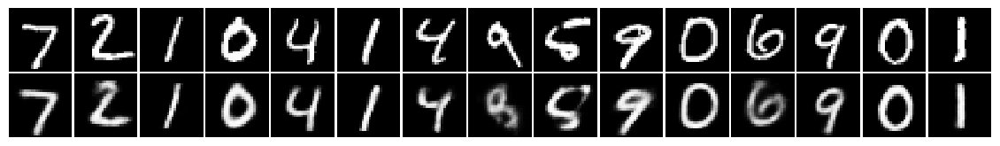

epoch 44 | iter 20220 | loss 18.57324 | KL loss 4.63806 | recon loss 13.93519 
epoch 44 | iter 20240 | loss 18.29913 | KL loss 4.67420 | recon loss 13.62494 
epoch 44 | iter 20260 | loss 18.05917 | KL loss 4.60939 | recon loss 13.44978 
epoch 44 | iter 20280 | loss 18.66825 | KL loss 4.68381 | recon loss 13.98444 
epoch 44 | iter 20300 | loss 18.29671 | KL loss 4.63116 | recon loss 13.66556 


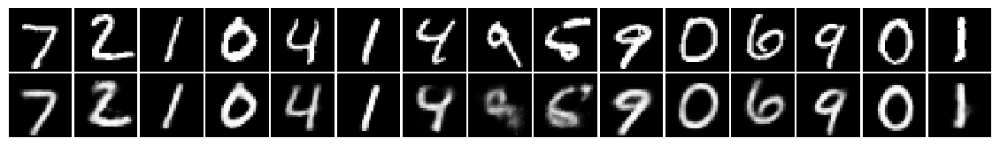

epoch 44 | iter 20320 | loss 18.20628 | KL loss 4.61712 | recon loss 13.58916 
epoch 44 | iter 20340 | loss 18.69630 | KL loss 4.62784 | recon loss 14.06846 
epoch 44 | iter 20360 | loss 18.62014 | KL loss 4.69696 | recon loss 13.92319 
epoch 44 | iter 20380 | loss 18.43981 | KL loss 4.67322 | recon loss 13.76659 
epoch 44 | iter 20400 | loss 18.23508 | KL loss 4.57365 | recon loss 13.66142 


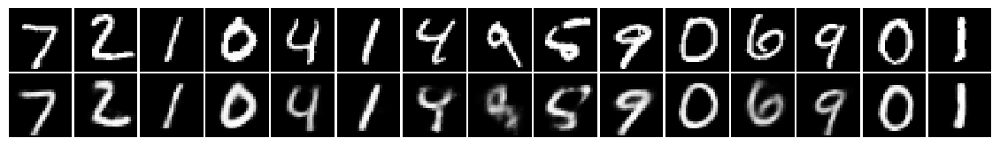

epoch 44 | iter 20420 | loss 18.52785 | KL loss 4.66144 | recon loss 13.86640 
epoch 44 | iter 20440 | loss 18.53760 | KL loss 4.67971 | recon loss 13.85789 
epoch 44 | iter 20460 | loss 18.84230 | KL loss 4.72045 | recon loss 14.12185 
epoch 44 | iter 20480 | loss 18.39406 | KL loss 4.62415 | recon loss 13.76991 
epoch 44 | iter 20500 | loss 18.44016 | KL loss 4.64089 | recon loss 13.79927 


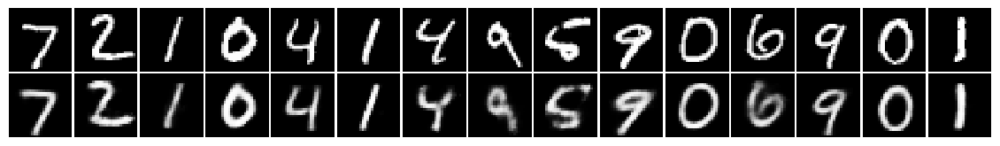

epoch 44 | iter 20520 | loss 18.35913 | KL loss 4.59658 | recon loss 13.76255 
epoch 44 | iter 20540 | loss 18.67083 | KL loss 4.67605 | recon loss 13.99478 
epoch 44 | iter 20560 | loss 18.37945 | KL loss 4.63153 | recon loss 13.74792 
epoch 44 | iter 20580 | loss 18.59846 | KL loss 4.62516 | recon loss 13.97330 
epoch 44 | iter 20600 | loss 18.24655 | KL loss 4.63186 | recon loss 13.61469 


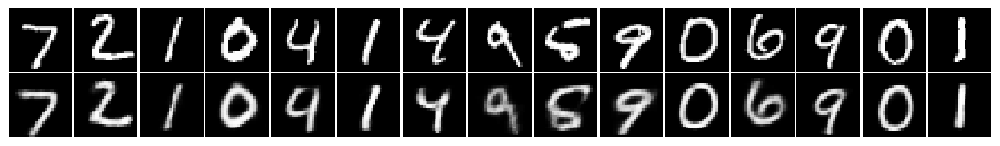

epoch 44 | iter 20620 | loss 18.44633 | KL loss 4.65433 | recon loss 13.79200 
epoch 45 | iter 20640 | loss 18.43179 | KL loss 4.68221 | recon loss 13.74958 
epoch 45 | iter 20660 | loss 18.41672 | KL loss 4.63831 | recon loss 13.77841 
epoch 45 | iter 20680 | loss 18.31450 | KL loss 4.65646 | recon loss 13.65803 
epoch 45 | iter 20700 | loss 18.39224 | KL loss 4.65349 | recon loss 13.73876 


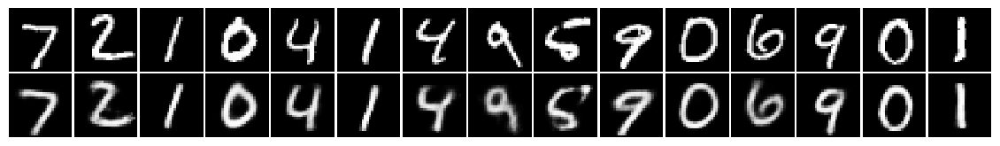

epoch 45 | iter 20720 | loss 18.24784 | KL loss 4.63854 | recon loss 13.60930 
epoch 45 | iter 20740 | loss 18.57526 | KL loss 4.66897 | recon loss 13.90628 
epoch 45 | iter 20760 | loss 18.54297 | KL loss 4.69048 | recon loss 13.85248 
epoch 45 | iter 20780 | loss 18.42497 | KL loss 4.60958 | recon loss 13.81538 
epoch 45 | iter 20800 | loss 18.33754 | KL loss 4.68391 | recon loss 13.65363 


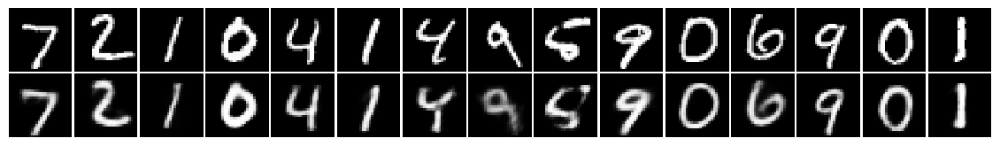

epoch 45 | iter 20820 | loss 18.46657 | KL loss 4.63370 | recon loss 13.83287 
epoch 45 | iter 20840 | loss 18.28520 | KL loss 4.68870 | recon loss 13.59650 
epoch 45 | iter 20860 | loss 18.29597 | KL loss 4.57692 | recon loss 13.71905 
epoch 45 | iter 20880 | loss 18.59107 | KL loss 4.67771 | recon loss 13.91336 
epoch 45 | iter 20900 | loss 18.28458 | KL loss 4.64960 | recon loss 13.63498 


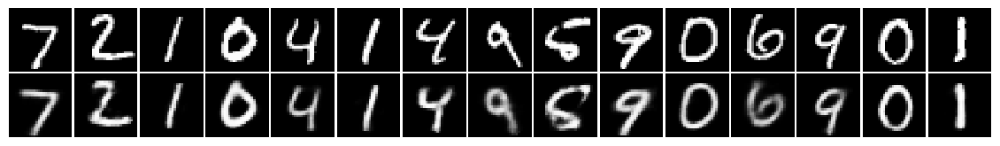

epoch 45 | iter 20920 | loss 18.32559 | KL loss 4.62246 | recon loss 13.70313 
epoch 45 | iter 20940 | loss 18.45031 | KL loss 4.61014 | recon loss 13.84017 
epoch 45 | iter 20960 | loss 18.55265 | KL loss 4.66006 | recon loss 13.89259 
epoch 45 | iter 20980 | loss 18.52215 | KL loss 4.68839 | recon loss 13.83377 
epoch 45 | iter 21000 | loss 18.46058 | KL loss 4.68749 | recon loss 13.77309 


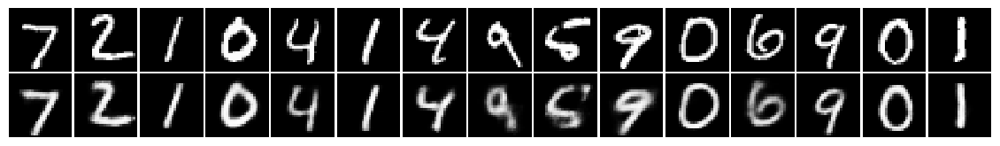

epoch 45 | iter 21020 | loss 18.46105 | KL loss 4.63720 | recon loss 13.82385 
epoch 45 | iter 21040 | loss 18.44055 | KL loss 4.65223 | recon loss 13.78832 
epoch 45 | iter 21060 | loss 18.45952 | KL loss 4.69798 | recon loss 13.76154 
epoch 45 | iter 21080 | loss 18.40635 | KL loss 4.67560 | recon loss 13.73075 
epoch 45 | iter 21100 | loss 18.53398 | KL loss 4.67549 | recon loss 13.85850 


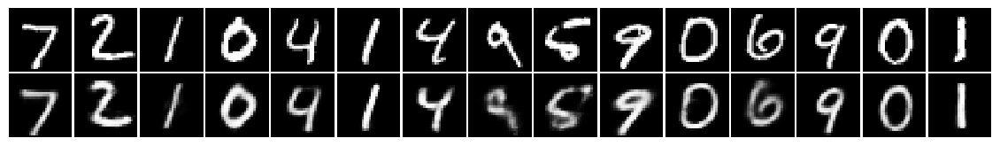

epoch 46 | iter 21120 | loss 18.28984 | KL loss 4.64369 | recon loss 13.64615 
epoch 46 | iter 21140 | loss 18.42153 | KL loss 4.68267 | recon loss 13.73886 
epoch 46 | iter 21160 | loss 18.28176 | KL loss 4.66942 | recon loss 13.61234 
epoch 46 | iter 21180 | loss 18.49791 | KL loss 4.69744 | recon loss 13.80047 
epoch 46 | iter 21200 | loss 18.41848 | KL loss 4.63993 | recon loss 13.77855 


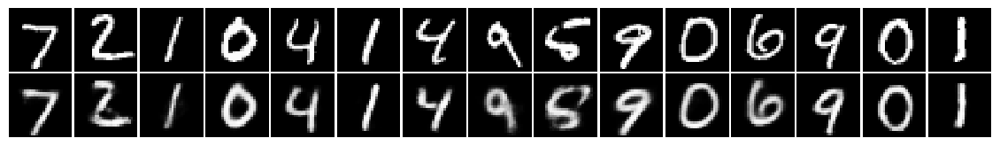

epoch 46 | iter 21220 | loss 18.28925 | KL loss 4.54084 | recon loss 13.74841 
epoch 46 | iter 21240 | loss 18.48516 | KL loss 4.65547 | recon loss 13.82969 
epoch 46 | iter 21260 | loss 18.34772 | KL loss 4.64614 | recon loss 13.70157 
epoch 46 | iter 21280 | loss 18.46368 | KL loss 4.65598 | recon loss 13.80770 
epoch 46 | iter 21300 | loss 18.25114 | KL loss 4.64719 | recon loss 13.60395 


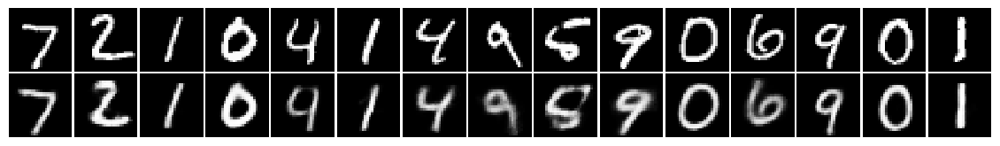

epoch 46 | iter 21320 | loss 18.51846 | KL loss 4.67010 | recon loss 13.84836 
epoch 46 | iter 21340 | loss 18.39356 | KL loss 4.67742 | recon loss 13.71613 
epoch 46 | iter 21360 | loss 18.55259 | KL loss 4.65891 | recon loss 13.89368 
epoch 46 | iter 21380 | loss 18.39430 | KL loss 4.61825 | recon loss 13.77606 
epoch 46 | iter 21400 | loss 18.18913 | KL loss 4.64157 | recon loss 13.54755 


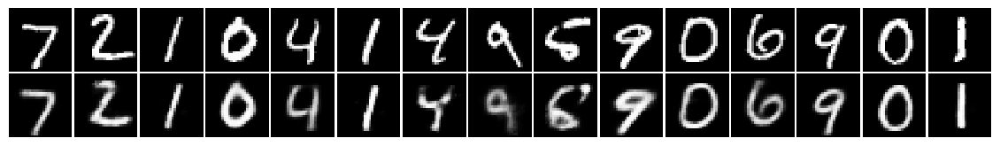

epoch 46 | iter 21420 | loss 18.52763 | KL loss 4.64613 | recon loss 13.88150 
epoch 46 | iter 21440 | loss 18.61145 | KL loss 4.67395 | recon loss 13.93750 
epoch 46 | iter 21460 | loss 18.17174 | KL loss 4.57803 | recon loss 13.59371 
epoch 46 | iter 21480 | loss 18.55742 | KL loss 4.65529 | recon loss 13.90213 
epoch 46 | iter 21500 | loss 18.42060 | KL loss 4.65541 | recon loss 13.76519 


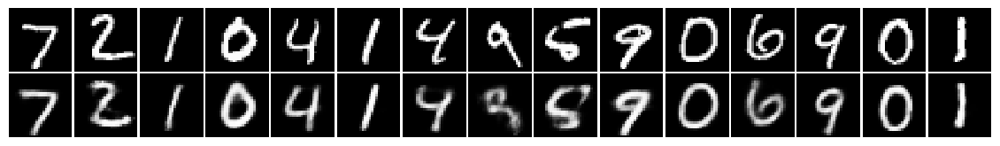

epoch 46 | iter 21520 | loss 18.36618 | KL loss 4.63624 | recon loss 13.72994 
epoch 46 | iter 21540 | loss 18.23213 | KL loss 4.66038 | recon loss 13.57174 
epoch 46 | iter 21560 | loss 18.37373 | KL loss 4.69816 | recon loss 13.67557 
epoch 47 | iter 21580 | loss 18.51863 | KL loss 4.56497 | recon loss 13.95365 
epoch 47 | iter 21600 | loss 18.48817 | KL loss 4.70986 | recon loss 13.77831 


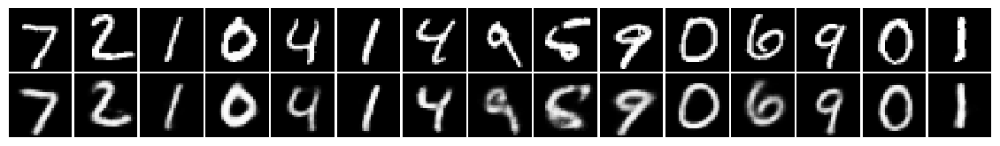

epoch 47 | iter 21620 | loss 18.58470 | KL loss 4.72591 | recon loss 13.85879 
epoch 47 | iter 21640 | loss 18.76769 | KL loss 4.67563 | recon loss 14.09206 
epoch 47 | iter 21660 | loss 18.24801 | KL loss 4.66915 | recon loss 13.57886 
epoch 47 | iter 21680 | loss 18.64343 | KL loss 4.67206 | recon loss 13.97137 
epoch 47 | iter 21700 | loss 18.15613 | KL loss 4.59700 | recon loss 13.55912 


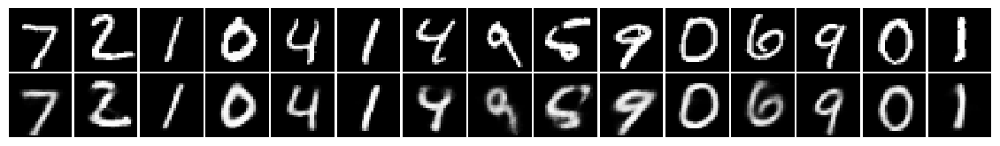

epoch 47 | iter 21720 | loss 18.44356 | KL loss 4.67341 | recon loss 13.77016 
epoch 47 | iter 21740 | loss 18.48637 | KL loss 4.71482 | recon loss 13.77154 
epoch 47 | iter 21760 | loss 18.45509 | KL loss 4.69800 | recon loss 13.75710 
epoch 47 | iter 21780 | loss 18.28659 | KL loss 4.64156 | recon loss 13.64503 
epoch 47 | iter 21800 | loss 18.41827 | KL loss 4.70069 | recon loss 13.71758 


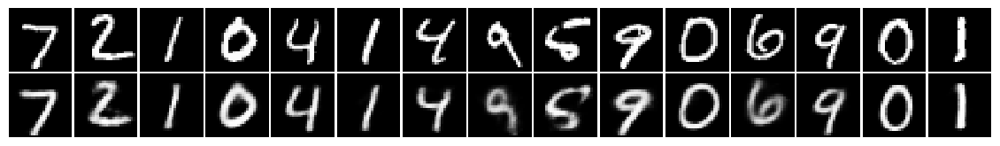

epoch 47 | iter 21820 | loss 18.11750 | KL loss 4.65262 | recon loss 13.46489 
epoch 47 | iter 21840 | loss 18.27008 | KL loss 4.62352 | recon loss 13.64656 
epoch 47 | iter 21860 | loss 18.52809 | KL loss 4.61352 | recon loss 13.91457 
epoch 47 | iter 21880 | loss 18.43080 | KL loss 4.64791 | recon loss 13.78290 
epoch 47 | iter 21900 | loss 18.47292 | KL loss 4.63457 | recon loss 13.83836 


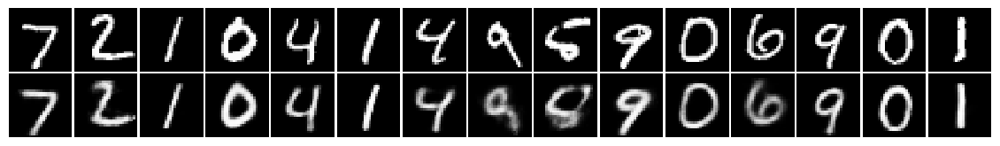

epoch 47 | iter 21920 | loss 18.31108 | KL loss 4.60925 | recon loss 13.70182 
epoch 47 | iter 21940 | loss 18.35502 | KL loss 4.68773 | recon loss 13.66730 
epoch 47 | iter 21960 | loss 18.32299 | KL loss 4.60517 | recon loss 13.71782 
epoch 47 | iter 21980 | loss 18.32056 | KL loss 4.61785 | recon loss 13.70272 
epoch 47 | iter 22000 | loss 18.22345 | KL loss 4.64561 | recon loss 13.57784 


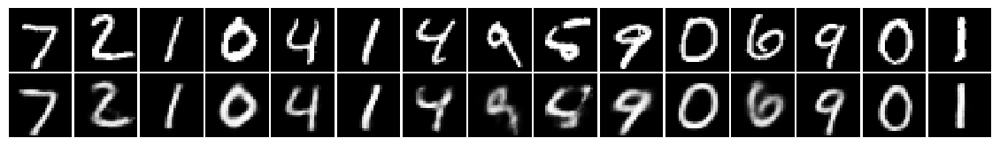

epoch 47 | iter 22020 | loss 18.45383 | KL loss 4.73573 | recon loss 13.71810 
epoch 47 | iter 22040 | loss 18.26642 | KL loss 4.60036 | recon loss 13.66606 
epoch 48 | iter 22060 | loss 18.34748 | KL loss 4.68519 | recon loss 13.66228 
epoch 48 | iter 22080 | loss 18.49326 | KL loss 4.65823 | recon loss 13.83502 
epoch 48 | iter 22100 | loss 18.28787 | KL loss 4.63649 | recon loss 13.65138 


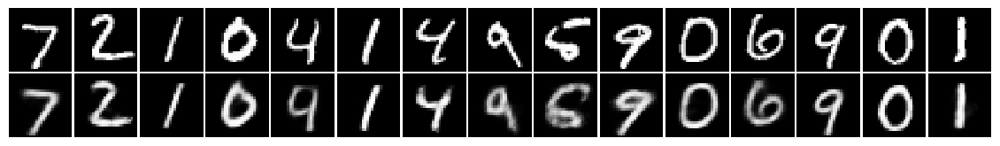

epoch 48 | iter 22120 | loss 18.31459 | KL loss 4.67002 | recon loss 13.64456 
epoch 48 | iter 22140 | loss 18.14370 | KL loss 4.59793 | recon loss 13.54578 
epoch 48 | iter 22160 | loss 18.13916 | KL loss 4.65826 | recon loss 13.48089 
epoch 48 | iter 22180 | loss 18.55986 | KL loss 4.72143 | recon loss 13.83843 
epoch 48 | iter 22200 | loss 18.51668 | KL loss 4.72348 | recon loss 13.79320 


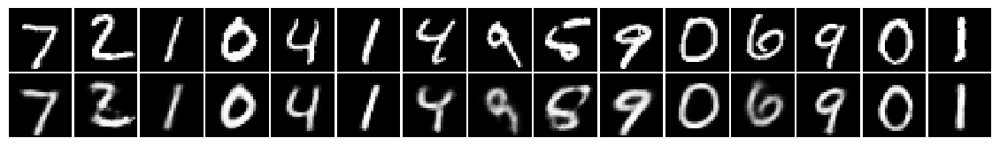

epoch 48 | iter 22220 | loss 18.32806 | KL loss 4.68410 | recon loss 13.64396 
epoch 48 | iter 22240 | loss 18.24108 | KL loss 4.66273 | recon loss 13.57835 
epoch 48 | iter 22260 | loss 18.35548 | KL loss 4.63306 | recon loss 13.72242 
epoch 48 | iter 22280 | loss 18.59860 | KL loss 4.67368 | recon loss 13.92492 
epoch 48 | iter 22300 | loss 18.23944 | KL loss 4.66331 | recon loss 13.57614 


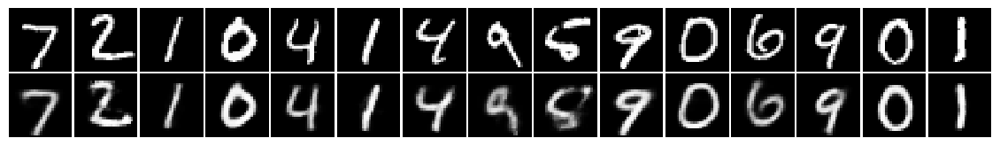

epoch 48 | iter 22320 | loss 18.37865 | KL loss 4.61442 | recon loss 13.76423 
epoch 48 | iter 22340 | loss 18.42391 | KL loss 4.66221 | recon loss 13.76171 
epoch 48 | iter 22360 | loss 18.34437 | KL loss 4.63992 | recon loss 13.70445 
epoch 48 | iter 22380 | loss 18.26277 | KL loss 4.63088 | recon loss 13.63189 
epoch 48 | iter 22400 | loss 18.28801 | KL loss 4.67925 | recon loss 13.60876 


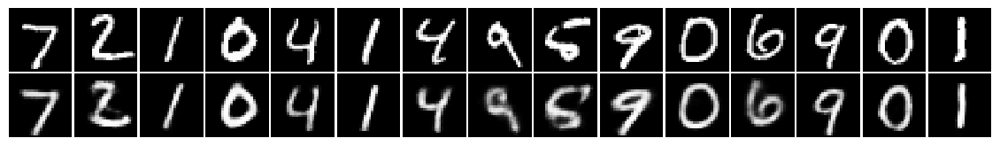

epoch 48 | iter 22420 | loss 18.29933 | KL loss 4.62402 | recon loss 13.67531 
epoch 48 | iter 22440 | loss 18.36985 | KL loss 4.64060 | recon loss 13.72925 
epoch 48 | iter 22460 | loss 18.27760 | KL loss 4.66218 | recon loss 13.61542 
epoch 48 | iter 22480 | loss 18.29166 | KL loss 4.66601 | recon loss 13.62565 
epoch 48 | iter 22500 | loss 18.53238 | KL loss 4.60582 | recon loss 13.92656 


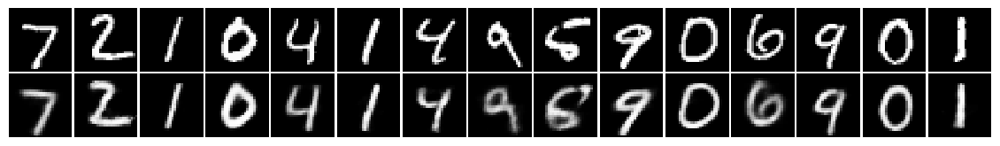

epoch 49 | iter 22520 | loss 18.47663 | KL loss 4.63015 | recon loss 13.84648 
epoch 49 | iter 22540 | loss 18.26890 | KL loss 4.71161 | recon loss 13.55728 
epoch 49 | iter 22560 | loss 18.21981 | KL loss 4.68635 | recon loss 13.53346 
epoch 49 | iter 22580 | loss 18.28842 | KL loss 4.63296 | recon loss 13.65545 
epoch 49 | iter 22600 | loss 18.32973 | KL loss 4.65804 | recon loss 13.67169 


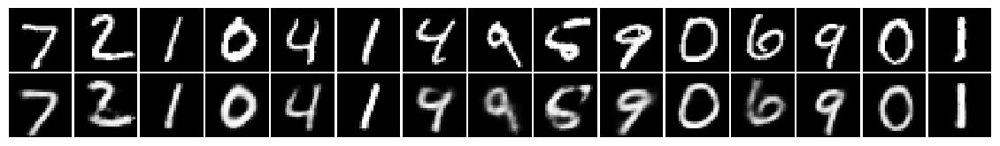

epoch 49 | iter 22620 | loss 18.41041 | KL loss 4.64863 | recon loss 13.76178 
epoch 49 | iter 22640 | loss 18.47434 | KL loss 4.68937 | recon loss 13.78497 
epoch 49 | iter 22660 | loss 18.24384 | KL loss 4.62355 | recon loss 13.62029 
epoch 49 | iter 22680 | loss 18.49678 | KL loss 4.68478 | recon loss 13.81200 
epoch 49 | iter 22700 | loss 18.41804 | KL loss 4.67738 | recon loss 13.74066 


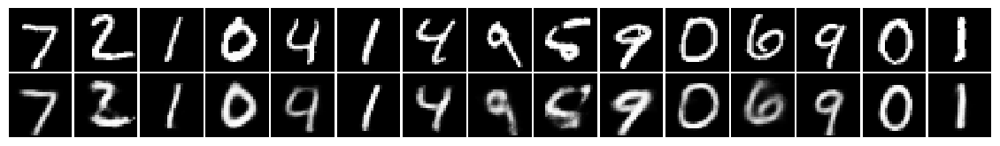

epoch 49 | iter 22720 | loss 18.44255 | KL loss 4.61309 | recon loss 13.82946 
epoch 49 | iter 22740 | loss 18.56792 | KL loss 4.65396 | recon loss 13.91396 
epoch 49 | iter 22760 | loss 18.26829 | KL loss 4.67395 | recon loss 13.59434 
epoch 49 | iter 22780 | loss 18.22201 | KL loss 4.70044 | recon loss 13.52157 
epoch 49 | iter 22800 | loss 18.15102 | KL loss 4.62135 | recon loss 13.52967 


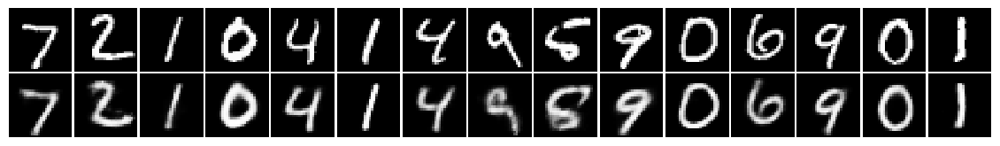

epoch 49 | iter 22820 | loss 18.28881 | KL loss 4.64138 | recon loss 13.64743 
epoch 49 | iter 22840 | loss 18.13644 | KL loss 4.62497 | recon loss 13.51147 
epoch 49 | iter 22860 | loss 18.26275 | KL loss 4.67135 | recon loss 13.59140 
epoch 49 | iter 22880 | loss 18.49584 | KL loss 4.73031 | recon loss 13.76554 
epoch 49 | iter 22900 | loss 18.19290 | KL loss 4.63082 | recon loss 13.56207 


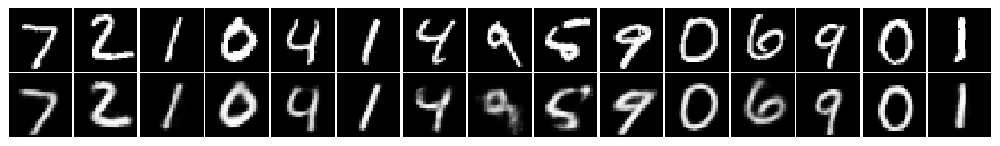

epoch 49 | iter 22920 | loss 18.47848 | KL loss 4.65185 | recon loss 13.82663 
epoch 49 | iter 22940 | loss 18.37873 | KL loss 4.65534 | recon loss 13.72339 
epoch 49 | iter 22960 | loss 18.54751 | KL loss 4.73509 | recon loss 13.81242 
epoch 49 | iter 22980 | loss 18.35147 | KL loss 4.61536 | recon loss 13.73611 
epoch 50 | iter 23000 | loss 18.43062 | KL loss 4.66696 | recon loss 13.76366 


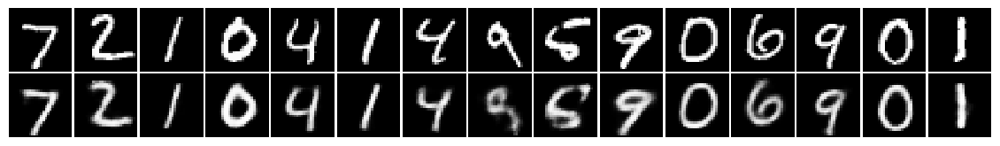

epoch 50 | iter 23020 | loss 18.60208 | KL loss 4.70130 | recon loss 13.90078 
epoch 50 | iter 23040 | loss 18.41440 | KL loss 4.67872 | recon loss 13.73568 
epoch 50 | iter 23060 | loss 18.18976 | KL loss 4.64066 | recon loss 13.54909 
epoch 50 | iter 23080 | loss 18.03326 | KL loss 4.68834 | recon loss 13.34492 
epoch 50 | iter 23100 | loss 18.36816 | KL loss 4.62880 | recon loss 13.73936 


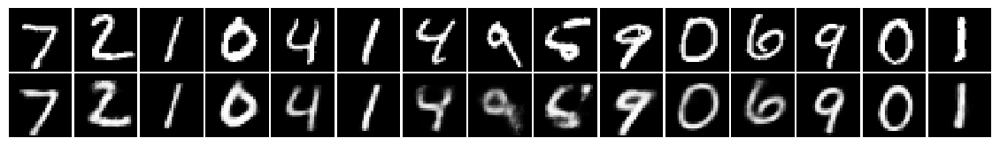

epoch 50 | iter 23120 | loss 18.13407 | KL loss 4.68498 | recon loss 13.44909 
epoch 50 | iter 23140 | loss 18.36792 | KL loss 4.71538 | recon loss 13.65253 
epoch 50 | iter 23160 | loss 18.47303 | KL loss 4.67969 | recon loss 13.79334 
epoch 50 | iter 23180 | loss 18.60681 | KL loss 4.63932 | recon loss 13.96749 
epoch 50 | iter 23200 | loss 18.40307 | KL loss 4.66446 | recon loss 13.73861 


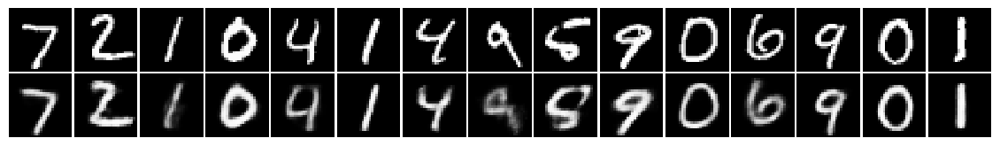

epoch 50 | iter 23220 | loss 18.24800 | KL loss 4.71965 | recon loss 13.52835 
epoch 50 | iter 23240 | loss 18.52419 | KL loss 4.71961 | recon loss 13.80458 
epoch 50 | iter 23260 | loss 18.19545 | KL loss 4.60341 | recon loss 13.59204 
epoch 50 | iter 23280 | loss 18.27648 | KL loss 4.62525 | recon loss 13.65122 
epoch 50 | iter 23300 | loss 18.22862 | KL loss 4.73501 | recon loss 13.49361 


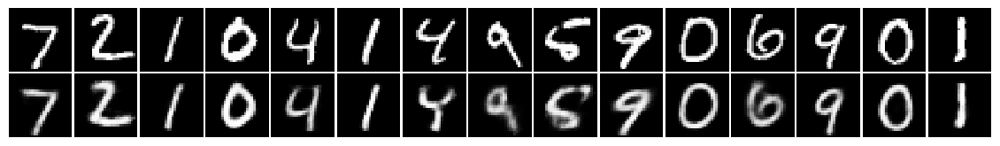

epoch 50 | iter 23320 | loss 18.27112 | KL loss 4.60713 | recon loss 13.66400 
epoch 50 | iter 23340 | loss 18.27499 | KL loss 4.65653 | recon loss 13.61846 
epoch 50 | iter 23360 | loss 18.47343 | KL loss 4.66763 | recon loss 13.80580 
epoch 50 | iter 23380 | loss 18.38018 | KL loss 4.66784 | recon loss 13.71235 
epoch 50 | iter 23400 | loss 18.24232 | KL loss 4.67684 | recon loss 13.56548 


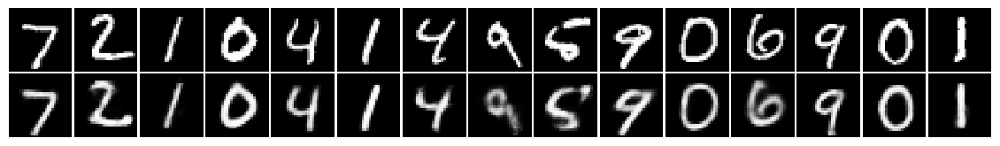

epoch 50 | iter 23420 | loss 17.89752 | KL loss 4.56207 | recon loss 13.33545 
epoch 50 | iter 23440 | loss 18.34239 | KL loss 4.69573 | recon loss 13.64666 


In [441]:
def elbo_loss(inp, tar, mu, logvar, alpha: float = 1, beta: float = 1):
    
    recon_loss = nn.functional.mse_loss(inp, tar, reduction='none').sum(dim=(1, 2, 3))
            
    kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp(), dim=-1)

    loss = torch.mean(alpha * kld_loss + beta * recon_loss)
    
    return loss, torch.mean(recon_loss), torch.mean(kld_loss)

def train_vae(train_dl: DataLoader, 
              valid_dl: DataLoader,
              model: nn.Module,
              n_epochs: int,
              max_iters: int = -1):
    
    LOG_INTERVAL = 20
    SUMMARY_INTERVAL = 100
    
    model = model.cuda()
    
    model.train()
    
    optim = torch.optim.Adam(model.parameters(), lr=1e-3)
    
    acc_recon_loss, acc_kld_loss, acc_loss = 0, 0, 0
    
    i = 1
    for epoch in range(n_epochs):
        for x, y in train_dl:
            
            optim.zero_grad()
            
            x = x.cuda()

            mu, logvar = model.encode(x)
            
            z = model.sample_z(mu, logvar)
        
            x_recon = model.decode(z)
        
            loss, recon_loss, kld_loss = elbo_loss(x_recon, x, mu, logvar, alpha=1, beta=1)

            acc_recon_loss += recon_loss.item()
            acc_kld_loss += kld_loss.item()
            acc_loss += loss.item()
            
            loss.backward()
            
            optim.step()
            
            if (i + 1) % LOG_INTERVAL == 0:
                
                print('epoch %d | iter %d | loss %.5f | KL loss %.5f | recon loss %.5f ' % 
                      (epoch + 1, i + 1, acc_loss / LOG_INTERVAL, acc_kld_loss / LOG_INTERVAL, acc_recon_loss / LOG_INTERVAL))
                
                acc_recon_loss, acc_kld_loss, acc_loss = 0, 0, 0
                
            if (i + 1) % SUMMARY_INTERVAL == 0:
                show_summary(valid_dl, model)
                
            i += 1
            
            if i == max_iters:
                return
        
vae = VariationalAutoEncoder(inp_shape=(1, 28, 28), hidden_dim=512, out_dim=256, z_dim=10)
train_vae(train_dl, valid_dl, vae, 50)

In [442]:
#torch.save(vae.state_dict(), './vae-50-10dim')

## Visualizing Latent Space

In [311]:
# loading trained AutoEncoder with 2D latent space

ae = AutoEncoder(inp_shape=(1, 28, 28), hidden_dim=512, out_dim=2)
ae.load_state_dict(torch.load('./ae-20'))
ae.eval()

AutoEncoder(
  (ae): Sequential(
    (0): Encoder(
      (enc): Sequential(
        (0): Flatten()
        (1): Linear(in_features=784, out_features=512, bias=True)
        (2): ReLU()
        (3): Linear(in_features=512, out_features=2, bias=True)
      )
    )
    (1): Decoder(
      (dec): Sequential(
        (0): Linear(in_features=2, out_features=512, bias=True)
        (1): ReLU()
        (2): Linear(in_features=512, out_features=784, bias=True)
      )
    )
  )
)

In [329]:
ae.cuda()
z, labels = [], []
with torch.no_grad():
    for i, (x, y) in enumerate(valid_dl):
        x = x.cuda()
        mu = ae.ae[0](x)
        z.append(mu.cpu())
        labels.append(y)
z = torch.cat(z, dim=0)
labels = torch.cat(labels, dim=0)

df = pd.DataFrame({'x': z[:,0].numpy(), 
              'y': z[:,1].numpy(),
              'label': labels.numpy()})

df.head()

,x,y,label
0,1.105610,4.956746,7
1,-0.581304,-0.078693,2
2,-6.466478,6.207767,1
3,1.150499,-0.204559,0
4,1.584186,2.257911,4


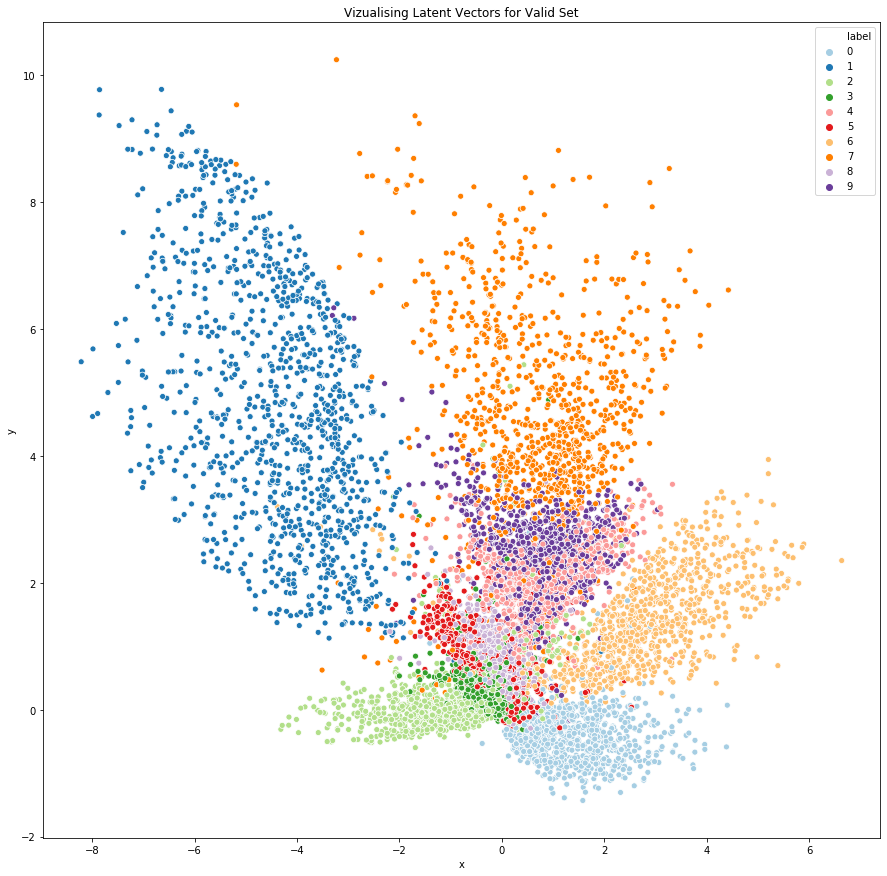

In [330]:
plt.figure(figsize=(15, 15))
sns.scatterplot(x="x", y="y", hue="label", palette=sns.color_palette("Paired", 10), data=df, legend="full")
plt.title('Vizualising Latent Vectors for Valid Set');

In [333]:
# loading trained Variational AutoEncoder with 2D latent space

vae = VariationalAutoEncoder(inp_shape=(1, 28, 28), hidden_dim=512, out_dim=256, z_dim=2)
vae.load_state_dict(torch.load('./vae-60'))
vae.eval()

VariationalAutoEncoder(
  (enc): Encoder(
    (enc): Sequential(
      (0): Flatten()
      (1): Linear(in_features=784, out_features=512, bias=True)
      (2): ReLU()
      (3): Linear(in_features=512, out_features=256, bias=True)
    )
  )
  (dec): Decoder(
    (dec): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): ReLU()
      (2): Linear(in_features=512, out_features=784, bias=True)
    )
  )
  (mu): Linear(in_features=256, out_features=2, bias=True)
  (logvar): Linear(in_features=256, out_features=2, bias=True)
  (fc): Linear(in_features=2, out_features=256, bias=True)
)

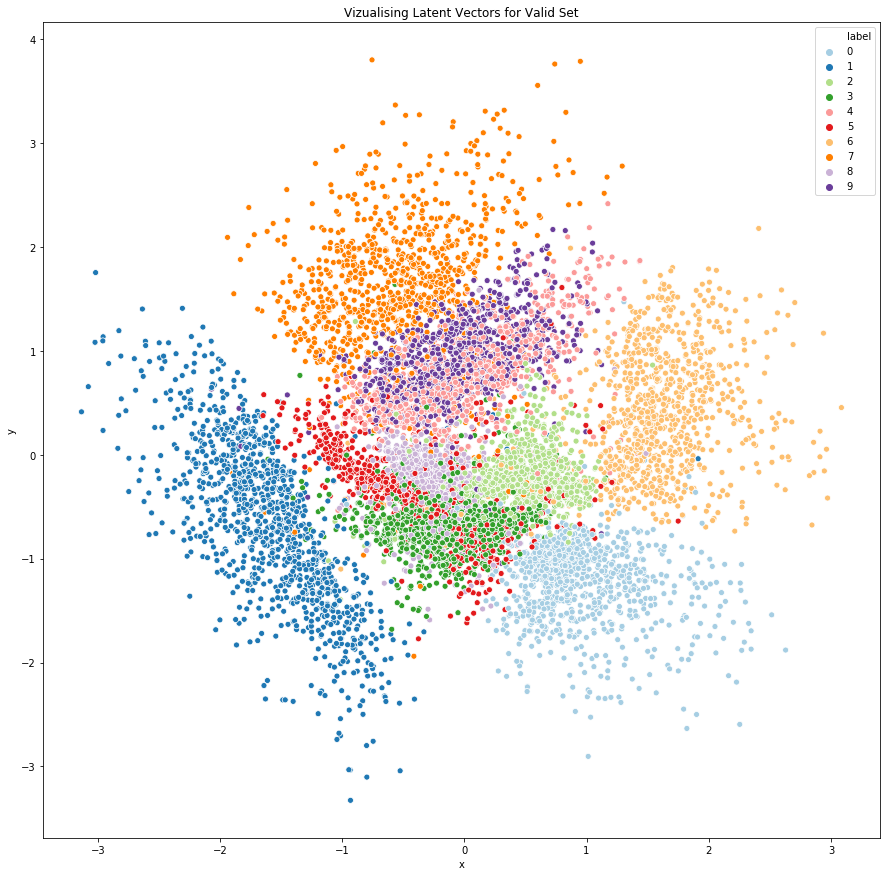

In [338]:
def viz_vae_clusters(vae: nn.Module):

    vae.cuda()
    z, labels = [], []
    with torch.no_grad():
        for i, (x, y) in enumerate(valid_dl):
            x = x.cuda()
            mu, _ = vae.encode(x)
            z.append(mu.cpu())
            labels.append(y)
    z = torch.cat(z, dim=0)
    labels = torch.cat(labels, dim=0)

    df = pd.DataFrame({'x': z[:,0].numpy(), 
                  'y': z[:,1].numpy(),
                  'label': labels.numpy()})

    plt.figure(figsize=(15, 15))
    sns.scatterplot(x="x", y="y", hue="label", palette=sns.color_palette("Paired", 10), data=df, legend="full")
    plt.title('Vizualising Latent Vectors for Valid Set');
    
viz_vae_clusters(vae)

In [339]:
# loading trained Variational AutoEncoder with 2D latent space

vae = VariationalAutoEncoder(inp_shape=(1, 28, 28), hidden_dim=512, out_dim=256, z_dim=2)
vae.load_state_dict(torch.load('./vae-60-kl0'))
vae.eval()

VariationalAutoEncoder(
  (enc): Encoder(
    (enc): Sequential(
      (0): Flatten()
      (1): Linear(in_features=784, out_features=512, bias=True)
      (2): ReLU()
      (3): Linear(in_features=512, out_features=256, bias=True)
    )
  )
  (dec): Decoder(
    (dec): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): ReLU()
      (2): Linear(in_features=512, out_features=784, bias=True)
    )
  )
  (mu): Linear(in_features=256, out_features=2, bias=True)
  (logvar): Linear(in_features=256, out_features=2, bias=True)
  (fc): Linear(in_features=2, out_features=256, bias=True)
)

On the plot below, we can see that removing KL component from the loss, circular shape of the latent space is no longer maintained.

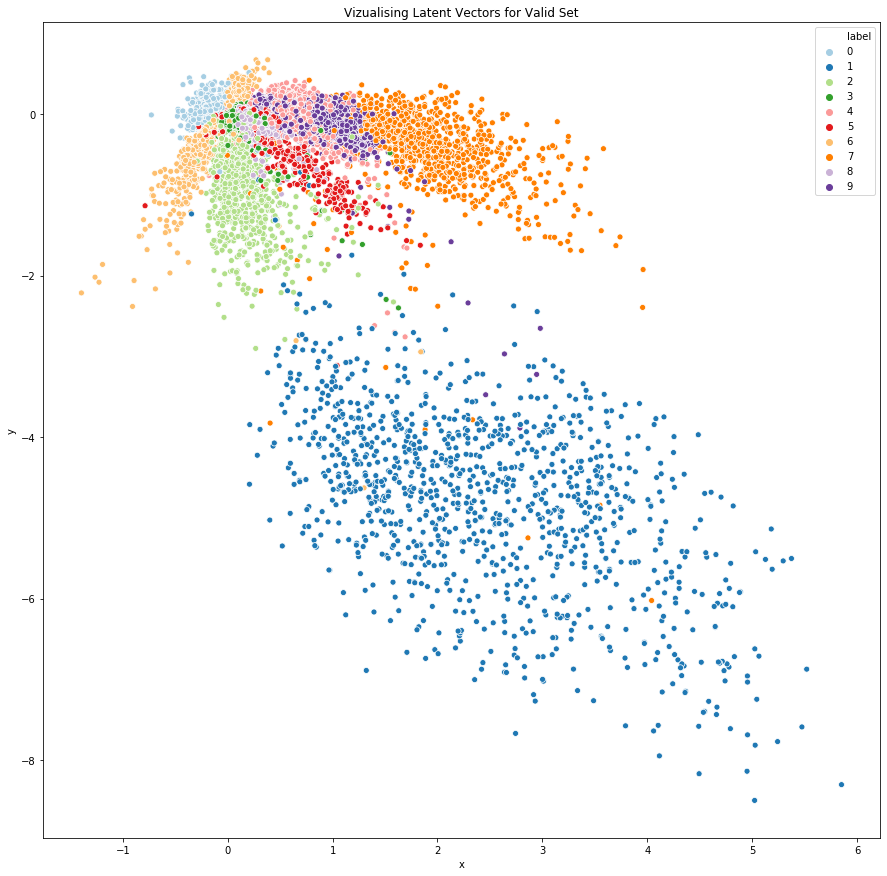

In [340]:
viz_vae_clusters(vae)

Here we show that latent space of VAE is continuous 

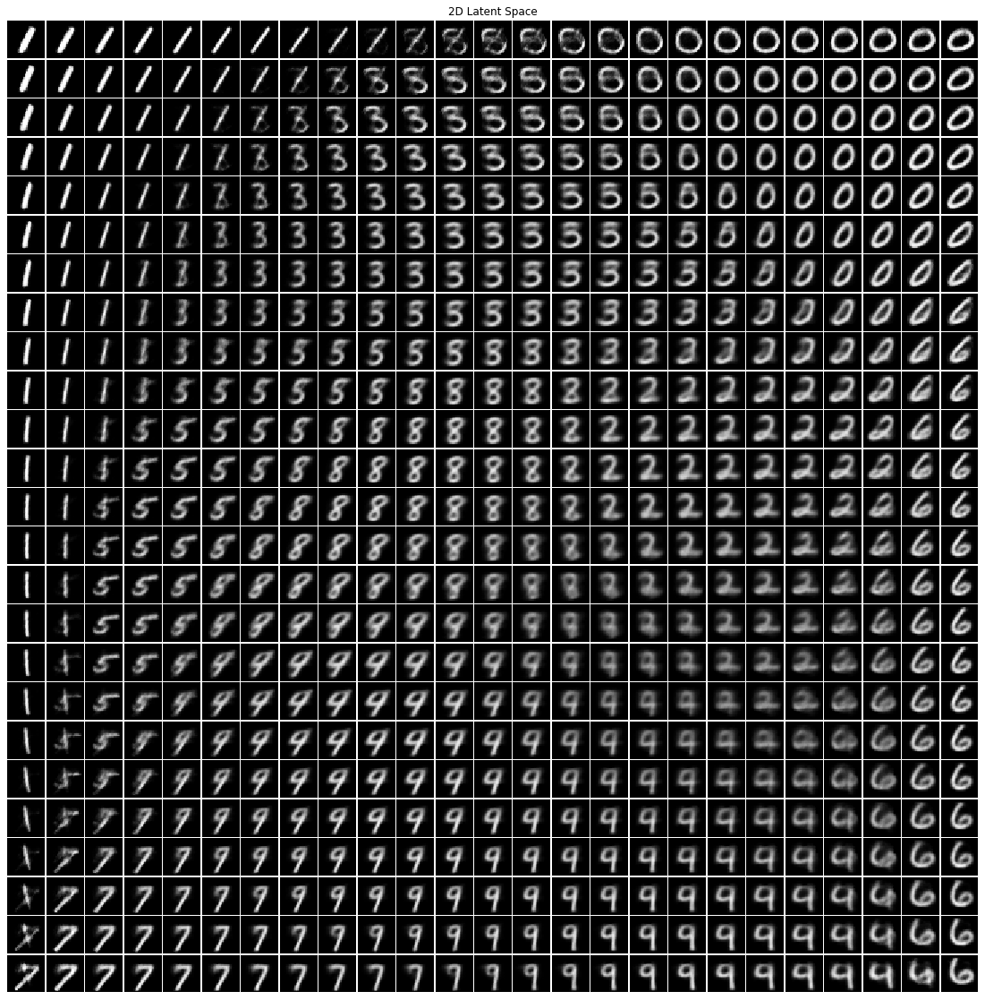

In [406]:
def draw_mnist_manifold_vae(model: nn.Module, size: int = 20):
    """This function takes a trained VAE with z_dim=2 and visualizes its latent space."""

    # generate a 2D point cloud of latent space using inverse CDF of Standard Gaussian.
    x_axes = ndist.ppf(np.linspace(0.05, 0.95, size))
    y_axes = ndist.ppf(np.linspace(0.05, 0.95, size))

    # assembling the latent vector of shape (size^2, 2) to be fed into the decoder.
    z = []
    for i, y in enumerate(x_axes):
        for j, x in enumerate(y_axes):
            z.append(torch.Tensor([x, y]))
    z = torch.stack(z)
    
    # generating predictions
    preds = model.decode(z).detach()
    
    # rendering a single image from predictions.
    grid = make_grid(preds, pad_value=1, padding=1, nrow=size)[0].numpy()
    
    # showing the image.
    plt.figure(figsize=(20, 20))
    plt.imshow(grid, cmap='gray')
    plt.axis('off')
    plt.title('2D Latent Space')
    plt.show()
    
    
vae = VariationalAutoEncoder(inp_shape=(1, 28, 28), hidden_dim=512, out_dim=256, z_dim=2)
vae.load_state_dict(torch.load('./vae-60'))
vae.eval()

draw_mnist_manifold(vae.cpu(), size=25);

Doing same manifold vizualisation for AE gives us worse result, because space isn't continuous. For many locations on the grid, we get non-digits.

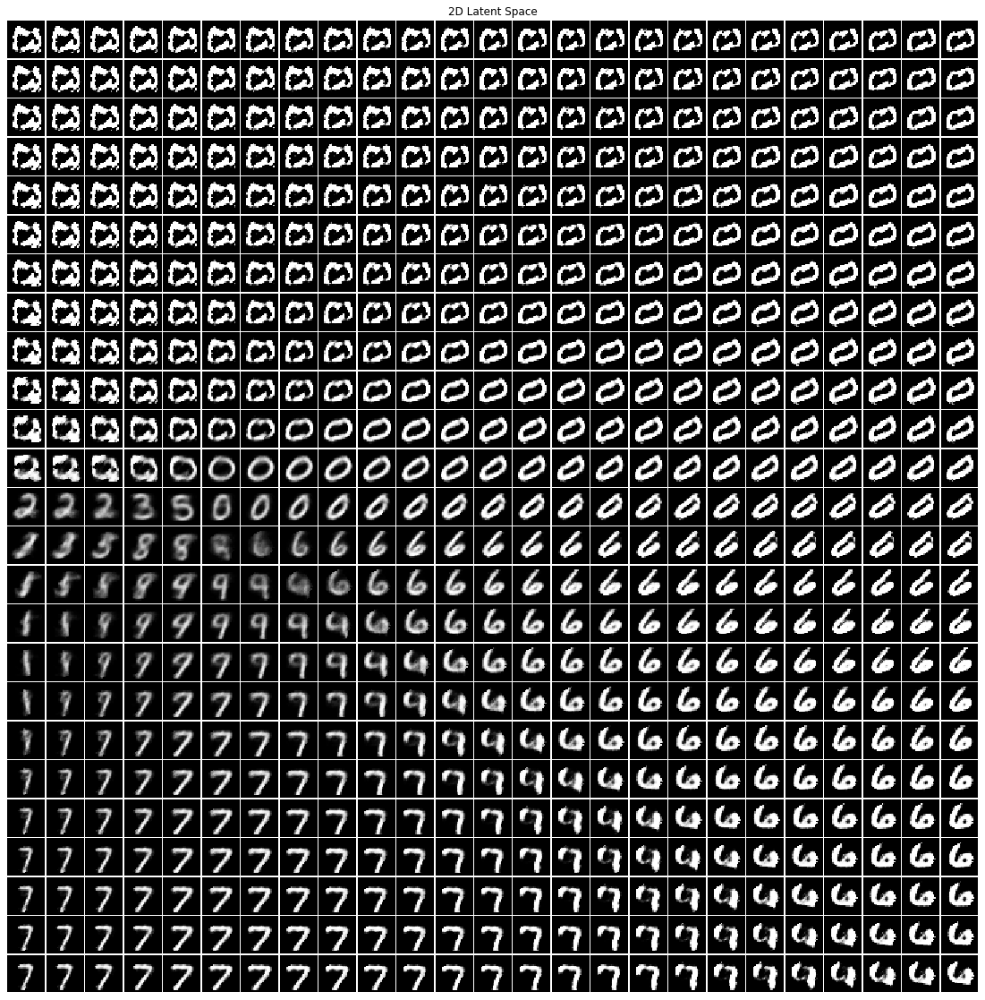

In [345]:
def draw_mnist_manifold_ae(model: nn.Module, size: int = 20):
    """This function takes a trained VAE with z_dim=2 and visualizes its latent space."""

    # generate a 2D point cloud of latent space using inverse CDF of Standard Gaussian.
    x_axes = np.linspace(-10, 10, size)
    y_axes = np.linspace(-2, 11, size)

    # assembling the latent vector of shape (size^2, 2) to be fed into the decoder.
    z = []
    for i, y in enumerate(x_axes):
        for j, x in enumerate(y_axes):
            z.append(torch.Tensor([x, y]))
    z = torch.stack(z)
    
    # generating predictions
    preds = model.ae[1](z).detach()
    
    # rendering a single image from predictions.
    grid = make_grid(preds, pad_value=1, padding=1, nrow=size)[0].numpy()
    
    # showing the image.
    plt.figure(figsize=(20, 20))
    plt.imshow(grid, cmap='gray')
    plt.axis('off')
    plt.title('2D Latent Space')
    plt.show()
    
draw_mnist_manifold_ae(ae.cpu(), 25)

## Sampling from VAE

Once VAE is trained, it's encoder can be removed.

In [367]:
z = torch.empty(100, 2).normal_(0, 1)
z.shape

torch.Size([100, 2])

In [368]:
images = vae.decode(z)

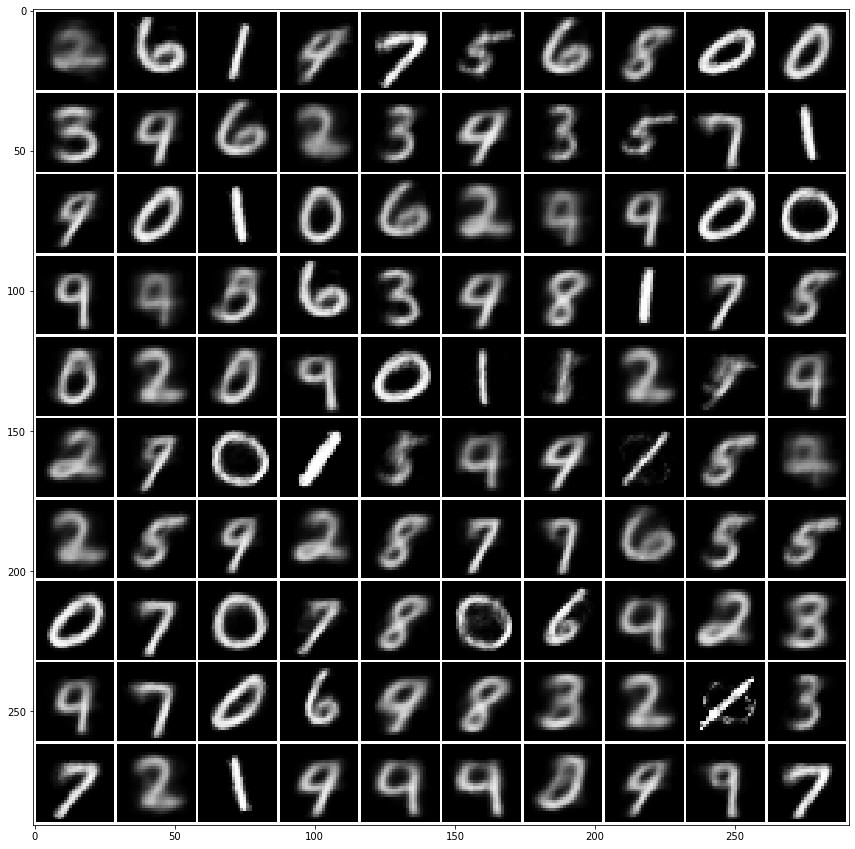

In [369]:
grid = make_grid(images, pad_value=1, padding=1, nrow=10)[0].detach().numpy()
plt.figure(figsize=(15, 15))
plt.imshow(grid, cmap='gray');

In [443]:
vae.cpu()
x, y = next(iter(valid_dl))
mu, _ = vae.encode(x) 

mu = mu[:10]
y = y[:10]
mu.shape, y

(torch.Size([10, 10]), tensor([7, 2, 1, 0, 4, 1, 4, 9, 5, 9]))

In [447]:
locs = [torch.zeros(1, 28, 28) for i in range(10)]
locs_cnt = [0] * 10
for i, (x, y) in enumerate(valid_dl.dataset):
    mu, _ = vae.encode(x.unsqueeze(0)) 
    locs[y] += mu
    locs_cnt +

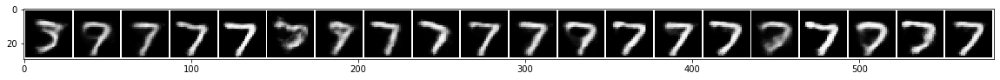

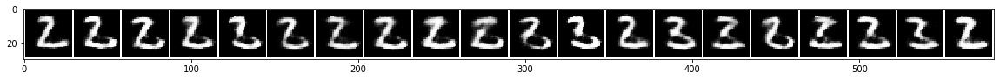

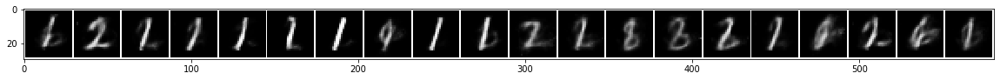

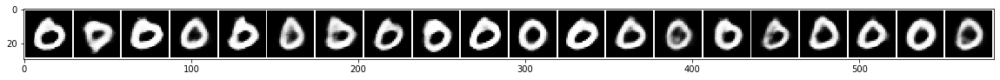

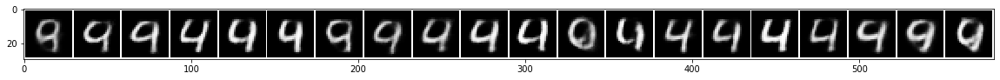

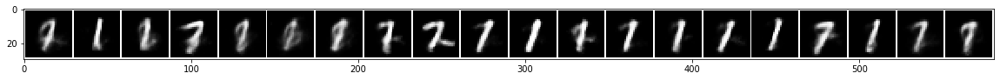

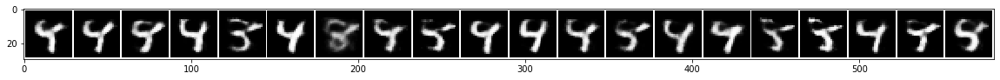

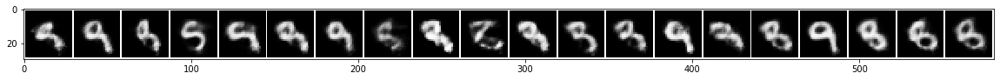

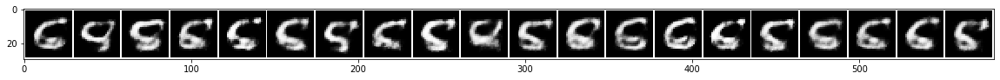

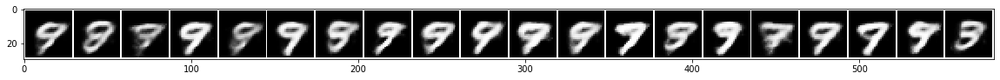

In [446]:
for i in range(y.shape[0]):
    x_recon = []
    for j in range(20):
        loc = mu[i].unsqueeze(0).clone()
        loc += torch.empty_like(loc).normal_()/3
        x_recon.append(vae.decode(loc))
    x_recon = torch.cat(x_recon)
    grid = make_grid(x_recon, pad_value=1, padding=1, nrow=20)[0].detach().numpy()
    plt.figure(figsize=(20, 5))
    plt.imshow(grid, cmap='gray')
    plt.show()

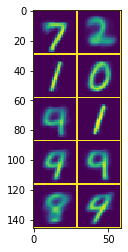

In [381]:
grid = make_grid(x_recon[0:10,...], pad_value=1, padding=1, nrow=2)[0].detach().numpy()
plt.imshow(grid)